# Envs

In [108]:
import pandas as pd
import ast
import json
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import os
import numpy as np






In [109]:
print(os.getcwd())


c:\Users\lhg45\Desktop\COMP90095\SysP


In [110]:
def update_Cones_Map(heading_angle_in_radians, wheel_speed, Map):
  v = wheel_speed
  x = np.cos(heading_angle_in_radians)
  y = np.sin(heading_angle_in_radians)
  dt = 0.1

  derta_x = x * wheel_speed * dt
  derta_y = y * wheel_speed * dt

  new_x, new_y, new_c = [], [], []

  for x, y, c in zip(Map["x_list"], Map["y_list"], Map["c_list"]):

      x_new = x - derta_x
      y_new = y - derta_y

      new_x.append(x_new)
      new_y.append(y_new)
      new_c.append(c)



  return {
      "x_list": new_x,
      "y_list": new_y,
      "c_list": new_c
  }

def filter_x_range(Map, x_min=0.0, x_max=750.0):
  """Keep only points with x in (x_min, x_max)."""
  fx, fy, fc = [], [], []
  for x, y, c in zip(Map["x_list"], Map["y_list"], Map["c_list"]):
      if x_min < x < x_max:
          fx.append(x); fy.append(y); fc.append(c)
  return {"x_list": fx, "y_list": fy, "c_list": fc}


def merge_maps(base, addon, vision = 750):
    filtered_x, filtered_y, filtered_c = [], [], []
    for x, y, c in zip(base["x_list"], base["y_list"], base["c_list"]):
        if x > vision:
            filtered_x.append(x)
            filtered_y.append(y)
            filtered_c.append(c)

    return {
        "x_list": list(addon["x_list"]) + filtered_x,
        "y_list": list(addon["y_list"]) + filtered_y,
        "c_list": list(addon["c_list"]) + filtered_c,
    }

def is_empty_detection(frame):
    xs = frame.get("x_list", [])
    ys = frame.get("y_list", [])
    cs = frame.get("c_list", [])

    return (not xs) or (not ys) or (not cs)


def frame_to_map(frame):
  """Convert frame dict to map structure."""
  return {
      "x_list": frame.get("x_list", []),
      "y_list": frame.get("y_list", []),
      "c_list": frame.get("c_list", []),
  }





In [123]:
def select_degree(n_points: int) -> int:
    """
    按点数选择拟合阶数：
      - 2点 -> 1阶
      - 3点 -> 2阶
      - 其它 -> 3阶
    """
    if n_points <= 2:
        return 1
    return 2

def weighted_polyfit(x, y, degree: int, weights=None, l2: float = 0.0) -> np.poly1d:

    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()
    n = len(x)

    # 防欠定：最多 n-1 阶；最低 0 阶
    degree = int(max(0, min(degree, max(0, n - 1))))

    # Vandermonde：高次到常数
    V = np.vstack([x ** k for k in range(degree, -1, -1)]).T  # (n, degree+1)

    if weights is not None:
        w = np.asarray(weights, dtype=float).ravel()
        W = np.diag(w)
        A = V.T @ W @ V
        b = V.T @ W @ y
    else:
        A = V.T @ V
        b = V.T @ y

    if l2 > 0:
        A = A + l2 * np.eye(A.shape[0])

    coeffs = np.linalg.solve(A, b)  # [a_d, ..., a_0]
    return np.poly1d(coeffs)

def safe_plot(x, y, *args, **kwargs):
    """只绘制 y 在 [-5000, 5000] 内的部分，避免极端值把图拉飞。"""
    y = np.asarray(y)
    x = np.asarray(x)
    mask = (y <= 5000) & (y >= -5000)
    if np.any(mask):
        plt.plot(x[mask], y[mask], *args, **kwargs)

def _scatter_line(x, y, color, label=None):
    safe_plot(x, y, color=color, label=label)

def _scatter_pts(x, y, color, s=10, label=None):
    plt.scatter(x, y, s=s, color=color, label=label)

# ========= 处理函数 =========

def handle_no_points(degree: int = 1):
    """
    没有任何点时，返回常数多项式 0 并做一个占位图。
    """
    x_fit = np.linspace(0, 100, 300)
    poly_middle = np.poly1d([0.0])
    plt.figure(figsize=(8, 6))
    plt.plot(x_fit, poly_middle(x_fit), color='green', linestyle='--', label='Default Middle Line')
    plt.title("Default Middle Line y=0")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_two_valid_groups(
    valid_groups, x_fit_full, degree, default_offset, color_map,
    ridge: float = 0.0, tail_boost: float = 2.0, bandwidth: float = 400.0,
):
    plt.figure(figsize=(8, 6))
    x_fit = x_fit_full

    assert len(valid_groups) >= 2
    (c1, n1, x1, y1), (c2, n2, x2, y2) = sorted(valid_groups, key=lambda g: np.min(g[2]))

    # 各自拟合边界
    deg1 = select_degree(len(x1))
    deg2 = select_degree(len(x2))
    p1 = weighted_polyfit(x1, y1, deg1)
    p2 = weighted_polyfit(x2, y2, deg2)

    # 可视化原始拟合曲线与散点
    safe_plot(x_fit, p1(x_fit), color=color_map.get(c1, 'gray'), label=f'Fit {color_map.get(c1, "gray")}')
    safe_plot(x_fit, p2(x_fit), color=color_map.get(c2, 'gray'), label=f'Fit {color_map.get(c2, "gray")}')
    _scatter_pts(x1, y1, color=color_map.get(c1, 'gray'))
    _scatter_pts(x2, y2, color=color_map.get(c2, 'gray'))

    # 垂直偏移（蓝上黄下 or 黄上蓝下）
    off1 = (+default_offset if c1 == 1 else -default_offset)
    off2 = (+default_offset if c2 == 1 else -default_offset)
    y_t1 = p1(x_fit) + off1
    y_t2 = p2(x_fit) + off2

    # ✅ 可视化偏移后的曲线
    safe_plot(x_fit, y_t1, color=color_map.get(c1, 'gray'), linestyle=':', label=f'Offset {color_map.get(c1, "gray")}')
    safe_plot(x_fit, y_t2, color=color_map.get(c2, 'gray'), linestyle=':', label=f'Offset {color_map.get(c2, "gray")}')

    # 支撑度权重（最近距离核）
    def support_weight(xq, xs, h):
        xs = np.asarray(xs)
        dmin = np.min(np.abs(xq[:, None] - xs[None, :]), axis=1)
        return np.exp(-(dmin ** 2) / (2.0 * (h ** 2)))

    w1 = support_weight(x_fit, x1, bandwidth)
    w2 = support_weight(x_fit, x2, bandwidth)
    s = w1 + w2 + 1e-8
    y_target_blend = (w1 / s) * y_t1 + (w2 / s) * y_t2

    # 最终中线拟合（无尾部加权）
    deg_mid = select_degree(len(x_fit))
    poly_middle = weighted_polyfit(x_fit, y_target_blend, deg_mid, l2=ridge)

    safe_plot(x_fit, poly_middle(x_fit), color='green', linestyle='--',
              label='Middle Line (weighted blend)')
    plt.title("Two valid groups: weighted blend with offset visualization")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_one_valid_one_single(
    valid_group, single_group, x_fit_full, degree, color_map,
    default_offset: float = 500.0, ridge: float = 0.0, tail_boost: float = 2.0
):
    """
    一边是有效组，另一边只有 1 个点：
    - 拟合有效组得到边界，然后用“单点”诱导的竖直偏移作为目标
    - 从有效组的最小 x 起对目标曲线拟合中线
    """
    color, _, x_vals, y_vals = valid_group
    xs = np.asarray(x_vals, float); ys = np.asarray(y_vals, float)
    deg_base = select_degree(len(xs))
    base_poly = weighted_polyfit(xs, ys, deg_base)
    c_name = color_map.get(color, 'gray')

    plt.figure(figsize=(8, 6))
    _scatter_line(x_fit_full, base_poly(x_fit_full), color=c_name, label=f'Color {c_name}')
    _scatter_pts(xs, ys, color=c_name)

    sc, _, x_s, y_s = single_group
    x_sv, y_sv = float(x_s[0]), float(y_s[0])

    # 单点诱导的竖直偏移（与先前逻辑一致：取该点与边界的差的一半）
    y_at_sv = base_poly(x_sv)
    offset_point = (y_sv - y_at_sv) / 2.0
    y_target_full = base_poly(x_fit_full) + offset_point

    x_start = float(np.min(xs))
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = y_target_full[idx0:]
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    _scatter_pts([x_sv], [y_sv], color=color_map.get(sc, 'gray'), label=f'Single ({color_map.get(sc, "gray")})')
    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (vertical offset)')
    plt.title("One valid + one single: direct fit on vertical-offset target")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_one_valid_only(
    valid_group, x_fit_full, degree, default_offset, color_map,
    ridge: float = 0.0, tail_boost: float = 2.0
):

    color, _, x_vals, y_vals = valid_group
    xs = np.asarray(x_vals, float); ys = np.asarray(y_vals, float)
    deg_base = select_degree(len(xs))
    base_poly = weighted_polyfit(xs, ys, deg_base)
    c_name = color_map.get(color, 'gray')

    plt.figure(figsize=(8, 6))
    _scatter_line(x_fit_full, base_poly(x_fit_full), color=c_name, label=f'Color {c_name}')
    _scatter_pts(xs, ys, color=c_name)

    offset = default_offset if color == 0 else -default_offset
    y_target_full = base_poly(x_fit_full) - offset

    x_start = float(np.min(xs))
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = y_target_full[idx0:]
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit_full, y_target_full, linestyle=':', label='Target (vertical offset)')
    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (vertical offset)')
    plt.title("Single valid group: direct fit on vertical-offset target")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_two_single_points(
    single_groups, x_fit_full, degree, color_map, ridge: float = 0.0, tail_boost: float = 2.0
):

    (c1, _, x1, y1), (c2, _, x2, y2) = single_groups
    x1v, y1v = float(x1[0]), float(y1[0])
    x2v, y2v = float(x2[0]), float(y2[0])

    plt.figure(figsize=(8, 6))
    _scatter_pts([x1v], [y1v], color=color_map.get(c1, 'gray'), label=f'Single ({color_map.get(c1, "gray")})')
    _scatter_pts([x2v], [y2v], color=color_map.get(c2, 'gray'), label=f'Single ({color_map.get(c2, "gray")})')

    x_start = min(x1v, x2v)
    target_const = (y1v + y2v) / 2.0
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = np.full_like(X, target_const, dtype=float)
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (constant target)')
    plt.title("Two single points: constant target fit")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_one_single_point(
    single_group, x_fit_full, degree, default_offset, color_map, ridge: float = 0.0, tail_boost: float = 2.0
):
    """
    只有一个单点：
    - 若该点 y 附近跨过 0（|y|<=50），按颜色给一个固定竖直偏移，否则以该点 y 作为常值目标
    - 从该点 x 起拟合中线
    """
    color, _, x_s, y_s = single_group
    x_sv, y_sv = float(x_s[0]), float(y_s[0])
    c_name = color_map.get(color, 'gray')

    plt.figure(figsize=(8, 6))
    _scatter_pts([x_sv], [y_sv], color=c_name, label=f'Single ({c_name})')

    if c_name == 'blue':
        ymid = y_sv + default_offset
    elif c_name == 'yellow':
        ymid = y_sv - default_offset


    x_start = x_sv
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = np.full_like(X, ymid, dtype=float)
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (constant/offset target)')
    plt.title("One single point: constant/offset target fit")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_error_case():
    print("Error case, no middle line generated")
    return None


In [112]:
def clean_single_far_point(frame,
              yellow_code=0,
              blue_code=1,
              half_rule='midpoint',   # 'midpoint' 或 'median'
              include_equal=False):


    x_list = frame.get('x_list', [])
    y_list = frame.get('y_list', [])
    c_list = frame.get('c_list', [])
    if not x_list or not y_list or not c_list:
        return []

    x = np.asarray(x_list, dtype=float)
    y = np.asarray(y_list, dtype=float)
    c = np.asarray(c_list, dtype=int)

    # 按颜色分组索引
    idx_yellow = np.where(c == yellow_code)[0]
    idx_blue   = np.where(c == blue_code)[0]

    to_remove = []

    def half_threshold(xs_other):
        if xs_other.size == 0:
            return None
        if half_rule == 'median':
            return float(np.median(xs_other))
        else:  # 'midpoint'
            return float((xs_other.min() + xs_other.max()) / 2.0)

    # 检查黄
    if idx_yellow.size == 1 and idx_blue.size >= 1:
        i = idx_yellow[0]
        thr = half_threshold(x[idx_blue])
        if thr is not None:
            cond = (x[i] >= thr) if include_equal else (x[i] > thr)
            if cond:
                to_remove.append(i)

    # 检查蓝
    if idx_blue.size == 1 and idx_yellow.size >= 1:
        i = idx_blue[0]
        thr = half_threshold(x[idx_yellow])
        if thr is not None:
            cond = (x[i] >= thr) if include_equal else (x[i] > thr)
            if cond:
                to_remove.append(i)

    removed_info = []
    if to_remove:
        to_keep = np.ones(len(x_list), dtype=bool)
        to_keep[to_remove] = False

        # 记录被删点
        for i in to_remove:
            removed_info.append((int(c[i]), float(x[i]), float(y[i]), int(i)))

        # 原地更新 frame
        frame['x_list'] = [float(v) for v in x[to_keep]]
        frame['y_list'] = [float(v) for v in y[to_keep]]
        frame['c_list'] = [int(v)   for v in c[to_keep]]

    return removed_info

# ========= 入口 =========

def generate_middle_line(frame, degree=3, default_offset=500,
                         ridge=0.0, tail_boost=2.0):
    x_list = frame.get('x_list', [])
    y_list = frame.get('y_list', [])
    c_list = frame.get('c_list', [])
    color_map = {0: 'yellow', 1: 'blue'}

    removed = clean_single_far_point(frame,
                      yellow_code=0, blue_code=1,
                      half_rule='midpoint',  # 或 'median'
                      include_equal=False)

    if not x_list or not y_list:
        return handle_no_points(degree)

    # 分组
    color_groups = defaultdict(list)
    for x, y, c in zip(x_list, y_list, c_list):
        color_groups[c].append((x, y))

    group_info = []
    for color, pts in color_groups.items():
        pts_sorted = sorted(pts, key=lambda p: p[0])
        xs = np.array([p[0] for p in pts_sorted], dtype=float)
        ys = np.array([p[1] for p in pts_sorted], dtype=float)
        group_info.append((color, len(pts_sorted), xs, ys))

    valid_groups = [g for g in group_info if g[1] >= 2]
    single_groups = [g for g in group_info if g[1] == 1]

    # x 轴：从 0 开始到数据最大 x
    xs_all = np.concatenate([g[2] for g in group_info]) if group_info else np.array([0.0])
    x_max = float(xs_all.max()) if xs_all.size > 0 else 1.0
    x_fit_full = np.linspace(0.0, x_max, 400)

    if len(valid_groups) >= 2:
        return handle_two_valid_groups(valid_groups, x_fit_full, degree, default_offset, color_map,
                                       ridge=ridge, tail_boost=tail_boost)

    if len(valid_groups) == 1 and len(single_groups) == 1:
        _, _, x_vals, _ = valid_groups[0]
        median_x = float(np.median(x_vals))
        _, _, x_s, _ = single_groups[0]
        x_sv = float(x_s[0])
        if x_sv > median_x:
            return handle_one_valid_only(valid_groups[0], x_fit_full, degree, default_offset, color_map,
                                        ridge=ridge, tail_boost=tail_boost)
        else:
            return handle_one_valid_one_single(valid_groups[0], single_groups[0], x_fit_full, degree, color_map,
                                               default_offset=default_offset,
                                               ridge=ridge, tail_boost=tail_boost)

    if len(valid_groups) == 1 and not single_groups:
        return handle_one_valid_only(valid_groups[0], x_fit_full, degree, default_offset, color_map,
                                     ridge=ridge, tail_boost=tail_boost)

    if not valid_groups and len(single_groups) == 2:
        return handle_two_single_points(single_groups, x_fit_full, degree, color_map,
                                        ridge=ridge, tail_boost=tail_boost)

    if not valid_groups and len(single_groups) == 1:
        return handle_one_single_point(single_groups[0], x_fit_full, degree, default_offset, color_map,
                                       ridge=ridge, tail_boost=tail_boost)

    return handle_error_case()


In [113]:
def iter_frames(path):
    with open(path, "r", encoding="utf-8") as f:
        text = f.read().replace("}{", "}\n{")

    for lineno, line in enumerate(text.splitlines(), 1):
        s = line.strip()
        if not s:
            continue
        try:
            yield json.loads(s)
        except json.JSONDecodeError as e:
            raise ValueError(f"第 {lineno} 行不是合法 JSON：{e}")

In [114]:
def process_frame_and_update(
    x_array,
    y_array,
    c_array,
    Global_Map,
    heading_angle_in_radians = 0.0,
    wheel_speed = 1000.0
):
    frame = {
        "x_list": list(x_array),
        "y_list": list(y_array),
        "c_list": list(c_array),
        "heading_angle_in_radians": heading_angle_in_radians,
        "wheel_speed": wheel_speed
    }

    if is_empty_detection(frame):
        return generate_middle_line(Global_Map), Global_Map

    if is_empty_detection(Global_Map):
        Global_Map = frame_to_map(frame)
        return generate_middle_line(Global_Map), Global_Map

    predicted_map = update_Cones_Map(heading_angle_in_radians, wheel_speed, Global_Map)

    predicted_filtered = filter_x_range(predicted_map, x_min=0.0, x_max=750.0)

    current_map = frame_to_map(frame)

    fused_map = merge_maps(current_map, predicted_filtered)

    poly_middle = generate_middle_line(fused_map)

    Global_Map = fused_map

    return poly_middle, Global_Map

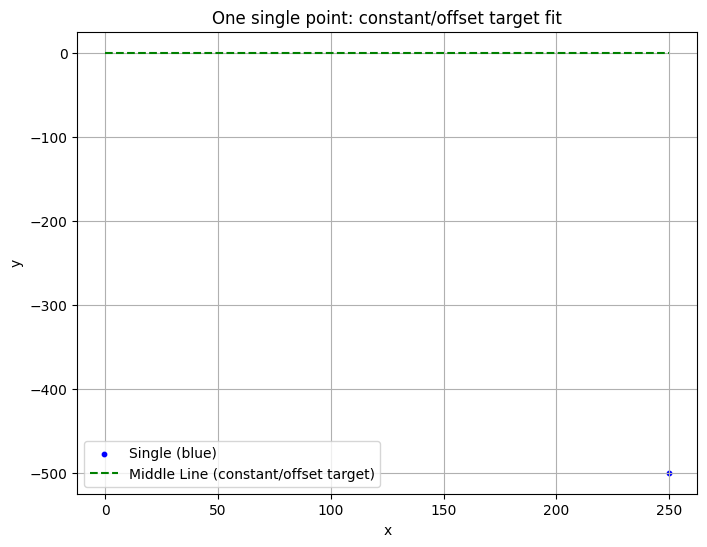

In [124]:
Global_Map = {"x_list":[250], "y_list":[-500], "c_list":[1]}
frame = {"x_list":[], "y_list":[], "c_list":[]}
#frame = {"x_list": [1591.6295166015625, 937.0015258789062, 1090.452880859375, 1596.94873046875, 1393.5211181640625, 1222.59130859375, 1786.6571044921875, 1183.617919921875], "y_list": [941.4361572265625, -567.6094970703125, -446.7615661621094, -241.9689178466797, -316.5453796386719, -390.3728942871094, -189.7828826904297, 748.6251831054688], "c_list": [0, 1, 1, 1, 1, 1, 1, 0], "n": 8}
poly_middle = process_frame_and_update(frame.get("x_list", []),
                                  frame.get("y_list", []),
                                    frame.get("c_list", []),
                                    Global_Map
        )



{'x_list': [693.304931640625, 489.2293701171875, 1248.4637451171875, 1587.8184814453125, 1051.5029296875, 884.4118041992188, 2718.425048828125, 1921.4609375, 2432.109375, 3438.187255859375, 2954.537109375, 3655.785888671875, 3386.92431640625, 1136.4085693359375, 3865.361328125], 'y_list': [406.3970947265625, 376.5016174316406, 304.2276916503906, 211.0911865234375, 333.0987854003906, 413.55303955078125, -283.5693359375, 112.7289047241211, -26.5888671875, -1068.9130859375, -539.6735229492188, -1273.34716796875, -935.94482421875, -772.7198486328125, -1502.950927734375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]}


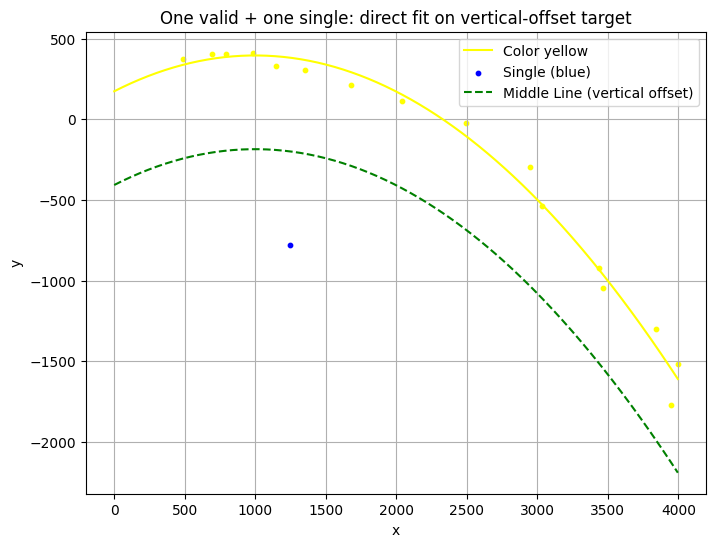

{'x_list': [593.304931640625, 389.2293701171875, 693.304931640625, 1252.2200927734375, 1582.0382080078125, 884.4118041992188, 1938.0985107421875, 2851.056884765625, 1045.993408203125, 2394.127685546875, 3365.48486328125, 2936.13623046875, 3741.14453125, 3339.4833984375, 1149.321533203125, 3896.58447265625, 3845.684326171875], 'y_list': [406.3970947265625, 376.5016174316406, 406.3970947265625, 305.07513427734375, 210.3682861328125, 412.55889892578125, 113.6567153930664, -296.9137878417969, 331.5050048828125, -26.19003677368164, -1046.9490966796875, -536.4224243164062, -1298.679443359375, -923.2109375, -780.7900390625, -1514.7850341796875, -1771.841796875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]}


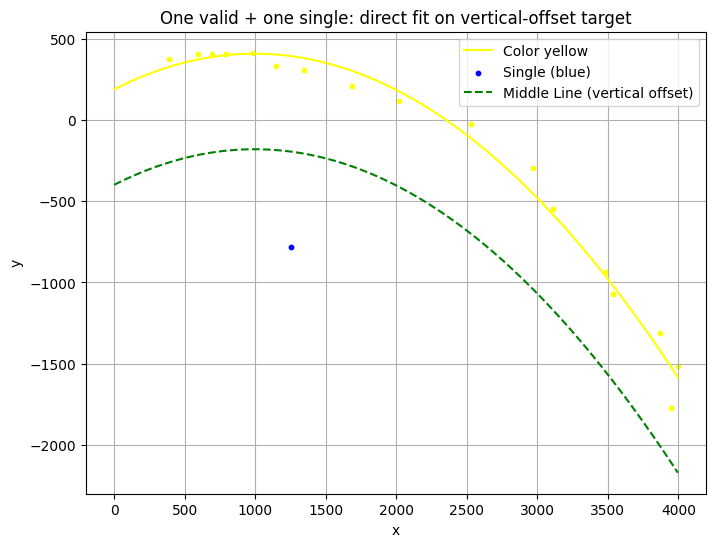

{'x_list': [493.304931640625, 289.2293701171875, 593.304931640625, 693.304931640625, 1248.4637451171875, 1587.8184814453125, 882.3609619140625, 2868.518798828125, 1921.4609375, 1048.7415771484375, 2432.109375, 3438.187255859375, 3011.1025390625, 3770.466552734375, 3386.92431640625, 1152.592041015625, 3845.684326171875, 3896.58447265625], 'y_list': [406.3970947265625, 376.5016174316406, 406.3970947265625, 406.3970947265625, 304.2276916503906, 211.0911865234375, 412.6914978027344, -298.6706848144531, 112.7289047241211, 332.29998779296875, -26.5888671875, -1068.9130859375, -549.6674194335938, -1312.22802734375, -935.94482421875, -782.833984375, -1771.841796875, -1514.7850341796875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]}


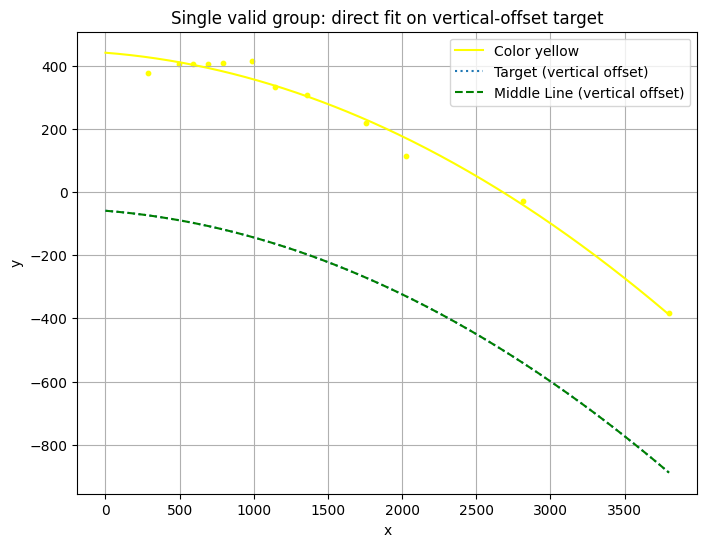

{'x_list': [393.304931640625, 189.2293701171875, 493.304931640625, 593.304931640625, 694.675048828125, 1259.7955322265625, 1654.1256103515625, 888.539306640625, 3700.603515625, 1929.74560546875, 1045.993408203125, 2718.2236328125, 1152.592041015625], 'y_list': [406.3970947265625, 376.5016174316406, 406.3970947265625, 406.3970947265625, 407.0989990234375, 306.78424072265625, 219.38406372070312, 414.2887268066406, -382.38897705078125, 113.19091796875, 331.5050048828125, -29.59326171875, -782.833984375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


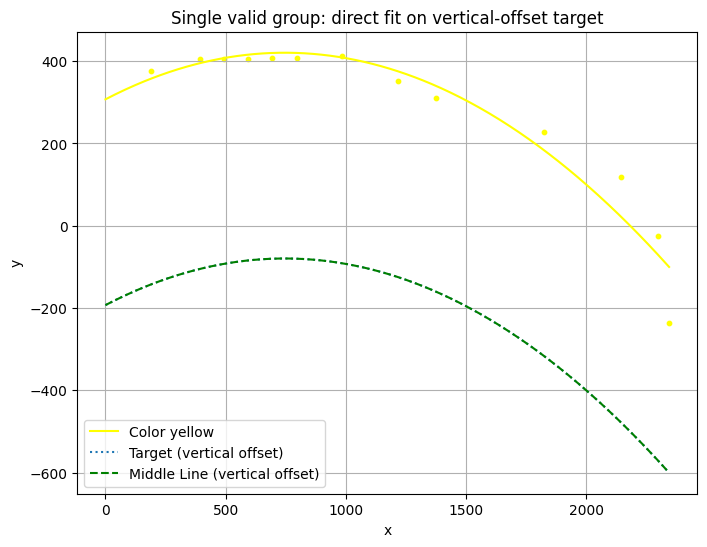

{'x_list': [293.304931640625, 89.2293701171875, 393.304931640625, 493.304931640625, 594.675048828125, 694.675048828125, 1275.203857421875, 1725.855712890625, 2244.297607421875, 1115.8001708984375, 884.4118041992188, 2043.9736328125, 2198.7353515625, 1155.8795166015625], 'y_list': [406.3970947265625, 376.5016174316406, 406.3970947265625, 406.3970947265625, 407.0989990234375, 407.0989990234375, 311.6094665527344, 228.3551483154297, -235.8660888671875, 351.6982116699219, 412.55889892578125, 119.56096649169922, -24.138282775878906, -784.8886108398438], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


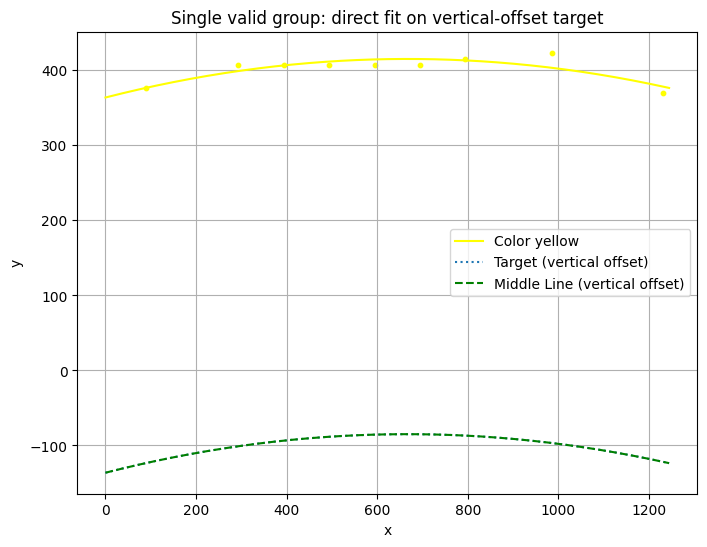

{'x_list': [193.304931640625, -10.7706298828125, 293.304931640625, 393.304931640625, 494.675048828125, 594.675048828125, 693.7507934570312, 886.844482421875, 1130.41650390625], 'y_list': [406.3970947265625, 376.5016174316406, 406.3970947265625, 406.3970947265625, 407.0989990234375, 407.0989990234375, 415.3232116699219, 423.3840026855469, 369.1336669921875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0]}


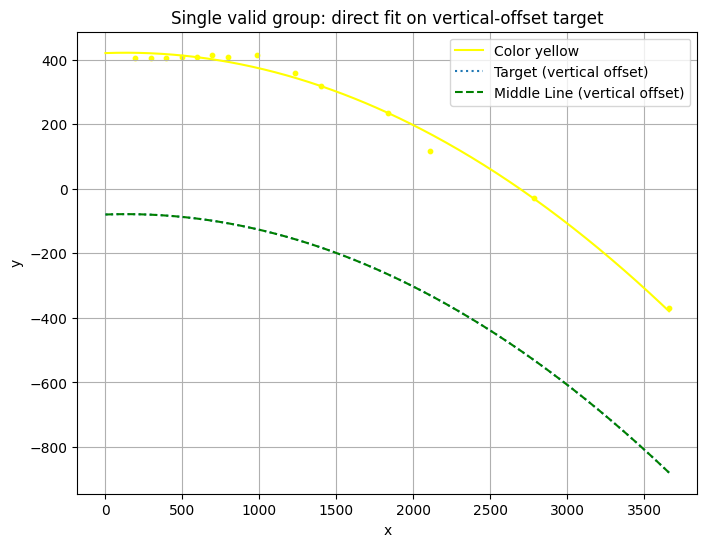

{'x_list': [93.304931640625, 193.304931640625, 293.304931640625, 394.675048828125, 494.675048828125, 593.7507934570312, 694.675048828125, 1737.5281982421875, 1298.4686279296875, 1131.4273681640625, 886.4712524414062, 3560.59326171875, 2005.203369140625, 2683.745361328125, 1155.411376953125], 'y_list': [406.3970947265625, 406.3970947265625, 406.3970947265625, 407.0989990234375, 407.0989990234375, 415.3232116699219, 407.9214172363281, 233.63259887695312, 318.3698425292969, 359.8910827636719, 415.4143981933594, -368.43316650390625, 117.52589416503906, -29.262609481811523, -787.3883056640625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


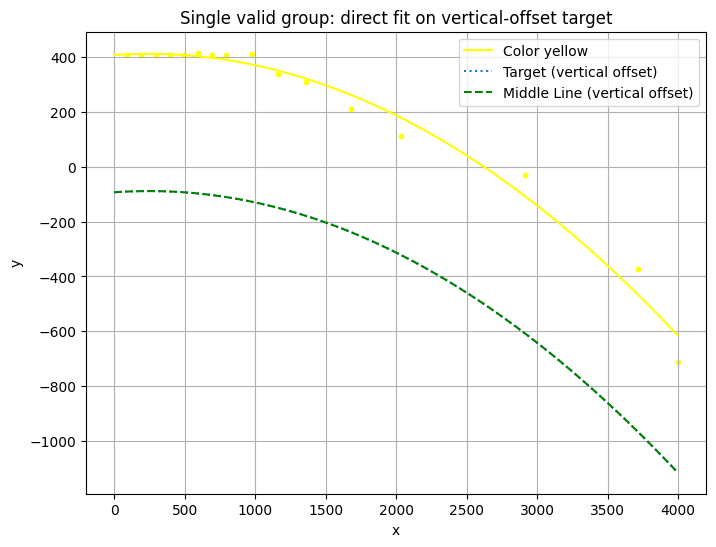

{'x_list': [-6.695068359375, 93.304931640625, 193.304931640625, 294.675048828125, 394.675048828125, 493.75079345703125, 594.675048828125, 694.675048828125, 1259.2958984375, 1580.8165283203125, 880.318603515625, 3614.824462890625, 1936.63037109375, 1059.8675537109375, 2815.022216796875, 3898.5732421875, 1138.6875], 'y_list': [406.3970947265625, 406.3970947265625, 406.3970947265625, 407.0989990234375, 407.0989990234375, 415.3232116699219, 407.9214172363281, 407.9214172363281, 308.1180725097656, 211.99905395507812, 411.83349609375, -373.8914489746094, 111.6971206665039, 337.8243713378906, -30.631622314453125, -710.4944458007812, -775.9553833007812], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


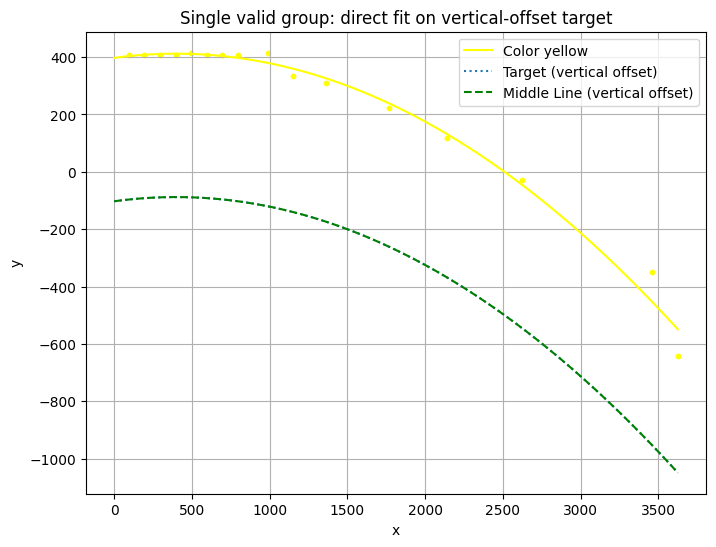

{'x_list': [-6.695068359375, 93.304931640625, 194.675048828125, 294.675048828125, 393.75079345703125, 494.675048828125, 594.675048828125, 693.304931640625, 1259.7955322265625, 1666.103515625, 886.4712524414062, 2043.201416015625, 1048.7415771484375, 3358.62939453125, 2524.458740234375, 3524.60595703125, 1151.6580810546875], 'y_list': [406.3970947265625, 406.3970947265625, 407.0989990234375, 407.0989990234375, 415.3232116699219, 407.9214172363281, 407.9214172363281, 407.2181091308594, 309.4519348144531, 222.6752471923828, 414.418212890625, 117.49957275390625, 333.44189453125, -348.1058044433594, -27.568456649780273, -644.0453491210938, -782.833984375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


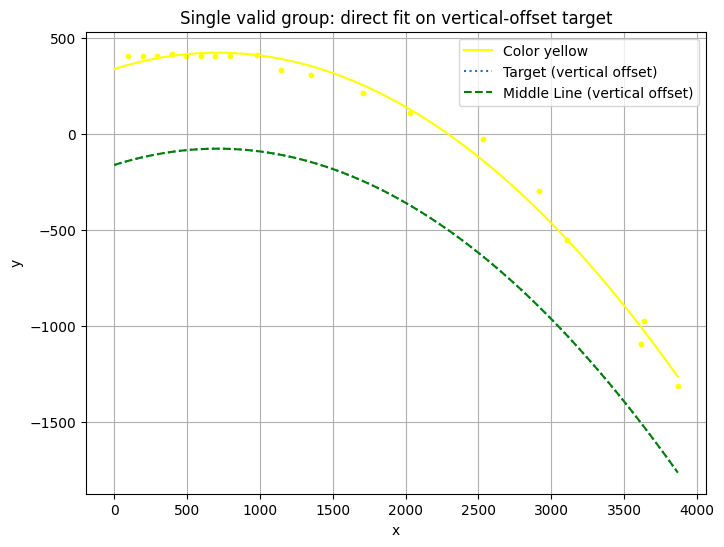

{'x_list': [-6.695068359375, 94.675048828125, 194.675048828125, 293.75079345703125, 394.675048828125, 494.675048828125, 593.304931640625, 693.304931640625, 1252.2200927734375, 1604.780517578125, 882.3609619140625, 1929.0145263671875, 1043.2584228515625, 2431.203857421875, 2816.7421875, 3010.00146484375, 3514.005615234375, 1151.6580810546875, 3769.104736328125, 3537.439208984375], 'y_list': [406.3970947265625, 407.0989990234375, 407.0989990234375, 415.3232116699219, 407.9214172363281, 407.9214172363281, 407.2181091308594, 407.2181091308594, 307.72796630859375, 214.94346618652344, 412.6914978027344, 111.23934173583984, 331.8503112792969, -26.5888671875, -296.22979736328125, -549.6674194335938, -1091.818359375, -784.08056640625, -1312.22802734375, -976.3453369140625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]}


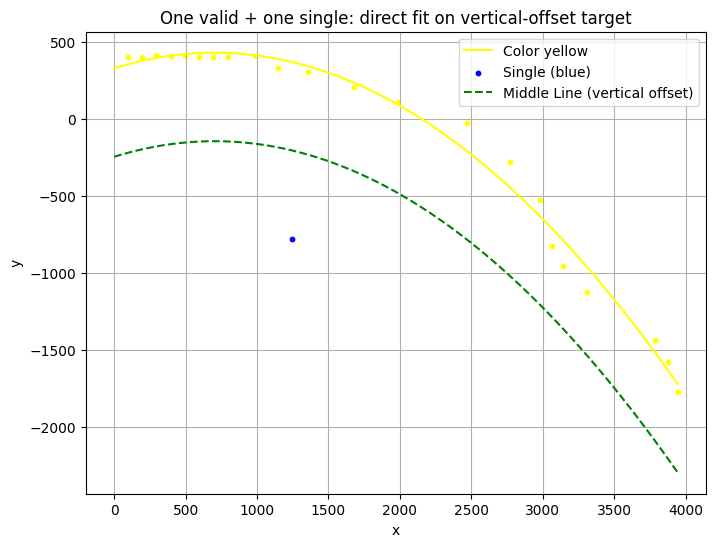

{'x_list': [-5.324951171875, 94.675048828125, 193.75079345703125, 294.675048828125, 394.675048828125, 493.304931640625, 593.304931640625, 693.304931640625, 1255.9971923828125, 1575.6885986328125, 1043.2584228515625, 1888.2713623046875, 882.3609619140625, 2368.55029296875, 2671.7109375, 3778.636474609375, 2882.240478515625, 3686.476318359375, 3212.762939453125, 3042.613525390625, 2964.26708984375, 1145.603515625, 3845.684326171875], 'y_list': [407.0989990234375, 407.0989990234375, 415.3232116699219, 407.9214172363281, 407.9214172363281, 407.2181091308594, 407.2181091308594, 407.2181091308594, 307.2574157714844, 211.27549743652344, 331.8503112792969, 109.00563049316406, 412.6914978027344, -25.930728912353516, -281.5001525878906, -1577.58154296875, -526.900146484375, -1435.654541015625, -1123.5416259765625, -952.3649291992188, -822.4970092773438, -778.7567138671875, -1771.841796875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]}


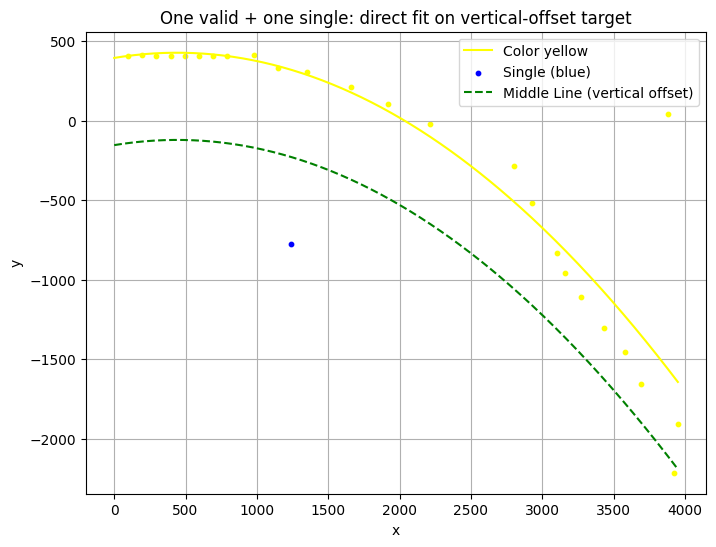

{'x_list': [-5.324951171875, 93.75079345703125, 194.675048828125, 294.675048828125, 393.304931640625, 493.304931640625, 593.304931640625, 693.304931640625, 1248.4637451171875, 1558.705322265625, 1045.993408203125, 882.3609619140625, 1818.9129638671875, 2702.6796875, 2116.209716796875, 3478.1787109375, 2830.224609375, 3329.50146484375, 3170.017578125, 3779.998291015625, 3062.2548828125, 3000.770751953125, 1139.149658203125, 3849.832763671875, 3588.357177734375, 3822.19384765625], 'y_list': [407.0989990234375, 415.3232116699219, 407.9214172363281, 407.9214172363281, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 305.5503845214844, 209.13418579101562, 332.6441955566406, 412.6914978027344, 105.2031021118164, -284.6453857421875, -23.280031204223633, -1455.37451171875, -517.7100219726562, -1303.06689453125, -1109.0443115234375, 43.61977005004883, -958.3171997070312, -832.5889892578125, -775.9553833007812, -1908.421142578125, -1656.2869873046875, -2212.4169921875]

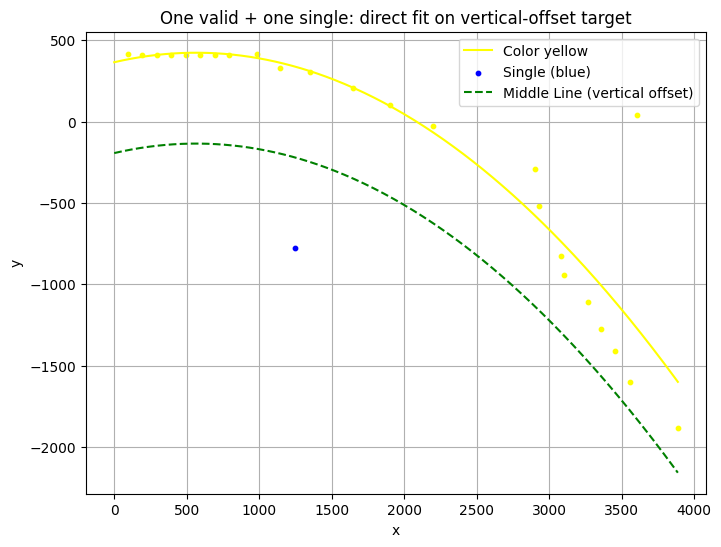

{'x_list': [-6.24920654296875, 94.675048828125, 194.675048828125, 293.304931640625, 393.304931640625, 493.304931640625, 593.304931640625, 693.304931640625, 1252.2200927734375, 1547.5731201171875, 882.3609619140625, 1043.2584228515625, 1804.152099609375, 2799.88232421875, 2096.68359375, 3356.471923828125, 2830.224609375, 3261.365966796875, 3170.017578125, 3504.821044921875, 3004.053955078125, 2981.86376953125, 1145.603515625, 3788.16845703125, 3459.3935546875], 'y_list': [415.3232116699219, 407.9214172363281, 407.9214172363281, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 306.40155029296875, 207.7305908203125, 412.6914978027344, 330.7138366699219, 104.39385223388672, -291.7649841308594, -25.17264175415039, -1409.111328125, -517.7100219726562, -1274.024658203125, -1109.0443115234375, 40.52616882324219, -940.6795043945312, -827.51220703125, -778.7567138671875, -1882.920166015625, -1598.374755859375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

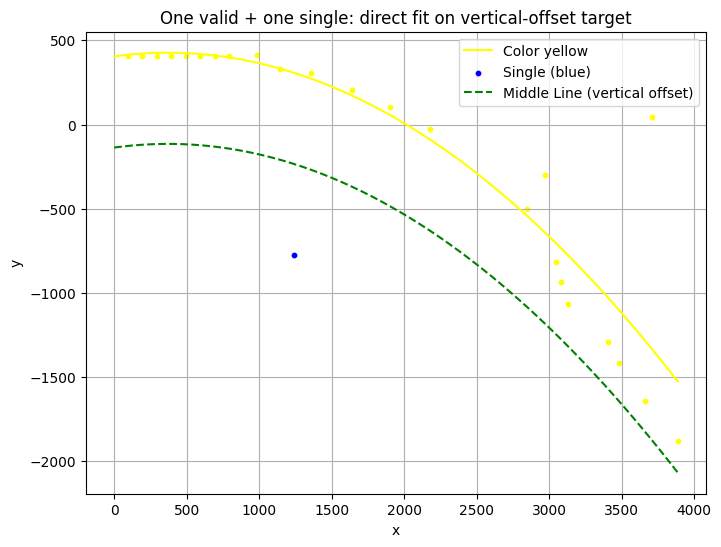

{'x_list': [-5.324951171875, 94.675048828125, 193.304931640625, 293.304931640625, 393.304931640625, 493.304931640625, 593.304931640625, 691.9395751953125, 1255.9971923828125, 1542.0628662109375, 882.3609619140625, 2868.518798828125, 1045.993408203125, 1804.152099609375, 2077.49853515625, 3380.146484375, 2747.449951171875, 3306.48486328125, 3028.720458984375, 3610.0712890625, 2985.126953125, 2944.73291015625, 1142.3681640625, 3788.16845703125, 3561.822021484375], 'y_list': [407.9214172363281, 407.9214172363281, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 406.5172119140625, 307.2574157714844, 207.03587341308594, 412.6914978027344, -298.6706848144531, 332.6441955566406, 104.39385223388672, -24.952791213989258, -1418.7626953125, -503.08544921875, -1294.321533203125, -1064.0621337890625, 41.70941162109375, -934.9436645507812, -817.5421752929688, -776.7339477539062, -1882.920166015625, -1644.37109375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

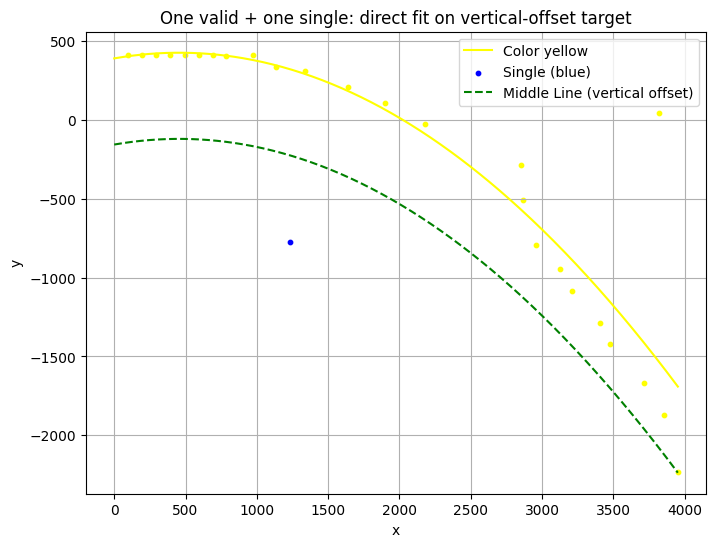

{'x_list': [-5.324951171875, 93.304931640625, 193.304931640625, 293.304931640625, 393.304931640625, 493.304931640625, 591.9395751953125, 684.5735473632812, 1240.52099609375, 1536.5892333984375, 1796.8565673828125, 875.8900146484375, 2750.45263671875, 2077.49853515625, 1037.8272705078125, 3380.146484375, 2763.62841796875, 3107.9287109375, 3306.48486328125, 3721.652099609375, 3023.21484375, 2855.705810546875, 1132.302490234375, 3615.279296875, 3758.71240234375, 3852.598388671875], 'y_list': [407.9214172363281, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 406.5172119140625, 404.6737976074219, 305.1777038574219, 206.34573364257812, 103.9938735961914, 411.11407470703125, -286.7917175292969, -24.952791213989258, 331.4049072265625, -1418.7626953125, -505.94384765625, -1087.986572265625, -1291.1256103515625, 42.96383285522461, -946.4861450195312, -793.637451171875, -771.9556274414062, -1668.3765869140625, -1868.655517578125, -2229.5673828125], 

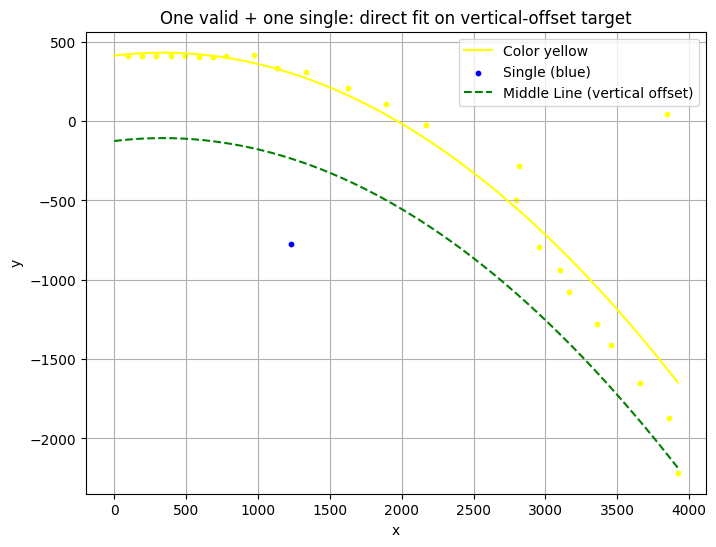

{'x_list': [-6.695068359375, 93.304931640625, 193.304931640625, 293.304931640625, 393.304931640625, 491.9395751953125, 584.5735473632812, 677.4403686523438, 1788.2550048828125, 1529.374267578125, 1231.1953125, 1031.1822509765625, 2066.480224609375, 2716.420654296875, 870.39453125, 2698.01025390625, 3747.9013671875, 2854.66259765625, 3355.258544921875, 3002.95947265625, 3066.714599609375, 3559.25537109375, 3260.1845703125, 3820.821533203125, 3758.71240234375, 1130.4635009765625], 'y_list': [407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 406.5172119140625, 404.6737976074219, 408.386962890625, 105.41444396972656, 207.2421875, 307.4255065917969, 332.08941650390625, -22.77394676208496, -283.5693359375, 415.30963134765625, -494.7006530761719, 43.28931427001953, -796.422119140625, -1412.350830078125, -940.6795043945312, -1077.36279296875, -1647.796875, -1277.1781005859375, -2216.079833984375, -1872.262939453125, -774.4100952148438], 'c_list': [0

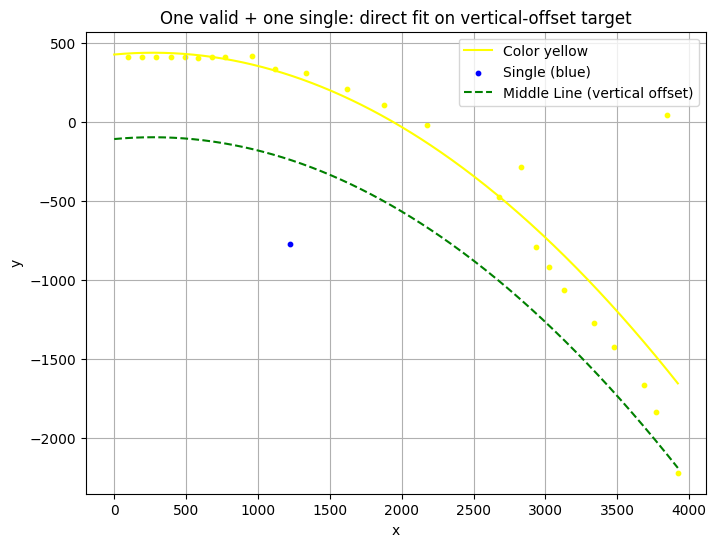

{'x_list': [-6.695068359375, 93.304931640625, 193.304931640625, 293.304931640625, 391.9395751953125, 484.57354736328125, 577.4403686523438, 668.4166259765625, 1773.2742919921875, 1230.705322265625, 2075.16162109375, 1019.33251953125, 1518.030517578125, 2731.324951171875, 861.3623657226562, 2836.447021484375, 2577.997314453125, 3746.550048828125, 2927.569091796875, 3378.924560546875, 3026.518310546875, 3585.77197265625, 3820.821533203125, 3236.904541015625, 3671.64208984375, 1124.09033203125], 'y_list': [407.2181091308594, 407.2181091308594, 407.2181091308594, 407.2181091308594, 406.5172119140625, 404.6737976074219, 408.386962890625, 409.0694885253906, 106.41957092285156, 308.73370361328125, -20.79399299621582, 333.43927001953125, 207.44583129882812, -285.17144775390625, 415.8075866699219, -794.560302734375, -473.6495666503906, 43.28931427001953, -920.9996337890625, -1425.285888671875, -1064.0621337890625, -1663.1878662109375, -2219.742919921875, -1271.908447265625, -1834.1844482421875,

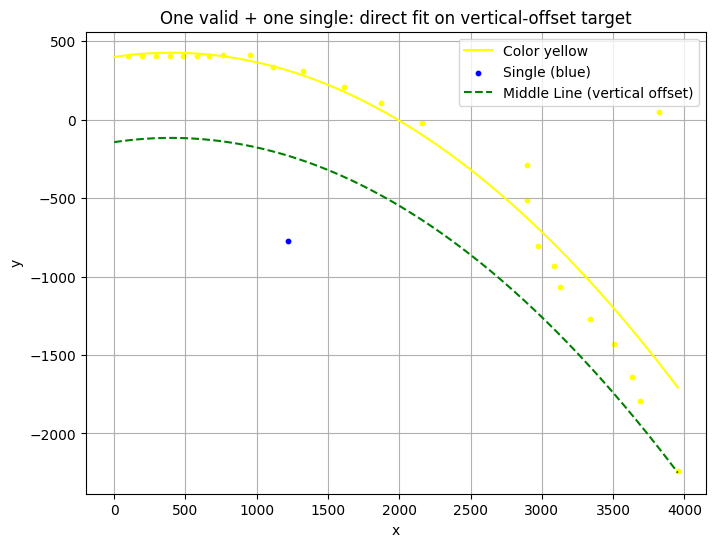

{'x_list': [-6.695068359375, 93.304931640625, 193.304931640625, 291.9395751953125, 384.57354736328125, 477.44036865234375, 568.4166259765625, 662.69921875, 1513.294921875, 1773.949951171875, 1016.300537109375, 1227.5482177734375, 2798.851318359375, 853.200439453125, 2057.87353515625, 2873.09228515625, 3720.31103515625, 2795.5185546875, 3535.666259765625, 2985.126953125, 3853.981201171875, 3239.251708984375, 3028.720458984375, 3590.9423828125, 3404.1474609375, 1117.3729248046875], 'y_list': [407.2181091308594, 407.2181091308594, 407.2181091308594, 406.5172119140625, 404.6737976074219, 408.386962890625, 409.0694885253906, 410.310546875, 209.89622497558594, 108.2232894897461, 334.8853454589844, 310.4970703125, -289.0124816894531, 415.33154296875, -18.552562713623047, -803.9080810546875, 46.544151306152344, -511.75933837890625, -1642.8294677734375, -934.9436645507812, -2240.641357421875, -1271.908447265625, -1067.00146484375, -1794.310791015625, -1431.8314208984375, -772.1220092773438], 'c

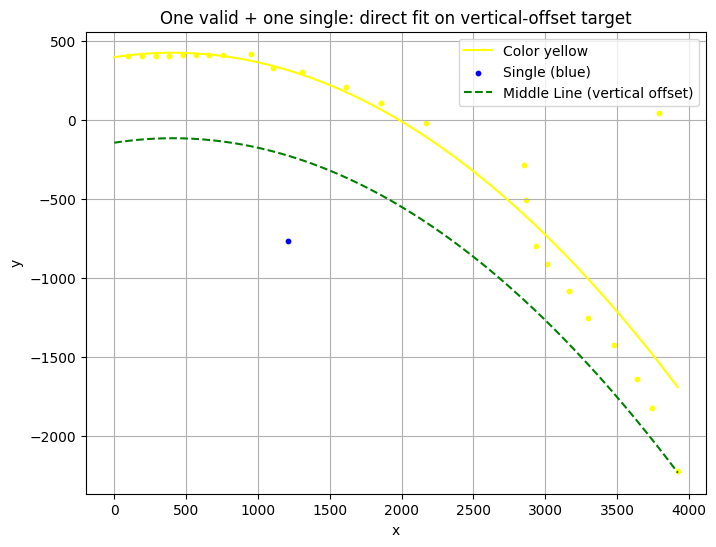

{'x_list': [-6.695068359375, 93.304931640625, 191.9395751953125, 284.57354736328125, 377.44036865234375, 468.4166259765625, 562.69921875, 659.8690185546875, 1513.294921875, 1759.189453125, 1005.96435546875, 2749.43896484375, 2067.255859375, 1205.5975341796875, 2838.521240234375, 851.2709350585938, 3691.80126953125, 2762.614990234375, 2910.60986328125, 3822.19384765625, 3535.666259765625, 3067.829345703125, 3195.884765625, 3645.220703125, 3380.146484375, 1108.103515625], 'y_list': [407.2181091308594, 407.2181091308594, 406.5172119140625, 404.6737976074219, 408.386962890625, 409.0694885253906, 410.310546875, 409.7383728027344, 209.89622497558594, 107.4095687866211, 331.7845153808594, -284.0861511230469, -18.633228302001953, 305.4755554199219, -794.560302734375, 416.418701171875, 46.19680404663086, -505.94384765625, -912.68310546875, -2223.406005859375, -1639.4281005859375, -1080.3388671875, -1255.39013671875, -1820.6976318359375, -1422.0242919921875, -766.2428588867188], 'c_list': [0, 0,

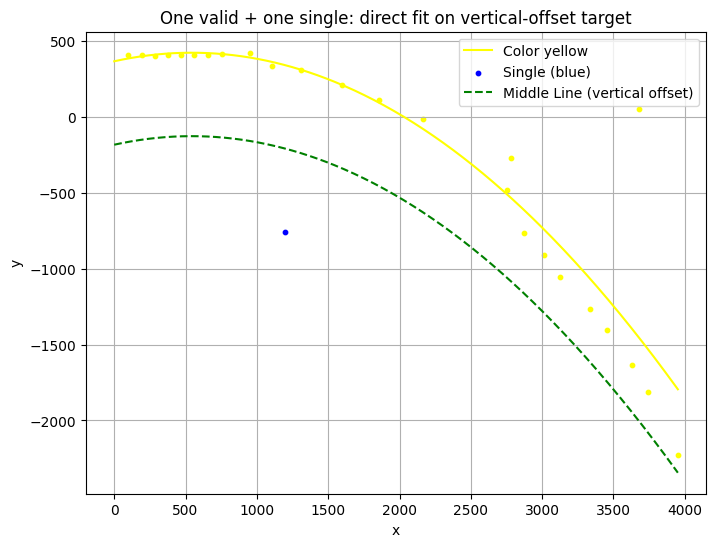

{'x_list': [-6.695068359375, 91.9395751953125, 184.57354736328125, 277.44036865234375, 368.4166259765625, 462.69921875, 559.8690185546875, 655.216552734375, 1008.1165771484375, 848.62841796875, 1208.1619873046875, 1496.94873046875, 2684.135986328125, 1758.5189208984375, 2652.141357421875, 3355.258544921875, 2066.480224609375, 2909.548095703125, 3581.89404296875, 3027.619384765625, 2770.72314453125, 3851.215576171875, 3645.220703125, 3238.078125, 3533.117919921875, 1095.0654296875], 'y_list': [407.2181091308594, 406.5172119140625, 404.6737976074219, 408.386962890625, 409.0694885253906, 410.310546875, 409.7383728027344, 413.2161560058594, 336.97369384765625, 419.42535400390625, 311.4490661621094, 212.4983673095703, -272.482177734375, 112.7800521850586, -478.7845764160156, -1402.6326904296875, -12.422152519226074, -907.01416015625, 55.20956039428711, -1055.243896484375, -762.9741821289062, -2229.5673828125, -1810.193603515625, -1262.5101318359375, -1632.6256103515625, -757.3455200195312],

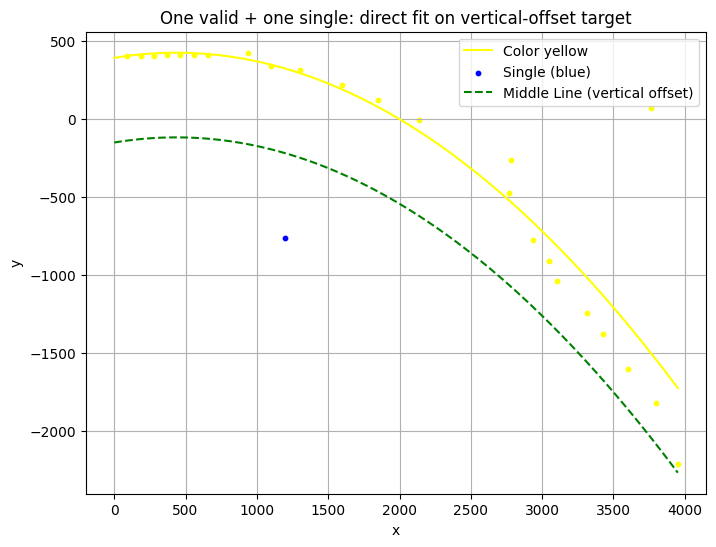

{'x_list': [-8.0604248046875, 84.57354736328125, 177.44036865234375, 268.4166259765625, 362.69921875, 459.8690185546875, 555.216552734375, 1200.6494140625, 1496.3677978515625, 838.0718383789062, 2683.14501953125, 1750.221923828125, 2835.409912109375, 997.1068115234375, 2665.302734375, 2037.05419921875, 3851.215576171875, 3661.0712890625, 2944.73291015625, 3504.821044921875, 3006.24267578125, 3213.9287109375, 3698.457275390625, 3329.50146484375, 1100.650634765625], 'y_list': [406.5172119140625, 404.6737976074219, 408.386962890625, 409.0694885253906, 410.310546875, 409.7383728027344, 413.2161560058594, 317.4549865722656, 220.2537841796875, 424.7547302246094, -261.9003601074219, 121.2749252319336, -772.4122924804688, 341.5377502441406, -473.5661315917969, -4.087402820587158, -2211.11083984375, 70.5455551147461, -906.4677734375, -1604.160888671875, -1040.005859375, -1241.8092041015625, -1822.9969482421875, -1380.28564453125, -761.1704711914062], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

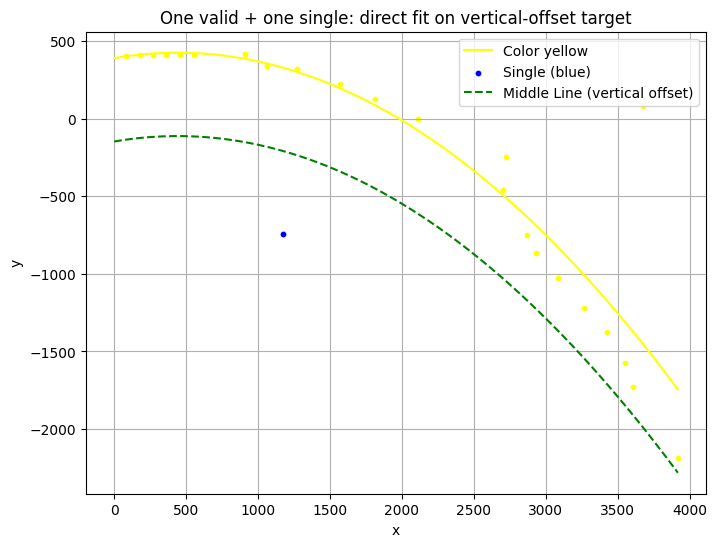

{'x_list': [-15.42645263671875, 77.44036865234375, 168.4166259765625, 262.69921875, 359.8690185546875, 455.216552734375, 808.671142578125, 1714.89892578125, 2603.915771484375, 2620.703125, 2766.6689453125, 963.2801513671875, 1468.498046875, 2008.376708984375, 1171.3895263671875, 3818.077392578125, 3578.01611328125, 3451.908935546875, 2986.214599609375, 2835.409912109375, 3168.86669921875, 1071.3267822265625, 3328.296142578125, 3507.351318359375], 'y_list': [404.6737976074219, 408.386962890625, 409.0694885253906, 410.310546875, 409.7383728027344, 413.2161560058594, 419.7802429199219, 126.04829406738281, -455.7015075683594, -245.85508728027344, -749.4462890625, 339.0674133300781, 224.35520935058594, 2.0177223682403564, 318.2903747558594, -2186.7763671875, 82.81434631347656, -1571.735107421875, -1024.9537353515625, -866.5413208007812, -1216.5694580078125, -744.2555541992188, -1373.8505859375, -1725.7392578125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0

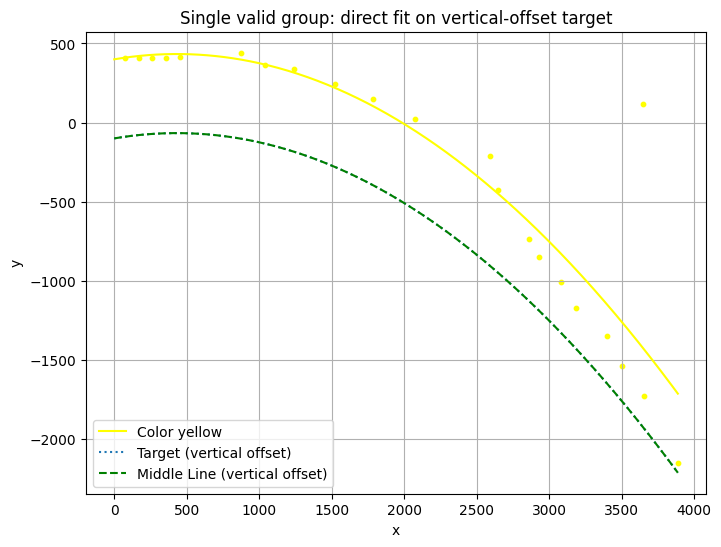

{'x_list': [-22.55963134765625, 68.4166259765625, 162.69921875, 259.8690185546875, 355.216552734375, 772.59326171875, 1140.1181640625, 1977.43359375, 2490.134033203125, 939.149658203125, 1424.2685546875, 2763.62841796875, 1684.71826171875, 2832.298583984375, 2543.23583984375, 3556.68896484375, 3400.456787109375, 2981.86376953125, 3547.70556640625, 3786.806640625, 3301.696044921875, 3083.265380859375], 'y_list': [408.386962890625, 409.0694885253906, 410.310546875, 409.7383728027344, 413.2161560058594, 441.2743225097656, 337.5004577636719, 23.908742904663086, -214.65220642089844, 362.358154296875, 241.0673828125, -735.9183349609375, 146.65040588378906, -849.9302978515625, -426.0580139160156, -1730.0155029296875, -1536.919921875, -1010.4359741210938, 116.47628021240234, -2151.90869140625, -1348.6510009765625, -1170.9896240234375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


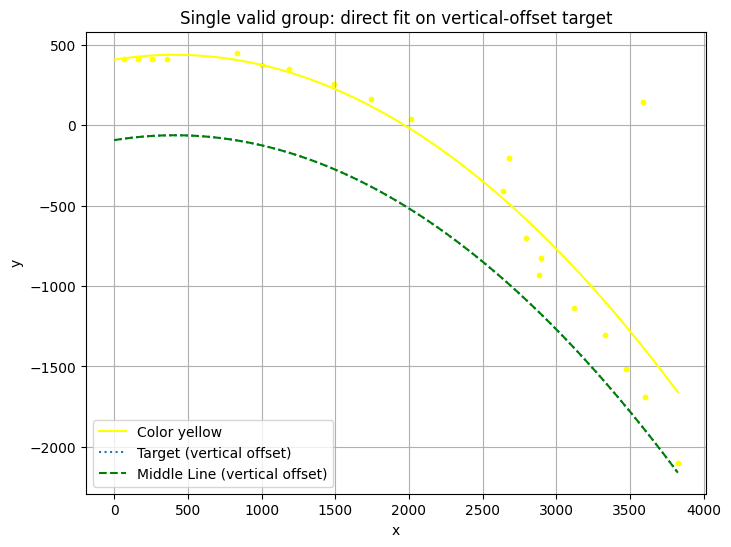

{'x_list': [-31.5833740234375, 62.69921875, 159.8690185546875, 255.216552734375, 732.7897338867188, 903.2623291015625, 1089.0909423828125, 1913.96875, 2582.81689453125, 2539.48046875, 1642.9501953125, 3231.03662109375, 3490.90478515625, 2696.028076171875, 1392.931396484375, 2784.0693359375, 3725.67578125, 2795.5185546875, 3021.0126953125, 3374.037353515625, 3502.290771484375], 'y_list': [409.0694885253906, 410.310546875, 409.7383728027344, 413.2161560058594, 450.3963928222656, 372.84075927734375, 347.388671875, 38.714019775390625, -202.24954223632812, -408.5144348144531, 160.41607666015625, -1303.236328125, 145.21878051757812, -701.04638671875, 257.0801086425781, -933.3175659179688, -2101.647216796875, -826.4775390625, -1134.607666015625, -1513.3470458984375, -1691.9674072265625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


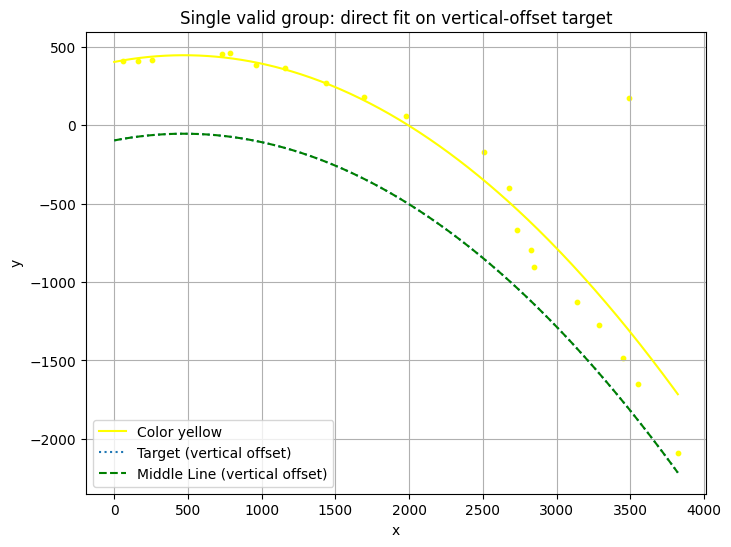

{'x_list': [-37.30078125, 59.8690185546875, 155.216552734375, 632.7897338867188, 688.2552490234375, 858.3082885742188, 1057.7078857421875, 1879.604736328125, 1591.793212890625, 2404.868408203125, 1336.761474609375, 2633.30615234375, 2578.96337890625, 3721.652099609375, 3390.614990234375, 2749.46533203125, 2727.444091796875, 3184.301513671875, 3038.181884765625, 3346.76416015625, 3448.166748046875], 'y_list': [410.310546875, 409.7383728027344, 413.2161560058594, 450.3963928222656, 460.6102600097656, 382.8895568847656, 363.1900329589844, 59.046627044677734, 175.69491577148438, -172.28712463378906, 269.0853576660156, -670.278564453125, -399.78955078125, -2087.325927734375, 170.76889038085938, -906.6298828125, -794.5291748046875, -1273.9427490234375, -1126.8665771484375, -1483.6160888671875, -1648.3238525390625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


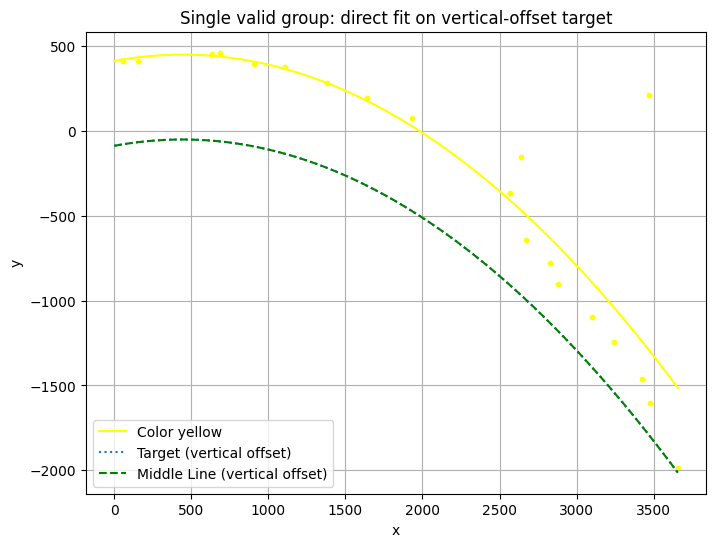

{'x_list': [-40.1309814453125, 55.216552734375, 532.7897338867188, 588.2552490234375, 810.1273803710938, 1539.0799560546875, 1832.5108642578125, 1010.7877197265625, 1281.0069580078125, 2468.142333984375, 2536.457275390625, 2727.444091796875, 3374.037353515625, 3556.68896484375, 2574.201904296875, 3323.47509765625, 2781.01123046875, 3142.195068359375, 3366.706787109375, 2998.58203125], 'y_list': [409.7383728027344, 413.2161560058594, 450.3963928222656, 460.6102600097656, 395.4263610839844, 192.70260620117188, 78.12368774414062, 376.2840576171875, 282.1822204589844, -363.85223388671875, -156.2080078125, -775.8028564453125, -1601.408203125, -1983.522705078125, -640.8200073242188, -1460.7218017578125, -903.3861694335938, -1242.347900390625, 208.73753356933594, -1098.43310546875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


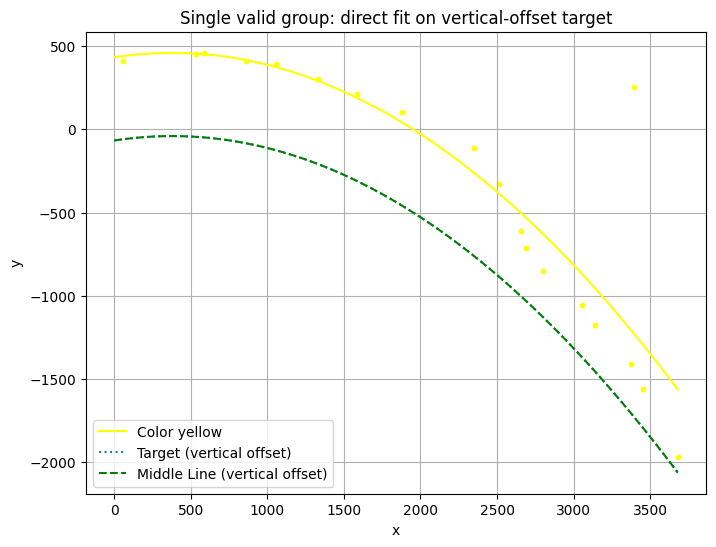

{'x_list': [-44.783447265625, 432.78973388671875, 488.2552490234375, 760.5990600585938, 959.2984619140625, 1779.04052734375, 2414.728759765625, 2247.902099609375, 1487.7098388671875, 1227.764892578125, 2558.1650390625, 3580.601318359375, 2589.456298828125, 3294.512939453125, 3276.639404296875, 2957.7802734375, 2699.9921875, 3350.40478515625, 3040.397705078125], 'y_list': [413.2161560058594, 450.3963928222656, 460.6102600097656, 411.69024658203125, 395.4014892578125, 105.01362609863281, -327.8241271972656, -110.06103515625, 213.35447692871094, 302.1927185058594, -612.2345581054688, -1966.8406982421875, -713.00048828125, 255.66844177246094, -1412.6746826171875, -1053.3734130859375, -851.8375244140625, -1558.120849609375, -1174.1890869140625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


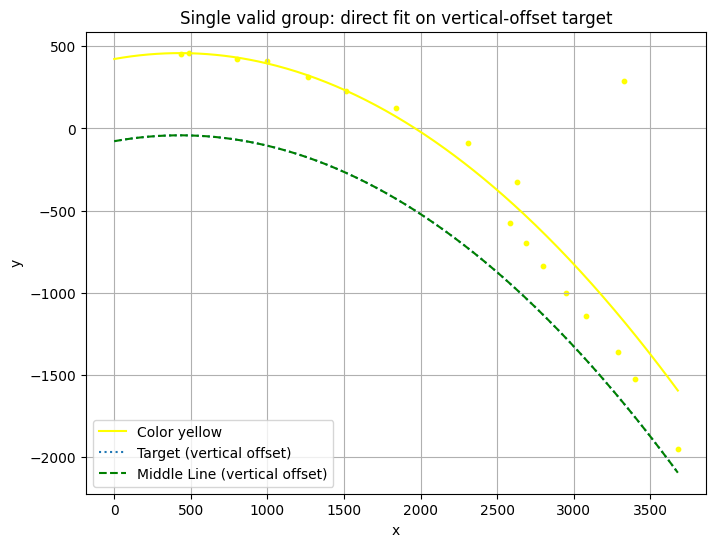

{'x_list': [332.78973388671875, 388.2552490234375, 702.9962768554688, 897.6533203125, 1163.8387451171875, 1739.9901123046875, 1414.801025390625, 2212.65185546875, 2586.5947265625, 2531.03076171875, 3579.308837890625, 3226.342529296875, 3186.6181640625, 3300.498779296875, 2485.9775390625, 2697.019287109375, 2979.6884765625, 2848.403564453125], 'y_list': [450.3963928222656, 460.6102600097656, 422.9962463378906, 407.7249450683594, 314.955322265625, 126.1528091430664, 230.6970672607422, -86.37728118896484, -697.7218627929688, -323.3028259277344, -1949.5875244140625, 288.2156982421875, -1357.42919921875, -1524.423095703125, -576.8189697265625, -835.9646606445312, -1138.1922607421875, -1002.4894409179688], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


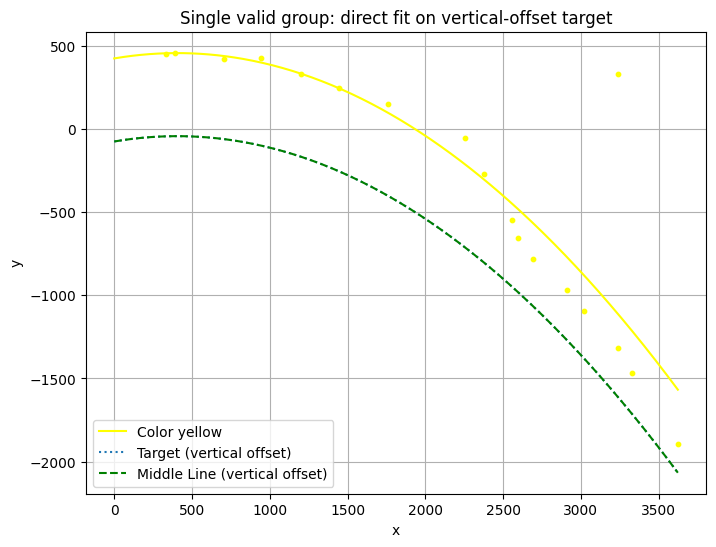

{'x_list': [232.78973388671875, 288.2552490234375, 602.9962768554688, 844.5580444335938, 1098.009033203125, 1662.330810546875, 2154.415771484375, 1342.61279296875, 2276.209228515625, 2455.949462890625, 3136.477783203125, 2920.092041015625, 2498.452392578125, 3522.9248046875, 2811.224609375, 3229.86328125, 3139.908203125, 2589.456298828125], 'y_list': [450.3963928222656, 460.6102600097656, 422.9962463378906, 427.2201843261719, 332.13726806640625, 150.19375610351562, -54.11164474487305, 250.10179138183594, -267.5691833496094, -549.0675659179688, 329.664794921875, -1092.0831298828125, -653.82568359375, -1894.5257568359375, -968.8798828125, -1469.2735595703125, -1315.606689453125, -781.7540893554688], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


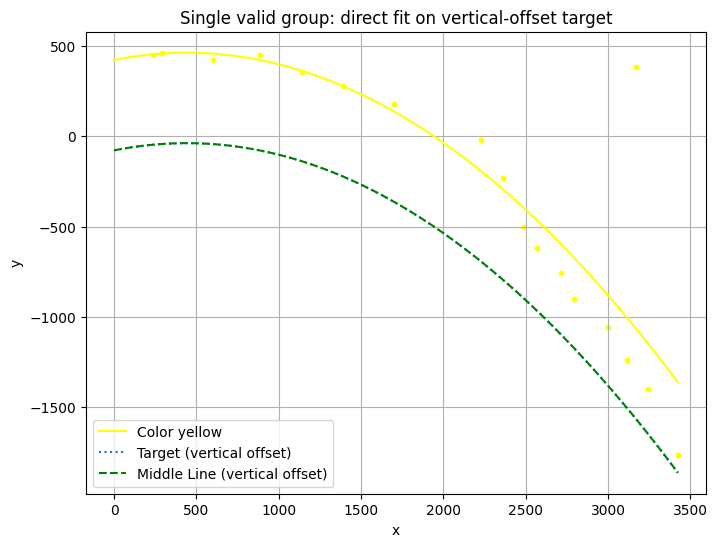

{'x_list': [132.78973388671875, 188.2552490234375, 502.99627685546875, 1291.8870849609375, 783.22509765625, 2129.28466796875, 1602.302978515625, 1040.4456787109375, 2260.720458984375, 2388.819091796875, 3141.0517578125, 3324.680419921875, 3016.608154296875, 2468.142333984375, 2899.991943359375, 3070.924560546875, 2614.674560546875, 2695.037109375], 'y_list': [450.3963928222656, 460.6102600097656, 422.9962463378906, 276.4047546386719, 446.307861328125, -19.3046932220459, 178.5684356689453, 354.2888488769531, -232.4492645263672, -504.6112365722656, -1398.0228271484375, -1763.1619873046875, -1237.486572265625, -617.816162109375, -1054.4041748046875, 380.3470153808594, -759.3179931640625, -902.1011962890625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


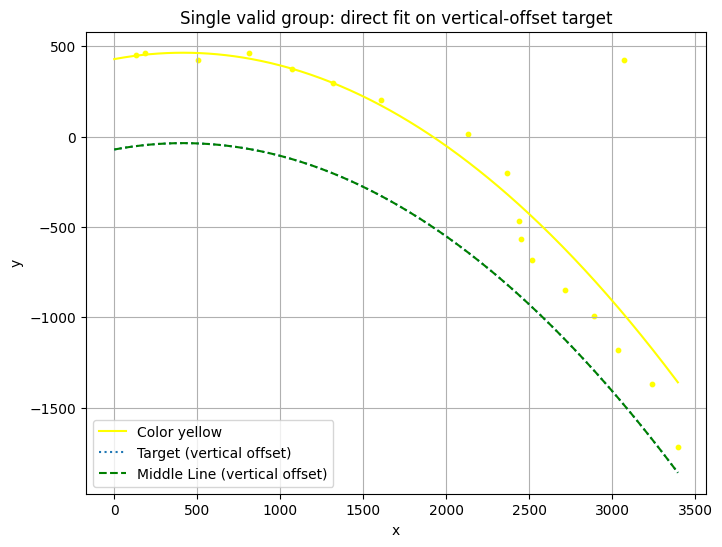

{'x_list': [32.78973388671875, 88.2552490234375, 402.99627685546875, 711.8082275390625, 1219.0472412109375, 1509.1875, 2029.350341796875, 2267.71484375, 973.2745361328125, 2973.162353515625, 2335.90576171875, 2614.674560546875, 2350.469970703125, 3294.512939453125, 2790.392578125, 2418.314208984375, 2935.061767578125, 3136.477783203125], 'y_list': [450.3963928222656, 460.6102600097656, 422.9962463378906, 460.2257385253906, 297.9393005371094, 202.06427001953125, 12.3150634765625, -201.81065368652344, 374.91290283203125, 423.91851806640625, -464.5682067871094, -849.4065551757812, -564.8831787109375, -1719.370361328125, -990.6784057617188, -681.9699096679688, -1178.9818115234375, -1370.55078125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


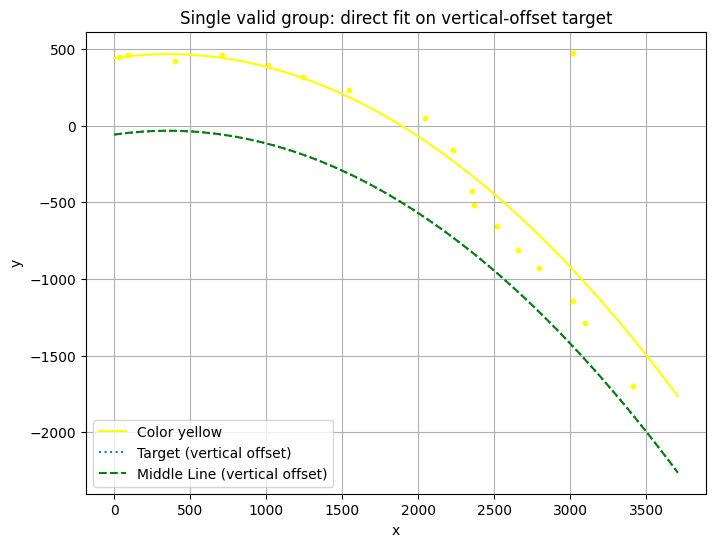

{'x_list': [-67.21026611328125, -11.7447509765625, 302.99627685546875, 611.8082275390625, 1445.8211669921875, 1144.244384765625, 1948.3505859375, 2128.886962890625, 909.0743408203125, 2254.633544921875, 2695.037109375, 3317.44873046875, 2919.02392578125, 2997.48779296875, 2557.22119140625, 2270.02001953125, 2917.955810546875, 2418.314208984375], 'y_list': [450.3963928222656, 460.6102600097656, 422.9962463378906, 460.2257385253906, 230.5566864013672, 317.4549865722656, 49.39651870727539, -160.1510467529297, 396.8186950683594, -426.7673034667969, -928.5557861328125, -1698.8131103515625, 476.1824645996094, -1285.4005126953125, -808.7543334960938, -519.0614624023438, -1140.5567626953125, -653.25537109375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


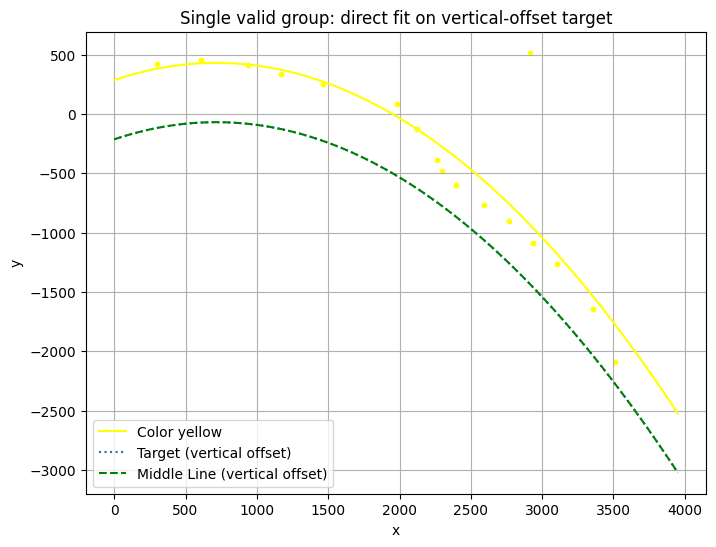

{'x_list': [202.99627685546875, 511.8082275390625, 1882.540283203125, 2024.872314453125, 1070.9647216796875, 1365.2982177734375, 839.1421508789062, 2160.35791015625, 2817.4111328125, 2666.282958984375, 3253.096435546875, 2833.335693359375, 2194.736572265625, 2491.49462890625, 2299.527587890625, 3413.61669921875, 3001.865234375], 'y_list': [422.9962463378906, 460.2257385253906, 82.2323226928711, -124.1330337524414, 336.8119812011719, 253.1060028076172, 415.2311096191406, -385.6862487792969, 517.4699096679688, -900.0372314453125, -1646.140869140625, -1085.2530517578125, -480.5511169433594, -765.8192138671875, -601.4935913085938, -2093.21875, -1262.0296630859375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


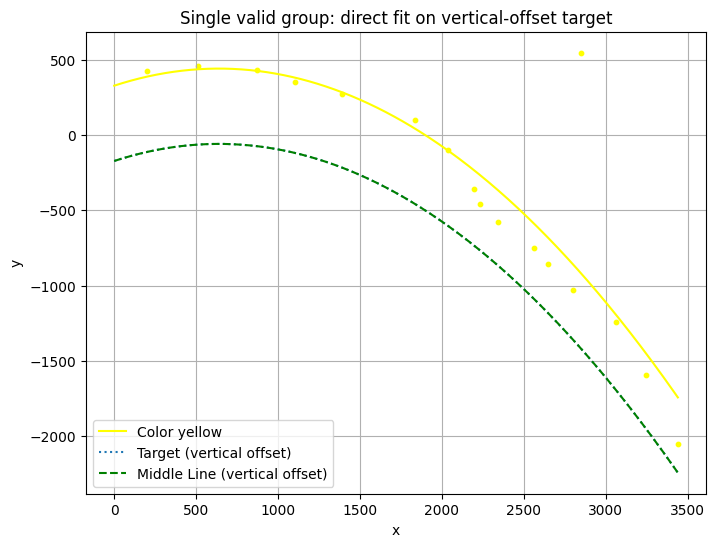

{'x_list': [102.99627685546875, 411.8082275390625, 770.0341796875, 1293.5211181640625, 1737.9932861328125, 1002.9981689453125, 1935.59423828125, 2548.868896484375, 2749.46533203125, 2099.041015625, 3146.76904296875, 2131.677734375, 2702.965087890625, 3340.69677734375, 2963.185791015625, 2242.63037109375, 2463.23046875], 'y_list': [422.9962463378906, 460.2257385253906, 430.78936767578125, 268.7906799316406, 97.72401428222656, 351.9131164550781, -101.48151397705078, -854.6221923828125, 546.1301879882812, -360.807861328125, -1596.432373046875, -457.05010986328125, -1031.7286376953125, -2053.739501953125, -1240.9603271484375, -580.7646484375, -753.1456909179688], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


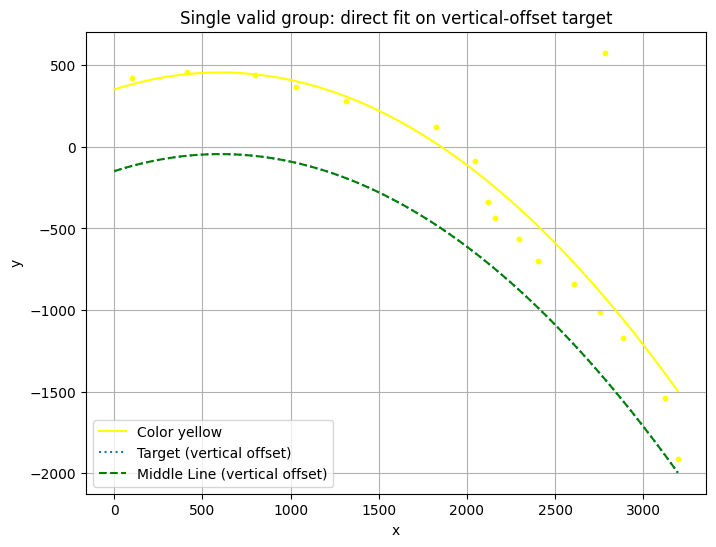

{'x_list': [2.99627685546875, 311.8082275390625, 1947.257568359375, 696.3585815429688, 1212.6739501953125, 931.27685546875, 1725.192626953125, 2019.625732421875, 2058.645751953125, 2683.537353515625, 3023.21484375, 2195.554931640625, 2504.922119140625, 2300.381103515625, 2654.0908203125, 2785.088623046875, 3095.509765625], 'y_list': [422.9962463378906, 460.2257385253906, -84.6109390258789, 439.10943603515625, 280.03143310546875, 363.3479309082031, 120.3732681274414, -340.4198303222656, -437.0159606933594, 576.1544799804688, -1540.2445068359375, -563.5553588867188, -838.8707275390625, -699.4641723632812, -1012.2130126953125, -1170.0482177734375, -1913.7713623046875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


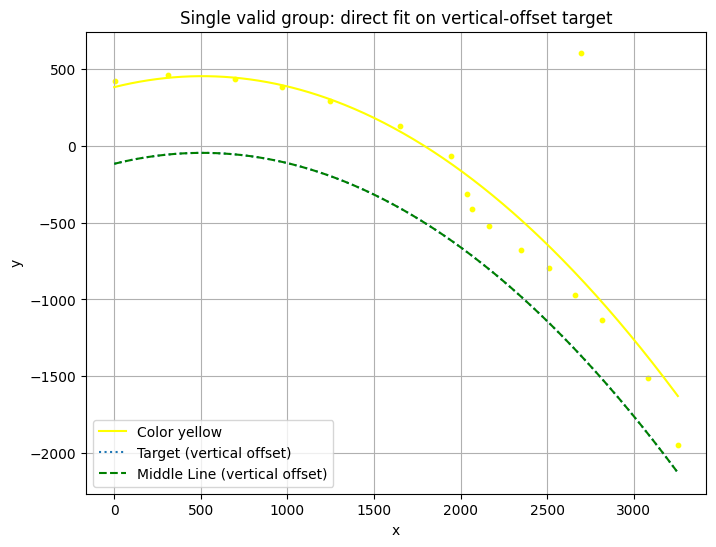

{'x_list': [-97.00372314453125, 211.8082275390625, 596.3585815429688, 867.87451171875, 1549.516845703125, 1143.796142578125, 1847.025146484375, 1937.7874755859375, 2980.776123046875, 2593.27197265625, 1967.594970703125, 2561.940185546875, 2716.63134765625, 2409.2900390625, 3155.056640625, 2063.279052734375, 2251.95361328125], 'y_list': [422.9962463378906, 460.2257385253906, 439.10943603515625, 382.3149108886719, 133.07456970214844, 297.00042724609375, -61.8662223815918, -312.25079345703125, -1512.7503662109375, 608.5968627929688, -407.02734375, -970.0014038085938, -1133.2611083984375, -797.6055908203125, -1947.7398681640625, -519.4718017578125, -675.1506958007812], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


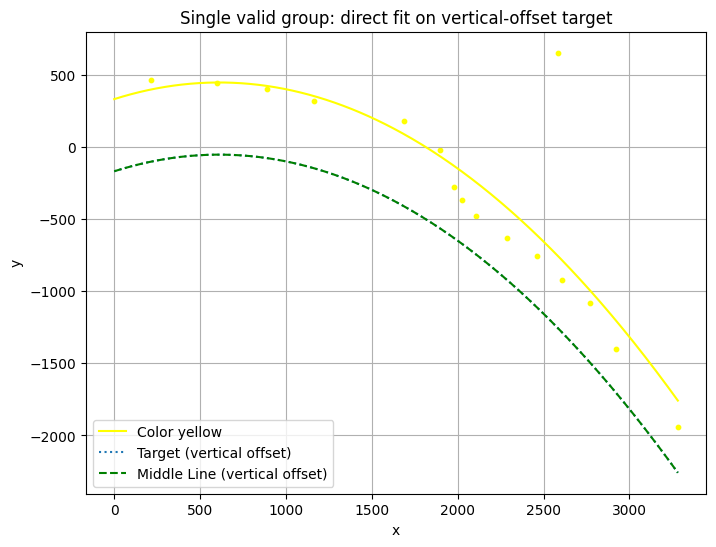

{'x_list': [111.8082275390625, 496.35858154296875, 1585.64208984375, 791.0233764648438, 1063.7547607421875, 1799.349609375, 1880.2459716796875, 2820.50439453125, 3181.98486328125, 2482.778564453125, 1923.3953857421875, 2007.759765625, 2360.088623046875, 2670.203369140625, 2506.7705078125, 2185.887451171875], 'y_list': [460.2257385253906, 439.10943603515625, 177.3369140625, 401.8072814941406, 320.52960205078125, -23.809123992919922, -275.0854797363281, -1403.7747802734375, -1944.9271240234375, 652.003662109375, -371.65460205078125, -480.2008361816406, -753.95556640625, -1085.8006591796875, -922.7577514648438, -630.5612182617188], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


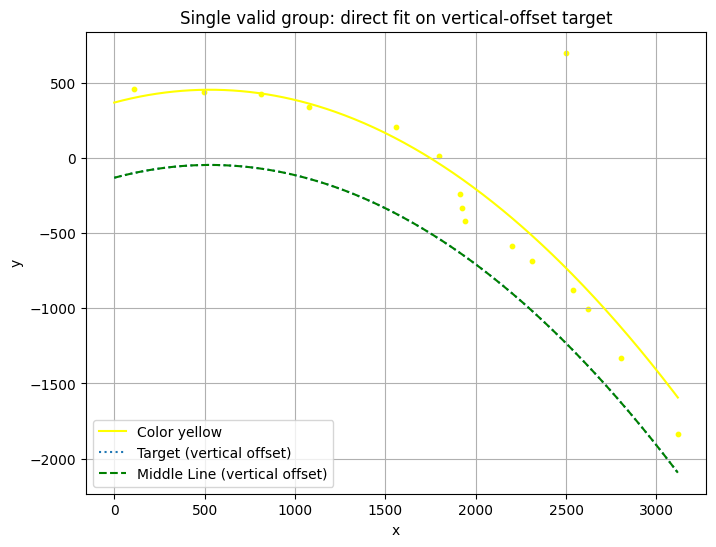

{'x_list': [11.8082275390625, 396.35858154296875, 711.2908935546875, 1461.0654296875, 978.50244140625, 1697.745361328125, 2704.947265625, 1814.259033203125, 2524.063720703125, 3018.810546875, 1825.8270263671875, 2439.14111328125, 2209.421875, 2402.130859375, 2102.184326171875, 1840.261474609375], 'y_list': [460.2257385253906, 439.10943603515625, 421.88092041015625, 202.988037109375, 338.5947265625, 10.427352905273438, -1328.0198974609375, -242.6875762939453, -1006.9274291992188, -1837.1239013671875, -330.3746643066406, -875.4061889648438, -684.6494140625, 698.874755859375, -585.263916015625, -420.59698486328125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


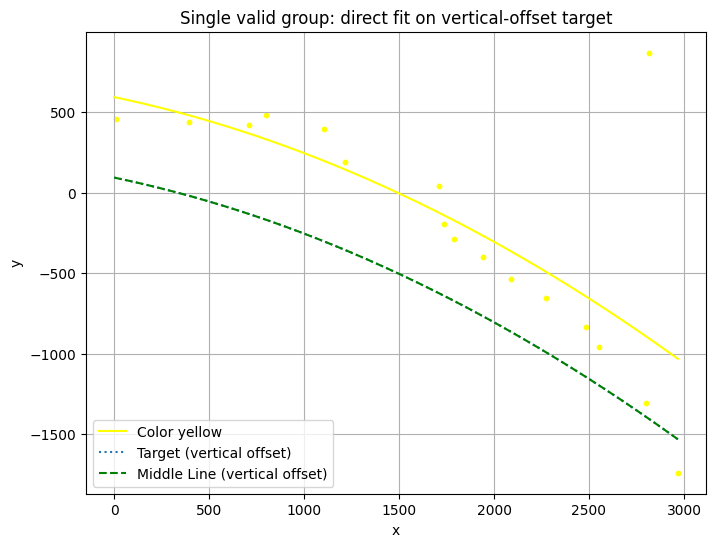

{'x_list': [-88.1917724609375, 296.35858154296875, 611.2908935546875, 700.490234375, 1004.1348876953125, 1117.0269775390625, 1609.4775390625, 1634.61767578125, 2867.845703125, 2700.983154296875, 1688.5787353515625, 2718.425048828125, 2383.562744140625, 2173.87548828125, 2452.935546875, 1842.9630126953125, 1987.13623046875], 'y_list': [460.2257385253906, 439.10943603515625, 421.88092041015625, 480.3668518066406, 398.48370361328125, 190.2336883544922, 39.82013702392578, -197.15625, -1739.4666748046875, -1306.856201171875, -287.0847473144531, 869.4342651367188, -836.8552856445312, -655.8331909179688, -957.19921875, -401.7789611816406, -535.954345703125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


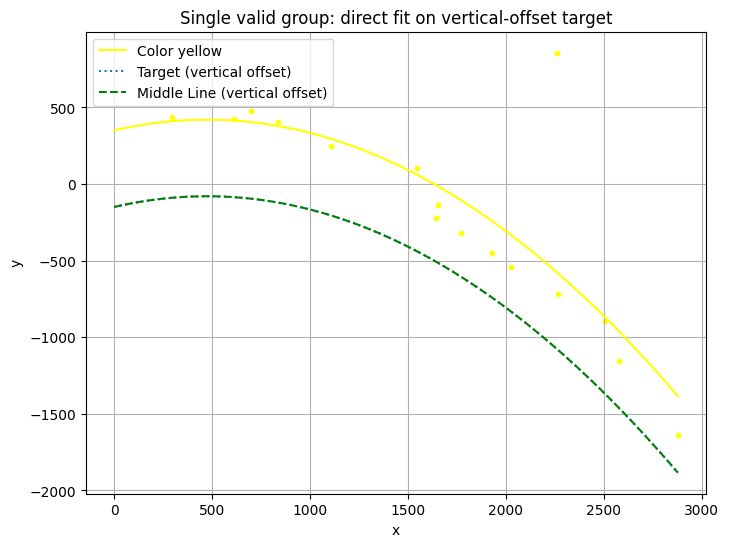

{'x_list': [196.35858154296875, 511.2908935546875, 600.490234375, 735.7889404296875, 1446.1981201171875, 1005.8819580078125, 2480.034423828125, 1555.52294921875, 2161.1650390625, 1668.7783203125, 2408.398193359375, 2777.953369140625, 2164.3935546875, 1927.02099609375, 1543.1298828125, 1826.5184326171875], 'y_list': [439.10943603515625, 421.88092041015625, 480.3668518066406, 407.5435485839844, 107.33001708984375, 249.6383514404297, -1157.4896240234375, -136.2811737060547, 857.5593872070312, -321.4231872558594, -892.8421020507812, -1640.7886962890625, -717.5057373046875, -538.1248779296875, -219.04393005371094, -448.4974060058594], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


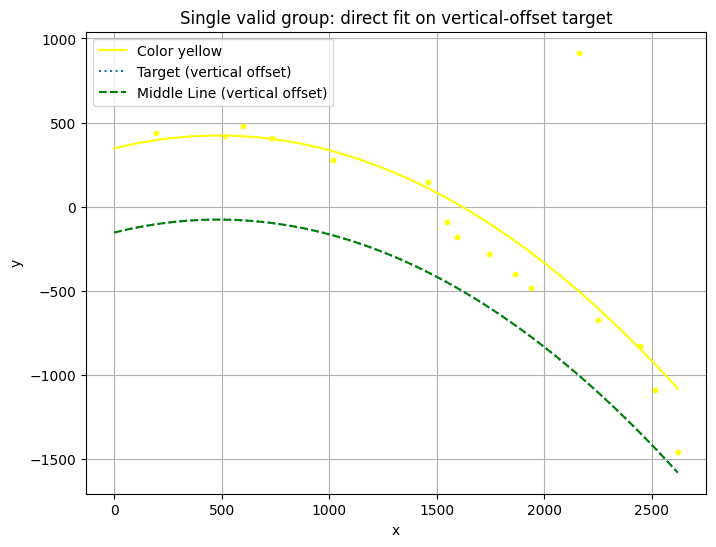

{'x_list': [96.35858154296875, 411.2908935546875, 500.490234375, 635.7889404296875, 1358.33447265625, 920.0203857421875, 2061.734619140625, 2414.6416015625, 1641.981689453125, 1448.2598876953125, 2522.20556640625, 2152.586669921875, 2346.34765625, 1492.9627685546875, 1838.873291015625, 1766.566162109375], 'y_list': [439.10943603515625, 421.88092041015625, 480.3668518066406, 407.5435485839844, 145.8577117919922, 276.3285827636719, 915.259765625, -1090.457763671875, -283.36212158203125, -93.13347625732422, -1458.3087158203125, -673.5193481445312, -826.9314575195312, -178.7610626220703, -483.5939025878906, -402.785888671875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


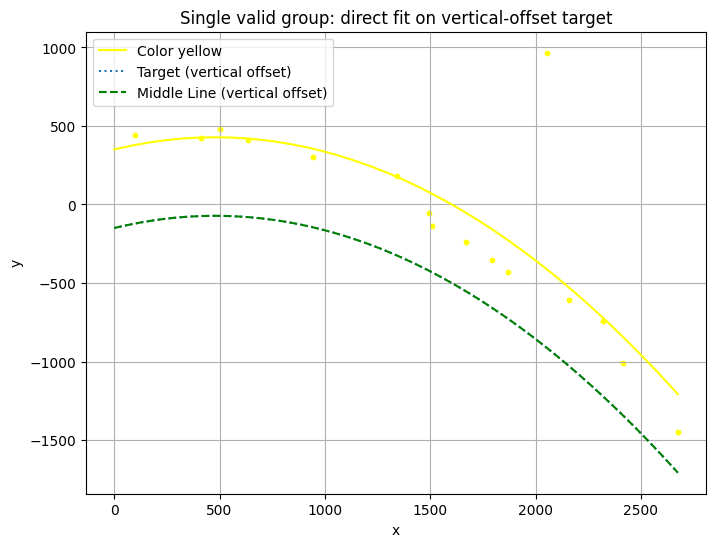

{'x_list': [-3.64141845703125, 311.2908935546875, 400.490234375, 535.7889404296875, 1241.5267333984375, 844.1367797851562, 2575.150634765625, 1956.10302734375, 2314.494140625, 1394.9119873046875, 2217.635986328125, 1571.584228515625, 2060.190185546875, 1768.5780029296875, 1409.60009765625, 1693.1202392578125], 'y_list': [439.10943603515625, 421.88092041015625, 480.3668518066406, 407.5435485839844, 178.5684051513672, 303.8044128417969, -1446.277587890625, 966.1388549804688, -1009.5983276367188, -53.87997055053711, -745.1373901367188, -237.2841339111328, -610.1731567382812, -431.4284362792969, -137.72662353515625, -355.4115905761719], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


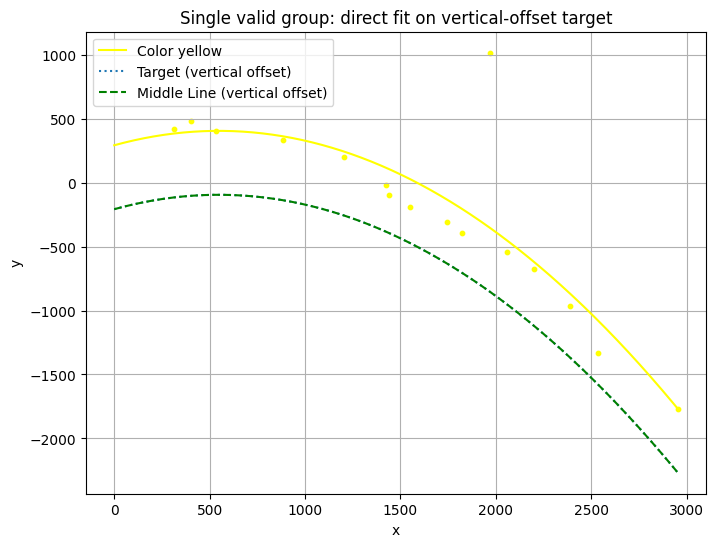

{'x_list': [211.2908935546875, 300.490234375, 435.7889404296875, 782.9540405273438, 1106.718505859375, 1867.432861328125, 2288.101318359375, 2437.33935546875, 1323.6082763671875, 1337.753662109375, 1957.5771484375, 2100.61279296875, 1723.4244384765625, 1451.63623046875, 1645.6158447265625, 2854.204833984375], 'y_list': [421.88092041015625, 480.3668518066406, 407.5435485839844, 333.3277282714844, 202.19810485839844, 1016.6117553710938, -961.43505859375, -1334.75390625, -18.10050392150879, -98.03756713867188, -545.0518798828125, -671.2704467773438, -390.3995666503906, -190.77342224121094, -311.2853698730469, -1770.2783203125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


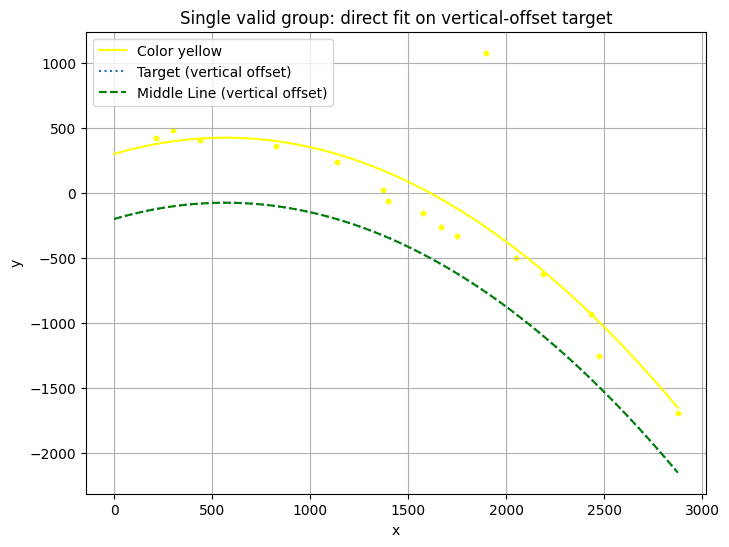

{'x_list': [111.2908935546875, 200.490234375, 335.7889404296875, 723.9127197265625, 1035.708740234375, 1476.98291015625, 1271.3192138671875, 1795.4896240234375, 2331.874267578125, 2774.8955078125, 2088.61376953125, 2371.328369140625, 1296.587890625, 1946.907470703125, 1649.397705078125, 1565.3343505859375], 'y_list': [421.88092041015625, 480.3668518066406, 407.5435485839844, 362.845947265625, 234.13247680664062, -156.1756134033203, 22.86751937866211, 1076.427734375, -931.5608520507812, -1692.488525390625, -624.4674072265625, -1252.617919921875, -61.39888381958008, -499.6976013183594, -334.84210205078125, -263.830810546875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


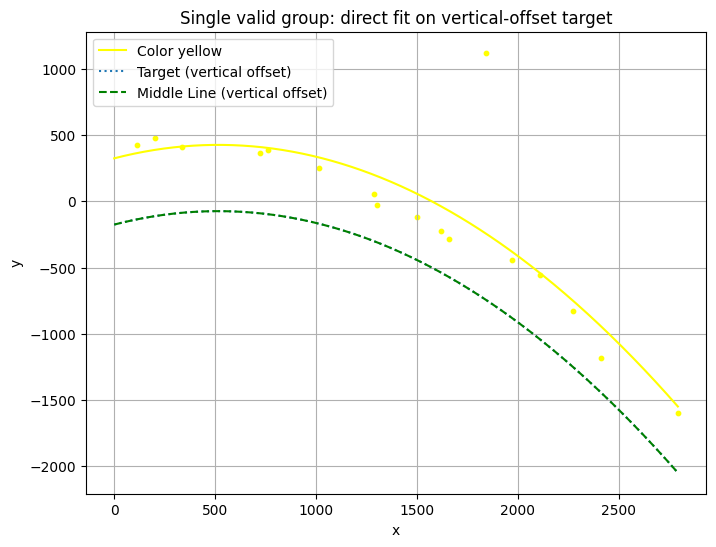

{'x_list': [11.2908935546875, 100.490234375, 235.7889404296875, 623.9127197265625, 660.9754638671875, 913.3886108398438, 2692.064208984375, 2174.6865234375, 1201.9447021484375, 2310.2060546875, 1189.2928466796875, 2010.644287109375, 1401.13916015625, 1870.2642822265625, 1558.3477783203125, 1742.204833984375, 1517.4024658203125], 'y_list': [421.88092041015625, 480.3668518066406, 407.5435485839844, 362.845947265625, 390.1063537597656, 251.7979736328125, -1595.211181640625, -828.9903564453125, -24.25594139099121, -1179.0093994140625, 57.14189529418945, -558.9091186523438, -115.3938980102539, -442.16943359375, -286.029052734375, 1121.793212890625, -222.42735290527344], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


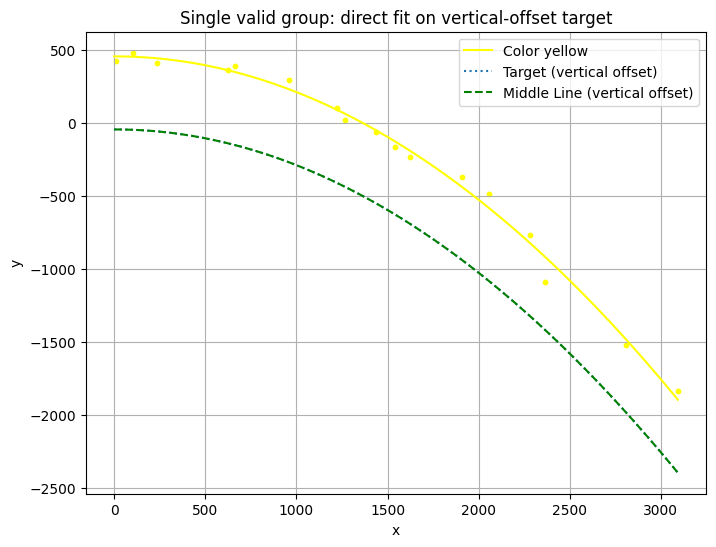

{'x_list': [-88.7091064453125, 0.490234375, 135.7889404296875, 523.9127197265625, 560.9754638671875, 860.9388427734375, 2263.88916015625, 2183.44384765625, 2706.665771484375, 1956.840087890625, 1120.850830078125, 1168.4688720703125, 1336.1796875, 1807.58251953125, 1523.270263671875, 2993.1103515625, 1440.2305908203125], 'y_list': [421.88092041015625, 480.3668518066406, 407.5435485839844, 362.845947265625, 390.1063537597656, 293.25872802734375, -1091.625732421875, -767.5452270507812, -1521.6556396484375, -487.9886779785156, 100.05858612060547, 21.19136619567871, -64.42469024658203, -373.6200866699219, -231.82568359375, -1831.6956787109375, -164.2008514404297], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


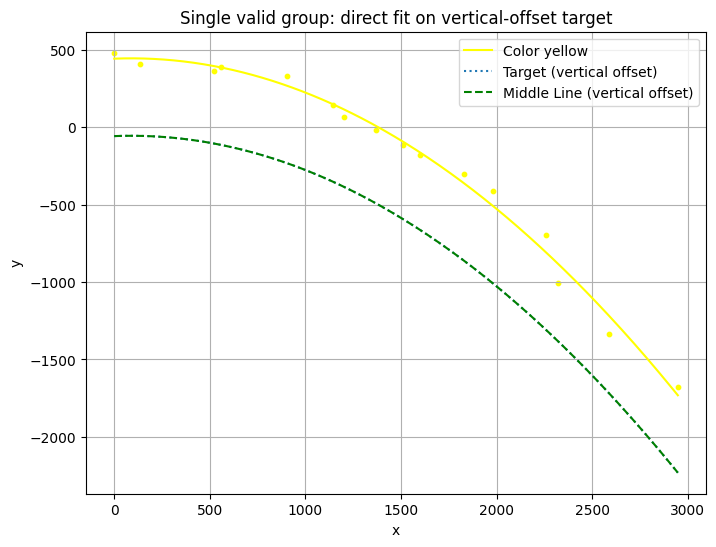

{'x_list': [-99.509765625, 35.7889404296875, 423.9127197265625, 460.9754638671875, 802.67822265625, 2219.28759765625, 1043.0845947265625, 1100.923583984375, 1271.4761962890625, 2160.35791015625, 1880.9566650390625, 2488.736083984375, 1728.1783447265625, 2847.3603515625, 1499.8721923828125, 1412.05712890625], 'y_list': [480.3668518066406, 407.5435485839844, 362.845947265625, 390.1063537597656, 330.5805358886719, -1007.4786376953125, 140.5872039794922, 62.78028106689453, -16.096309661865234, -698.1137084960938, -415.47393798828125, -1332.820068359375, -305.74078369140625, -1676.3851318359375, -180.8874969482422, -114.63651275634766], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


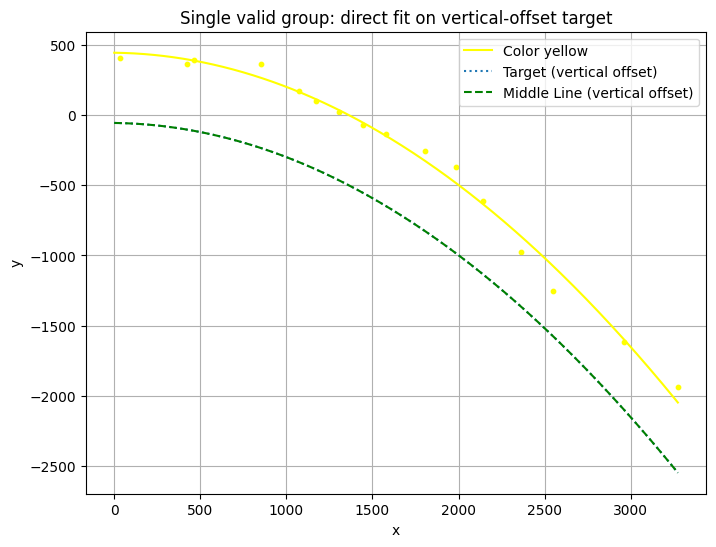

{'x_list': [-64.2110595703125, 323.9127197265625, 360.9754638671875, 750.6214599609375, 2040.882080078125, 976.073486328125, 1204.4854736328125, 2446.59716796875, 2260.5234375, 1069.8516845703125, 1886.0263671875, 1475.9305419921875, 1704.9066162109375, 2862.59912109375, 1345.20556640625, 3173.469970703125], 'y_list': [407.5435485839844, 362.845947265625, 390.1063537597656, 361.2718811035156, -615.1541748046875, 169.4523162841797, 21.76102638244629, -1254.5111083984375, -974.8262939453125, 97.32196044921875, -371.4223327636719, -138.88656616210938, -258.9459228515625, -1616.2193603515625, -73.25884246826172, -1938.5234375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


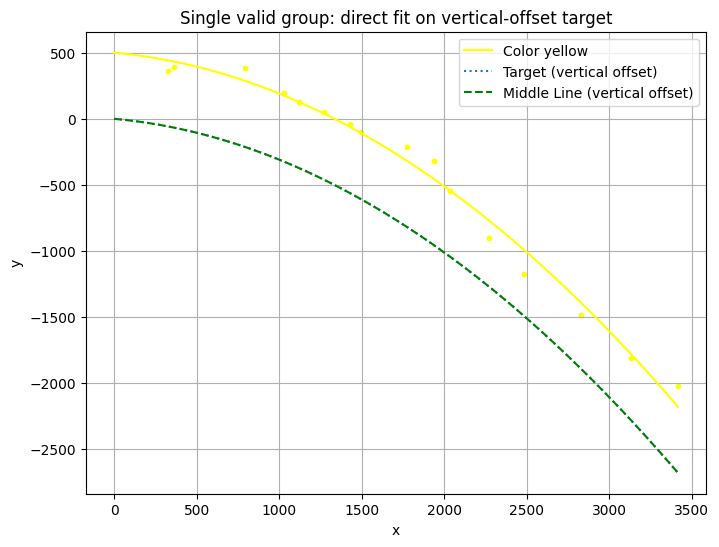

{'x_list': [223.9127197265625, 260.9754638671875, 695.0098266601562, 1174.2060546875, 1935.2945556640625, 926.23095703125, 2173.87548828125, 1020.46826171875, 2384.44580078125, 1837.3885498046875, 1676.3701171875, 2730.45068359375, 1396.8804931640625, 1326.2161865234375, 3034.22607421875, 3316.243408203125], 'y_list': [362.845947265625, 390.1063537597656, 382.7491149902344, 53.8838005065918, -544.20849609375, 198.06727600097656, -898.2532348632812, 126.83365631103516, -1176.3121337890625, -318.07501220703125, -215.82371520996094, -1487.4012451171875, -100.17253112792969, -37.593353271484375, -1807.729736328125, -2020.557861328125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


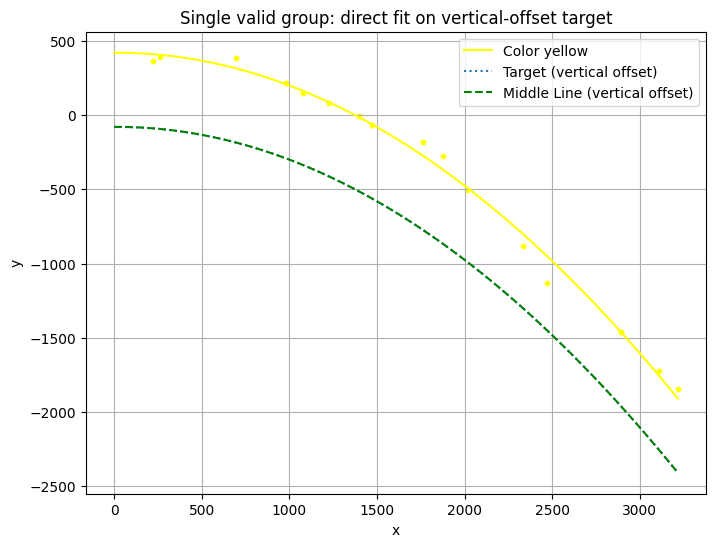

{'x_list': [123.9127197265625, 160.9754638671875, 595.0098266601562, 1128.4256591796875, 881.4298095703125, 975.671630859375, 1775.3013916015625, 1915.20361328125, 2234.294921875, 2368.692138671875, 1297.012939453125, 1659.8592529296875, 2791.417724609375, 1370.655029296875, 3116.999267578125, 3010.6201171875], 'y_list': [362.845947265625, 390.1063537597656, 382.7491149902344, 82.39289855957031, 219.8523406982422, 151.22010803222656, -274.1656494140625, -501.24468994140625, -881.1600952148438, -1128.2943115234375, -8.210042953491211, -181.9697265625, -1464.124267578125, -67.20893859863281, -1847.102783203125, -1723.6053466796875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


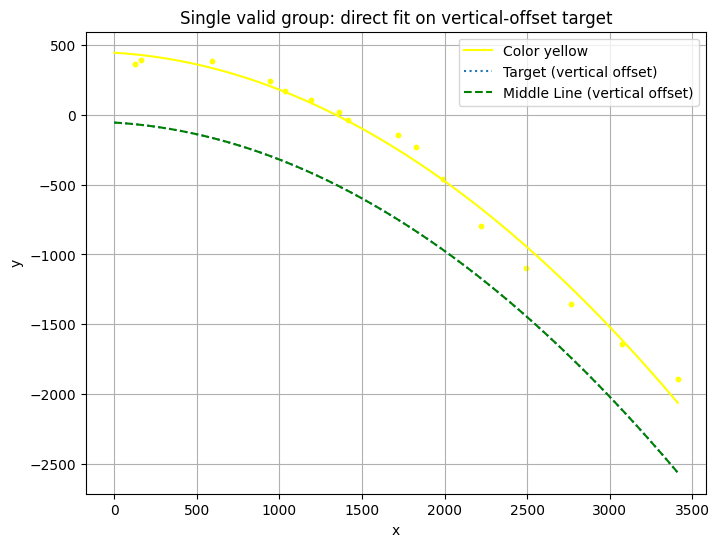

{'x_list': [23.9127197265625, 60.9754638671875, 495.00982666015625, 935.9302978515625, 845.2070922851562, 2119.380859375, 1890.3074951171875, 1092.770751953125, 1725.54541015625, 2393.25634765625, 2664.32275390625, 1317.95068359375, 1616.314453125, 1260.295166015625, 3312.627685546875, 2972.915771484375], 'y_list': [362.845947265625, 390.1063537597656, 382.7491149902344, 171.8397674560547, 239.99595642089844, -799.9865112304688, -460.94464111328125, 107.25892639160156, -233.6984100341797, -1094.5089111328125, -1352.6722412109375, -35.88621520996094, -142.68882751464844, 21.34151268005371, -1895.0775146484375, -1644.9940185546875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


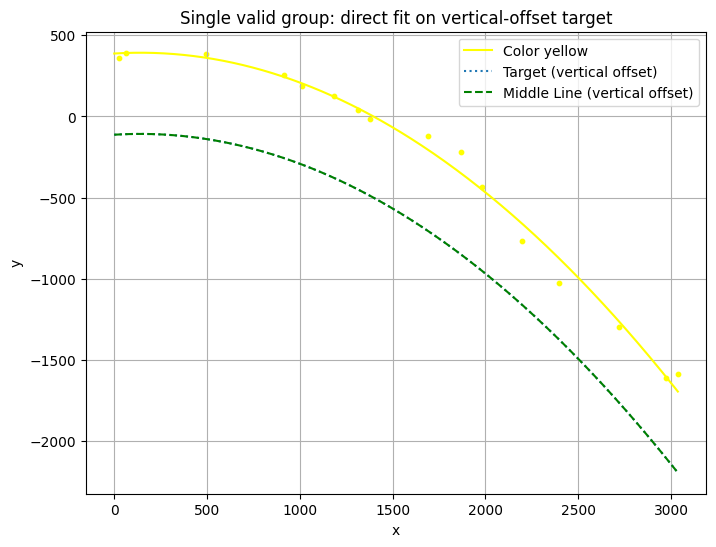

{'x_list': [-76.0872802734375, -39.0245361328125, 395.00982666015625, 814.5594482421875, 1766.205322265625, 1881.6673583984375, 913.00830078125, 2099.041015625, 1081.787353515625, 2619.495849609375, 2296.967041015625, 1590.883544921875, 1280.389404296875, 1214.124267578125, 2870.99365234375, 2936.1142578125], 'y_list': [362.845947265625, 390.1063537597656, 382.7491149902344, 253.34756469726562, -217.4267120361328, -434.4453125, 187.8331756591797, -765.6678466796875, 126.3580093383789, -1297.2755126953125, -1025.273193359375, -119.4547119140625, -16.14177894592285, 38.71402359008789, -1610.6171875, -1585.3739013671875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


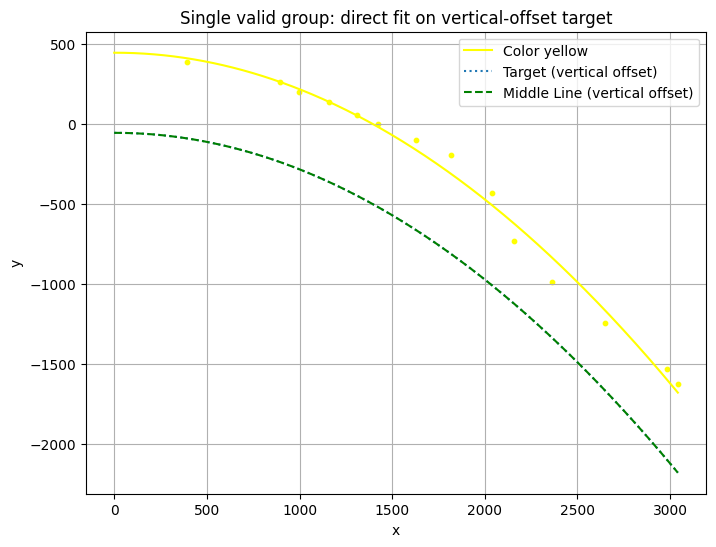

{'x_list': [295.00982666015625, 797.1492919921875, 1060.0819091796875, 1937.056396484375, 896.2373046875, 2261.36474609375, 1716.21044921875, 1527.5230712890625, 2059.41796875, 1209.126220703125, 2546.9912109375, 2941.50927734375, 1323.0982666015625, 2880.437255859375], 'y_list': [382.7491149902344, 261.7185974121094, 136.8737030029297, -431.29638671875, 198.07589721679688, -990.54931640625, -196.0751190185547, -100.912841796875, -733.85693359375, 51.479183197021484, -1243.0867919921875, -1623.6102294921875, -2.77657413482666, -1529.3861083984375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


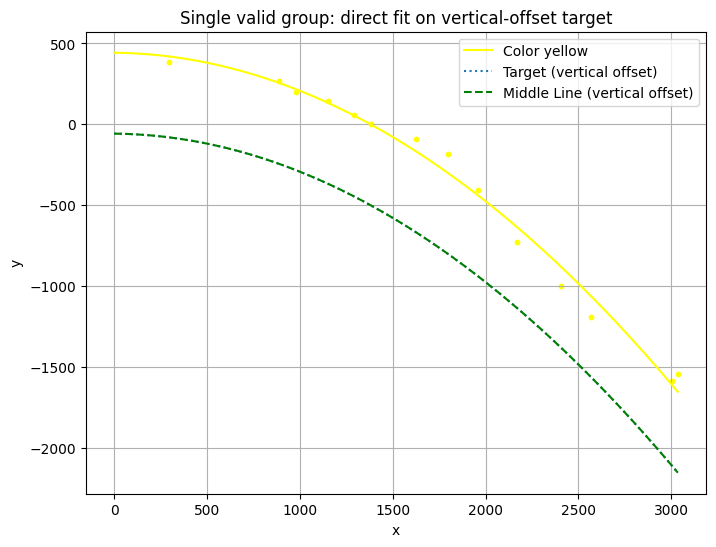

{'x_list': [195.00982666015625, 1048.5538330078125, 787.9951782226562, 1856.8572998046875, 1696.3973388671875, 879.402099609375, 2068.806884765625, 2465.050537109375, 1526.932373046875, 2306.775634765625, 1191.195556640625, 1282.2784423828125, 2905.30078125, 2935.046142578125], 'y_list': [382.7491149902344, 143.5382537841797, 267.3462829589844, -404.94256591796875, -181.81512451171875, 202.67271423339844, -728.7662963867188, -1190.4560546875, -91.45226287841797, -998.1516723632812, 60.95135498046875, 4.046876430511475, -1587.27490234375, -1539.7515869140625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


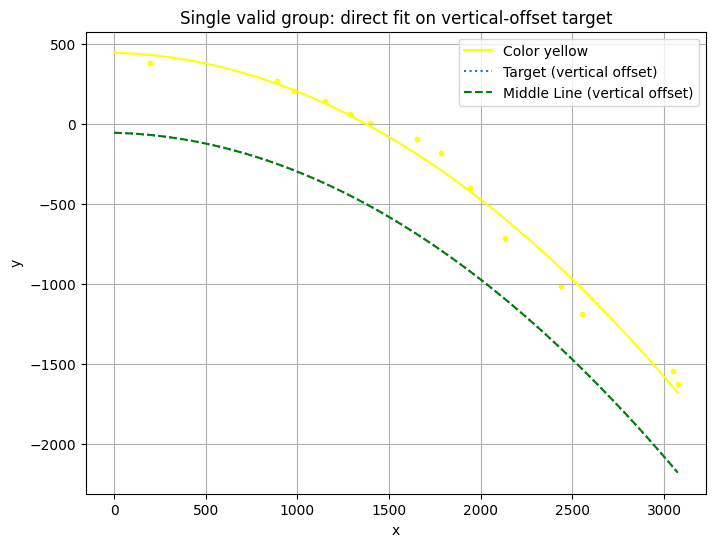

{'x_list': [95.00982666015625, 1047.700439453125, 787.3207397460938, 1840.17578125, 1682.1390380859375, 2030.20849609375, 883.0958862304688, 2340.256591796875, 1293.1072998046875, 1553.72119140625, 2450.218994140625, 1187.287109375, 2975.337646484375, 2950.10595703125], 'y_list': [382.7491149902344, 144.6774444580078, 267.3462829589844, -399.9188537597656, -180.50238037109375, -714.273681640625, 203.513671875, -1012.7587890625, 5.442085266113281, -92.99186706542969, -1184.4130859375, 60.78925323486328, -1623.0853271484375, -1546.15869140625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


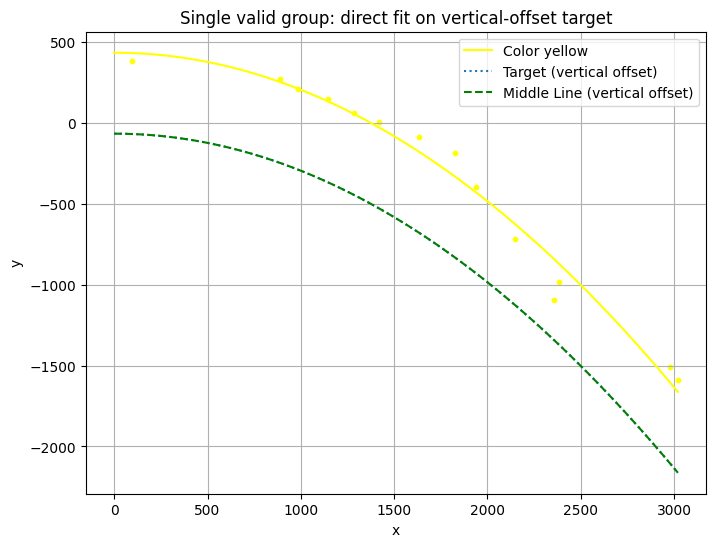

{'x_list': [-4.99017333984375, 1047.700439453125, 1840.17578125, 786.9835815429688, 2048.572509765625, 1728.3426513671875, 886.8204956054688, 2282.1552734375, 1317.4056396484375, 1531.7447509765625, 2258.6533203125, 1186.8126220703125, 2920.092041015625, 2879.387939453125], 'y_list': [382.7491149902344, 144.6774444580078, -399.9188537597656, 268.2464294433594, -718.3787231445312, -185.1820831298828, 205.3536834716797, -986.3779296875, 5.537005424499512, -90.17408752441406, -1093.2076416015625, 60.78925323486328, -1591.0767822265625, -1509.778564453125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


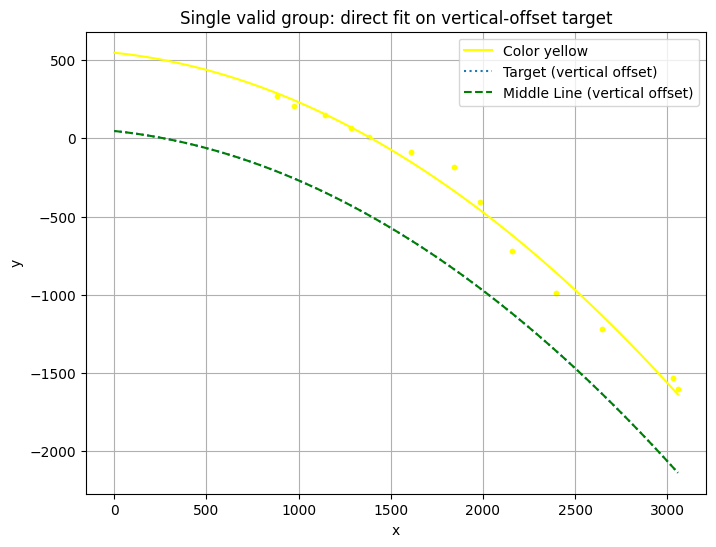

{'x_list': [783.3068237304688, 1741.9869384765625, 1886.0263671875, 1041.8104248046875, 2057.87353515625, 876.279296875, 1509.760009765625, 1281.267822265625, 2294.406494140625, 2545.113525390625, 1186.3382568359375, 2956.69921875, 2932.90966796875], 'y_list': [270.8231506347656, -181.23362731933594, -403.802734375, 146.25604248046875, -717.3657836914062, 206.18211364746094, -85.86898040771484, 9.44271183013916, -986.5406494140625, -1218.0245361328125, 65.85502624511719, -1604.5906982421875, -1534.0489501953125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


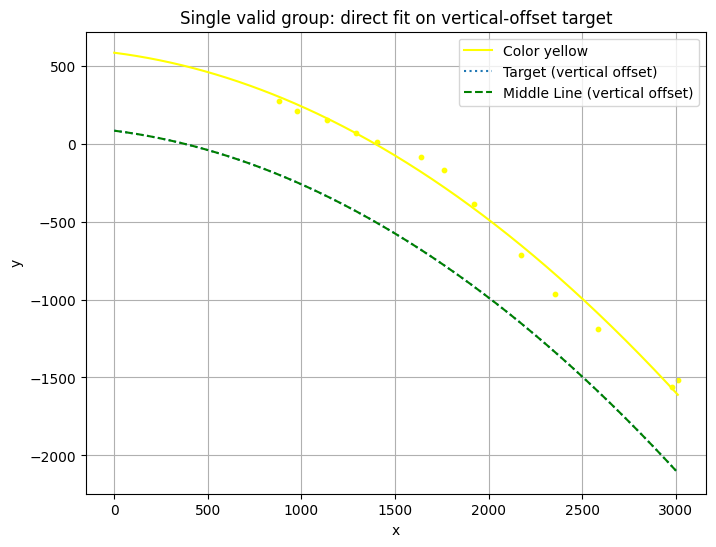

{'x_list': [780.3052368164062, 876.8222045898438, 2074.3828125, 1034.708251953125, 1303.09521484375, 1822.3699951171875, 2257.15771484375, 1540.2730712890625, 1660.496337890625, 2486.897216796875, 1189.2928466796875, 2881.184814453125, 2911.671630859375], 'y_list': [274.7895202636719, 210.5435028076172, -717.3927612304688, 150.0764617919922, 12.350553512573242, -385.7447204589844, -965.8417358398438, -82.81434631347656, -170.06517028808594, -1188.001708984375, 69.84010314941406, -1558.1591796875, -1516.4144287109375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


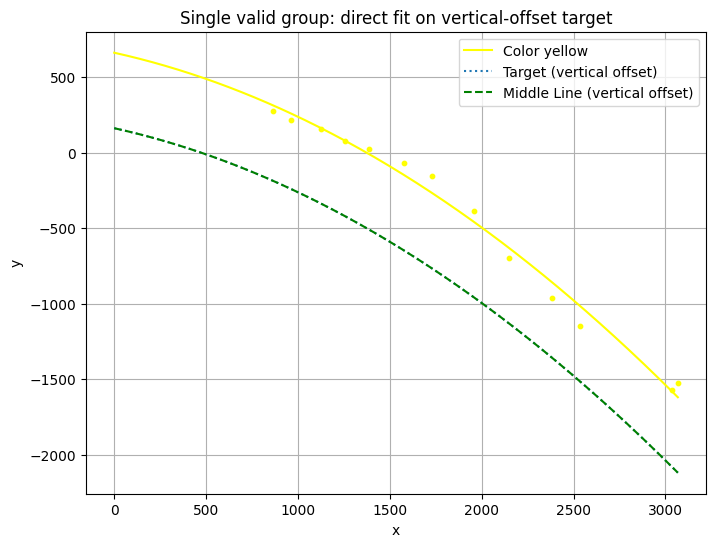

{'x_list': [766.6030883789062, 1860.3614501953125, 1023.635009765625, 2280.456298828125, 1157.681396484375, 2046.265869140625, 1629.6104736328125, 1476.98291015625, 860.2137451171875, 2435.537353515625, 1287.10546875, 2937.2109375, 2967.51025390625], 'y_list': [278.6549072265625, -383.9574279785156, 157.60968017578125, -963.70263671875, 75.64356994628906, -697.8536376953125, -157.05667114257812, -70.43213653564453, 216.7985076904297, -1149.57177734375, 21.706323623657227, -1569.1072998046875, -1526.6697998046875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


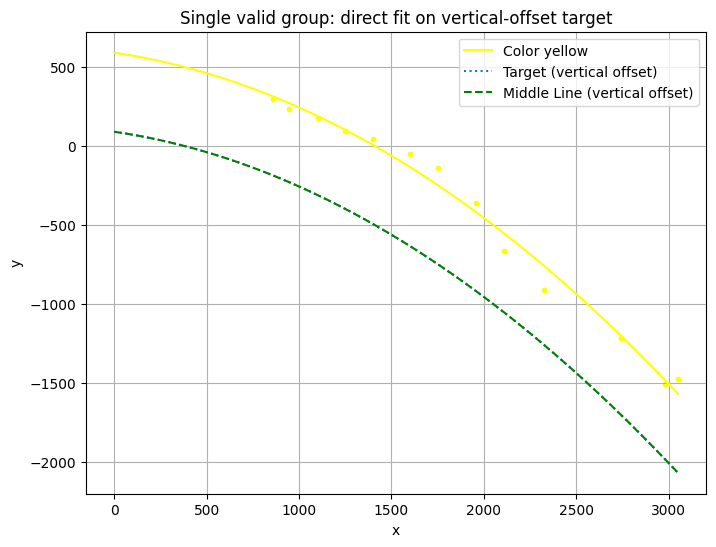

{'x_list': [757.3433227539062, 1002.5118408203125, 1860.3614501953125, 846.0288696289062, 2010.644287109375, 1150.7027587890625, 2225.9267578125, 2644.34326171875, 1654.231201171875, 1502.1676025390625, 1298.5506591796875, 2883.2958984375, 2950.10595703125], 'y_list': [293.57305908203125, 171.162353515625, -363.2538146972656, 228.0713653564453, -665.8483276367188, 90.05522918701172, -916.9281616210938, -1217.7781982421875, -138.9571533203125, -54.46531295776367, 39.6818733215332, -1510.2591552734375, -1480.181640625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


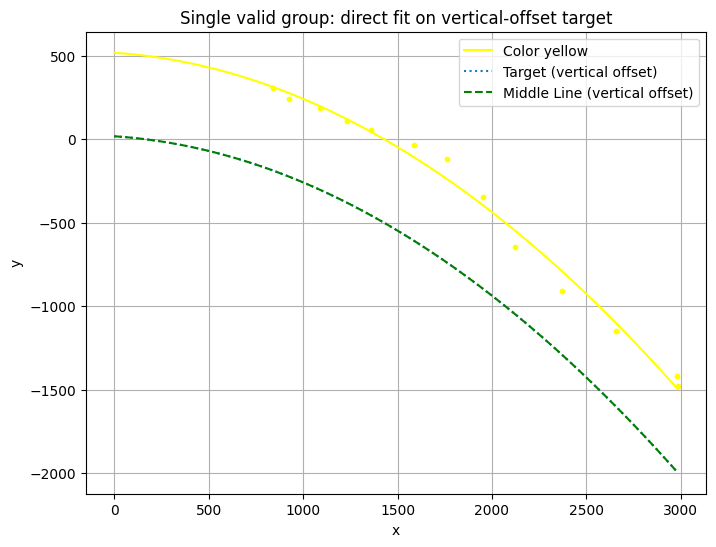

{'x_list': [740.2886962890625, 1852.6434326171875, 1660.496337890625, 2019.625732421875, 827.8638916015625, 991.221435546875, 1486.612548828125, 1259.485107421875, 2270.02001953125, 1131.104248046875, 2558.1650390625, 2884.351318359375, 2878.338623046875], 'y_list': [304.5851745605469, -343.0763244628906, -120.74626922607422, -646.3923950195312, 239.9659423828125, 184.81968688964844, -35.44400405883789, 55.864986419677734, -909.4859619140625, 106.8980941772461, -1148.8846435546875, -1479.2650146484375, -1417.3431396484375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


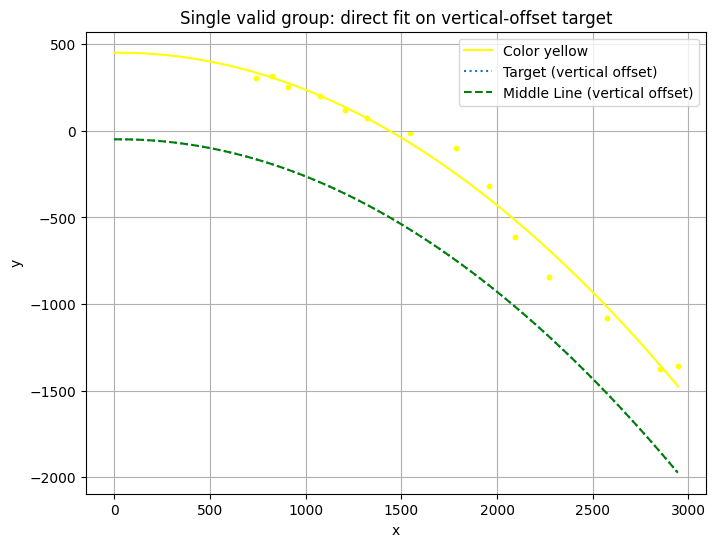

{'x_list': [640.2886962890625, 722.8905029296875, 974.8681640625, 806.135986328125, 1445.4464111328125, 1684.71826171875, 1859.656494140625, 2172.25390625, 1992.158203125, 1220.603515625, 2475.46044921875, 1107.7177734375, 2749.46533203125, 2844.743896484375], 'y_list': [304.5851745605469, 319.4214782714844, 202.6992950439453, 255.06497192382812, -10.515070915222168, -98.34203338623047, -318.0823669433594, -841.9772338867188, -612.2345581054688, 73.75652313232422, -1081.788818359375, 122.92430877685547, -1374.7415771484375, -1359.3348388671875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


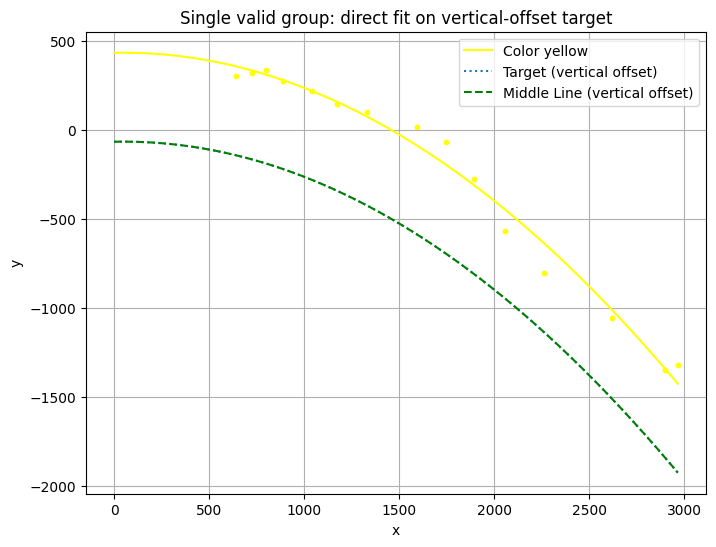

{'x_list': [540.2886962890625, 622.8905029296875, 700.5286865234375, 785.6466064453125, 1793.0208740234375, 1490.6055908203125, 938.5758056640625, 1646.7454833984375, 1958.314208984375, 1074.4453125, 1230.9691162109375, 2163.58642578125, 2517.560302734375, 2799.619140625, 2865.09423828125], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 272.2326354980469, -278.0760192871094, 17.00651741027832, 219.93614196777344, -67.54360961914062, -568.6642456054688, 145.17758178710938, 100.45492553710938, -803.6925659179688, -1059.0098876953125, -1351.9202880859375, -1319.9443359375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


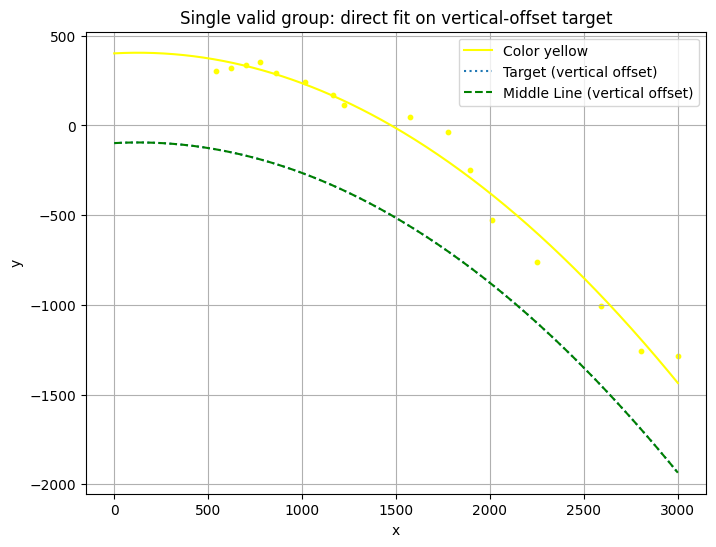

{'x_list': [440.2886962890625, 522.8905029296875, 600.5286865234375, 678.62109375, 918.1105346679688, 1792.340087890625, 1677.631103515625, 759.9030151367188, 1473.5413818359375, 1908.516357421875, 2152.586669921875, 2490.5751953125, 1067.0123291015625, 1125.42578125, 2703.956298828125, 2900.18408203125], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 355.7315673828125, 240.640380859375, -247.17869567871094, -36.1004753112793, 290.6113586425781, 44.402870178222656, -524.1847534179688, -763.60791015625, -1003.9104614257812, 167.58848571777344, 116.6406478881836, -1259.238037109375, -1284.847412109375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


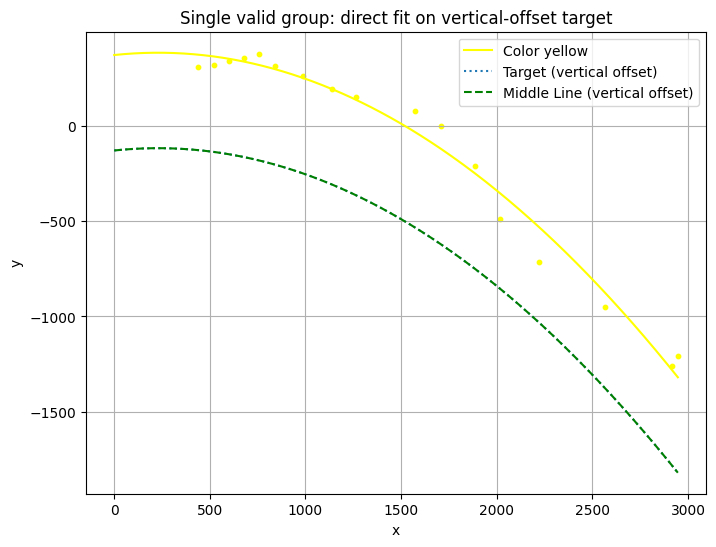

{'x_list': [340.2886962890625, 422.8905029296875, 500.5286865234375, 578.62109375, 656.1843872070312, 738.77734375, 884.5762329101562, 1784.466552734375, 1915.92578125, 1040.3695068359375, 1472.394287109375, 2122.552001953125, 1165.6226806640625, 1608.496826171875, 2464.140625, 2817.4111328125, 2846.818115234375], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 258.8377685546875, -211.8378143310547, -491.6053771972656, 191.15164184570312, 75.0255355834961, -713.2155151367188, 147.95225524902344, -1.6534112691879272, -949.9353637695312, -1260.6448974609375, -1207.0672607421875], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


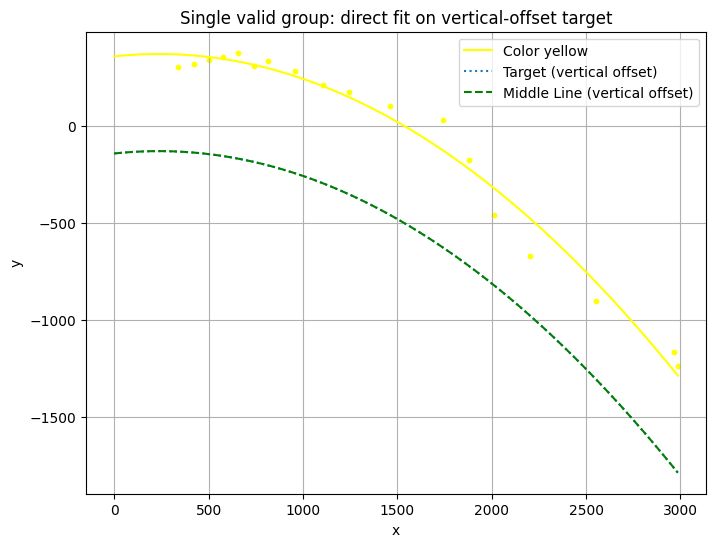

{'x_list': [240.2886962890625, 322.8905029296875, 400.5286865234375, 478.62109375, 556.1843872070312, 638.77734375, 859.3515014648438, 1782.4317626953125, 714.42041015625, 1914.4814453125, 1361.4451904296875, 2102.184326171875, 1642.317626953125, 1146.5545654296875, 2450.218994140625, 1005.8819580078125, 2886.46240234375, 2864.051025390625], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 281.0732116699219, -177.4368133544922, 331.65692138671875, -456.90380859375, 101.22441101074219, -671.2704467773438, 30.39462661743164, 173.0457000732422, -899.1871337890625, 212.2476043701172, -1236.947265625, -1164.0015869140625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


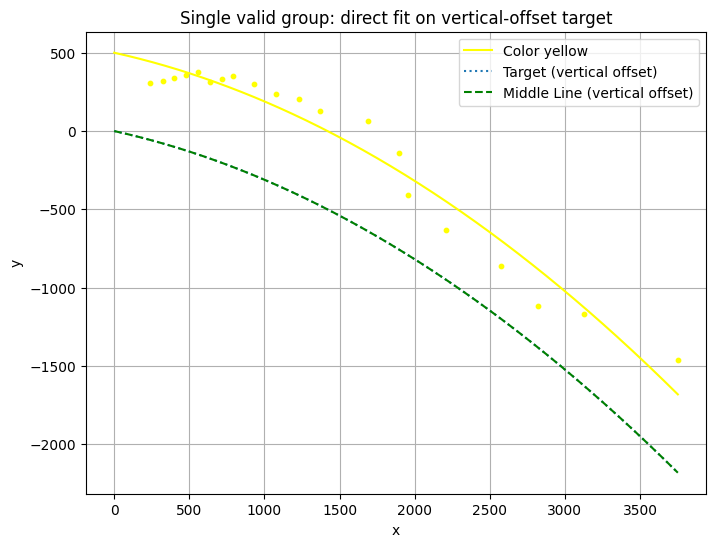

{'x_list': [140.2886962890625, 222.8905029296875, 300.5286865234375, 378.62109375, 456.18438720703125, 538.77734375, 614.42041015625, 690.9258422851562, 831.5313720703125, 1794.80615234375, 1586.592529296875, 2111.139404296875, 1858.2618408203125, 1269.1268310546875, 1128.8795166015625, 2476.375244140625, 978.0997314453125, 2719.620849609375, 3029.821533203125, 3651.77880859375], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 331.65692138671875, 352.2445983886719, 302.0841369628906, -144.13185119628906, 65.45463562011719, -634.2076416015625, -408.6920471191406, 124.3959732055664, 202.34727478027344, -862.0123291015625, 236.47886657714844, -1114.639404296875, -1166.9410400390625, -1463.560791015625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


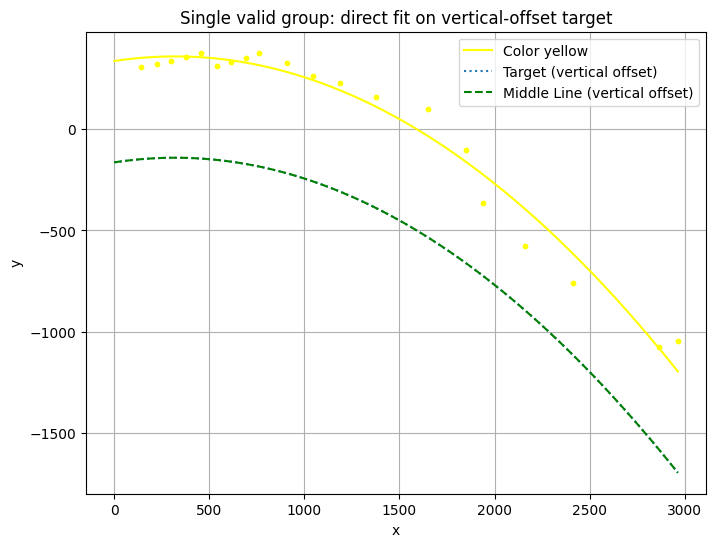

{'x_list': [40.2886962890625, 122.8905029296875, 200.5286865234375, 278.62109375, 356.18438720703125, 438.77734375, 514.42041015625, 590.9258422851562, 808.2612915039062, 660.3062744140625, 1750.8900146484375, 1278.7412109375, 1840.87255859375, 1550.7181396484375, 1089.3851318359375, 2061.734619140625, 946.530029296875, 2312.77880859375, 2765.655517578125, 2864.051025390625], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 331.65692138671875, 352.2445983886719, 327.8935241699219, 375.2696228027344, -101.65692901611328, 159.17713928222656, -364.57720947265625, 101.00840759277344, 229.2730255126953, -577.1908569335938, 262.6852722167969, -760.0604858398438, -1074.1160888671875, -1044.259765625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


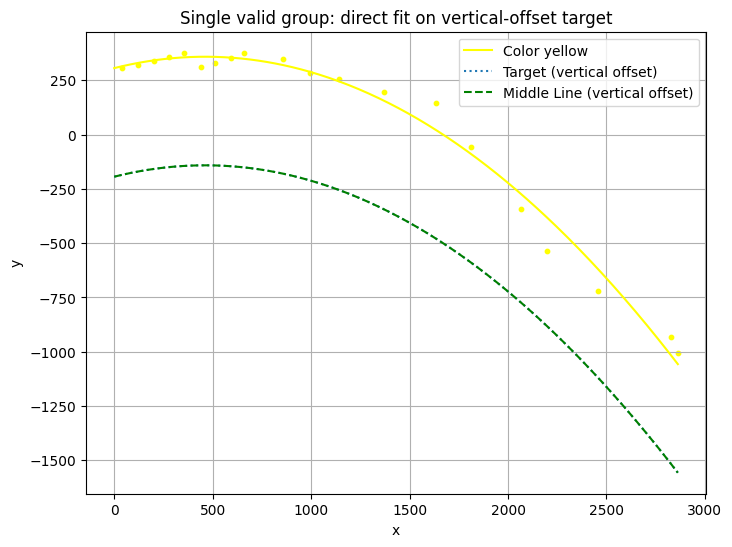

{'x_list': [-59.7113037109375, 22.8905029296875, 100.5286865234375, 178.62109375, 256.18438720703125, 338.77734375, 414.42041015625, 490.92584228515625, 560.3062744140625, 757.9979858398438, 1713.5872802734375, 1267.9588623046875, 1535.5003662109375, 1967.291015625, 892.8153686523438, 1041.2169189453125, 2095.897705078125, 2357.46533203125, 2762.614990234375, 2727.59326171875], 'y_list': [304.5851745605469, 319.4214782714844, 337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 331.65692138671875, 352.2445983886719, 375.2696228027344, 347.7442626953125, -56.02146530151367, 197.17979431152344, 144.9250946044922, -343.2481994628906, 284.91253662109375, 256.75396728515625, -537.016357421875, -718.942138671875, -1006.4765625, -931.0830078125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


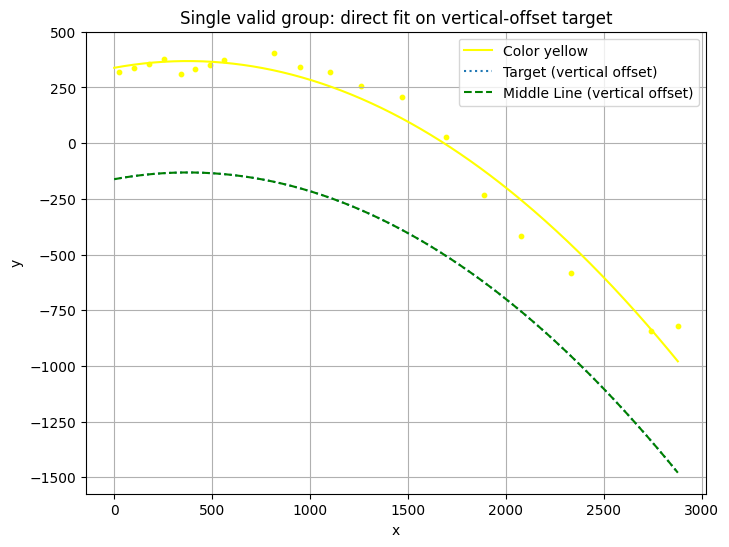

{'x_list': [-77.1094970703125, 0.5286865234375, 78.62109375, 156.18438720703125, 238.77734375, 314.42041015625, 390.92584228515625, 460.3062744140625, 714.5977172851562, 1593.33544921875, 849.4769287109375, 1157.657958984375, 1785.822998046875, 999.977294921875, 1370.786376953125, 1976.953369140625, 2232.564208984375, 2639.122802734375, 2777.81787109375], 'y_list': [319.4214782714844, 337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 331.65692138671875, 352.2445983886719, 375.2696228027344, 405.8848571777344, 29.454587936401367, 343.00469970703125, 254.78855895996094, -231.7541961669922, 319.6443176269531, 207.9712371826172, -418.6437683105469, -582.4930419921875, -843.6710815429688, -822.4970092773438], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


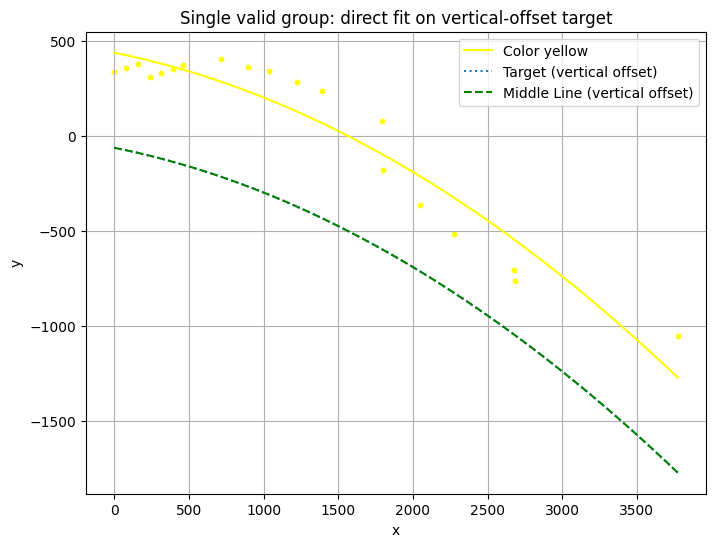

{'x_list': [-99.4713134765625, -21.37890625, 56.18438720703125, 138.77734375, 214.42041015625, 290.92584228515625, 360.3062744140625, 614.5977172851562, 1696.4432373046875, 795.1006469726562, 1123.10888671875, 1702.2352294921875, 1950.577880859375, 939.3531494140625, 1288.630126953125, 2177.9296875, 2580.84375, 3674.28466796875, 2578.928955078125], 'y_list': [337.1930847167969, 355.7315673828125, 376.71673583984375, 310.8888854980469, 331.65692138671875, 352.2445983886719, 375.2696228027344, 405.8848571777344, 78.20515441894531, 365.5267333984375, 286.9150085449219, -176.6204071044922, -364.4853210449219, 344.42828369140625, 238.76956176757812, -515.1428833007812, -764.931396484375, -1051.1287841796875, -702.93603515625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


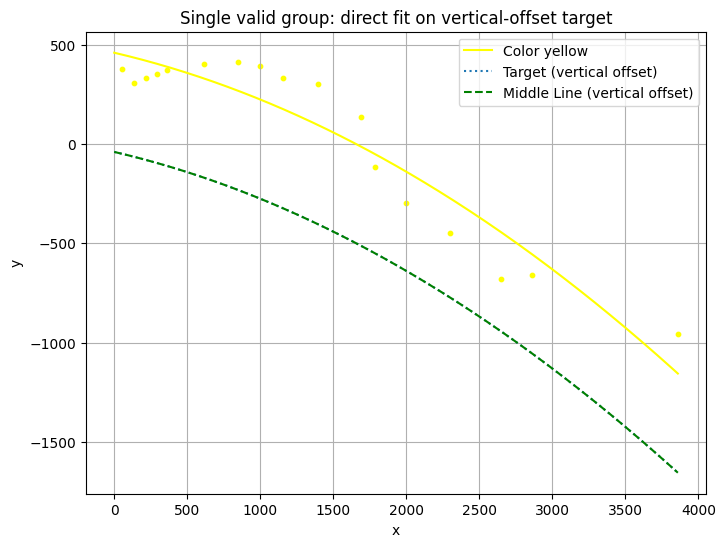

{'x_list': [-43.81561279296875, 38.77734375, 114.42041015625, 190.92584228515625, 260.3062744140625, 514.5977172851562, 1592.4083251953125, 748.7437133789062, 1685.35888671875, 1294.449951171875, 1898.30078125, 898.935546875, 1058.576171875, 2196.373291015625, 2550.74658203125, 2759.54345703125, 3758.71240234375], 'y_list': [376.71673583984375, 310.8888854980469, 331.65692138671875, 352.2445983886719, 375.2696228027344, 405.8848571777344, 137.9287109375, 412.7494201660156, -116.89678192138672, 305.139892578125, -296.4187927246094, 395.8140869140625, 332.7539978027344, -449.9706115722656, -679.1865844726562, -661.8129272460938, -955.9723510742188], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


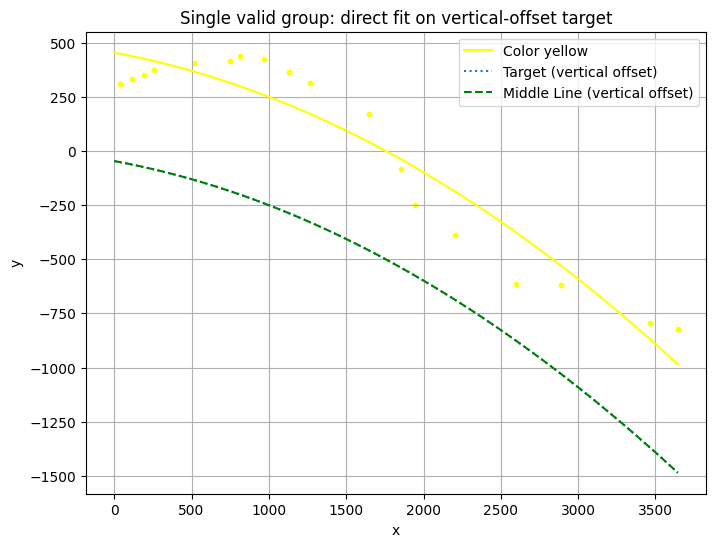

{'x_list': [-61.22265625, 14.42041015625, 90.92584228515625, 160.3062744140625, 414.59771728515625, 648.7437133789062, 1545.77734375, 715.0897216796875, 1168.935791015625, 1028.37744140625, 1751.55810546875, 866.9877319335938, 1843.65966796875, 2105.32763671875, 2495.172607421875, 2792.223876953125, 3364.96630859375, 3544.58544921875], 'y_list': [310.8888854980469, 331.65692138671875, 352.2445983886719, 375.2696228027344, 405.8848571777344, 412.7494201660156, 172.57620239257812, 437.618408203125, 314.130859375, 361.8986511230469, -83.82238006591797, 424.4659118652344, -251.11184692382812, -390.1759338378906, -616.0917358398438, -617.6766967773438, -793.6373901367188, -823.1154174804688], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


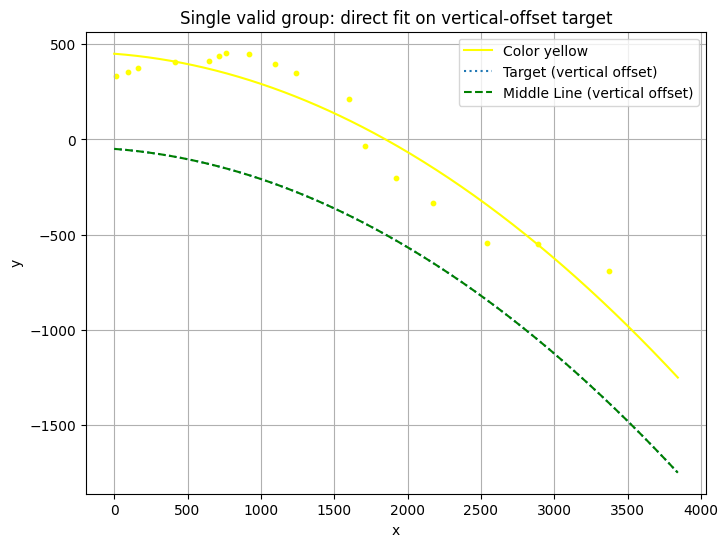

{'x_list': [-85.57958984375, -9.07415771484375, 60.3062744140625, 314.59771728515625, 548.7437133789062, 615.0897216796875, 1500.4188232421875, 1608.7574462890625, 821.0773315429688, 663.7210693359375, 1136.5340576171875, 994.126708984375, 1819.080078125, 2075.787109375, 2441.84375, 2791.20458984375, 3271.997802734375], 'y_list': [331.65692138671875, 352.2445983886719, 375.2696228027344, 405.8848571777344, 412.7494201660156, 437.618408203125, 213.1927947998047, -36.24918746948242, 449.1054382324219, 455.6164245605469, 349.5252380371094, 395.54742431640625, -204.0782012939453, -335.3981018066406, -545.9263305664062, -546.9295654296875, -693.7758178710938], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


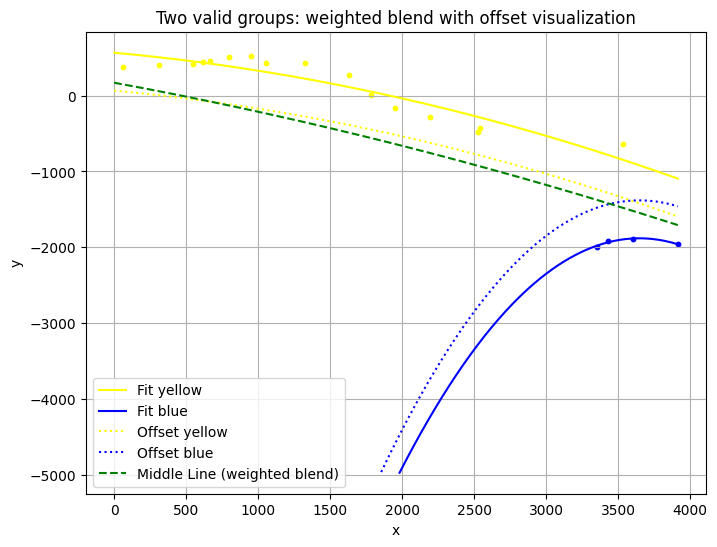

{'x_list': [-39.6937255859375, 214.59771728515625, 448.74371337890625, 515.0897216796875, 563.7210693359375, 1529.4539794921875, 847.4111938476562, 1228.47412109375, 953.8707275390625, 1680.85107421875, 697.8511352539062, 2094.090576171875, 1847.7843017578125, 3327.0908203125, 3504.821044921875, 2441.620361328125, 2429.07080078125, 3815.3330078125, 3250.73388671875, 3435.914306640625], 'y_list': [375.2696228027344, 405.8848571777344, 412.7494201660156, 437.618408203125, 455.6164245605469, 266.6622009277344, 514.8179321289062, 423.7105407714844, 426.6679382324219, 6.876281261444092, 505.3194885253906, -288.2156982421875, -160.59487915039062, -1920.8170166015625, -1891.2210693359375, -425.9320983886719, -485.7539978027344, -1959.674072265625, -1989.875, -644.8304443359375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]}


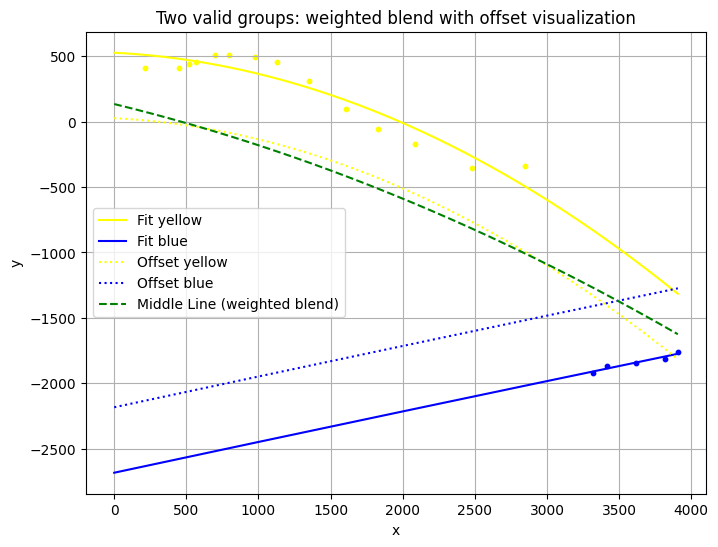

{'x_list': [114.59771728515625, 348.74371337890625, 415.0897216796875, 463.7210693359375, 597.8511352539062, 1505.082275390625, 878.6548461914062, 1250.9412841796875, 1028.514404296875, 1726.20361328125, 1986.389892578125, 2383.562744140625, 3714.946044921875, 3516.553955078125, 694.8154907226562, 3807.099853515625, 3215.780517578125, 2750.47314453125, 3312.627685546875], 'y_list': [405.8848571777344, 412.7494201660156, 437.618408203125, 455.6164245605469, 505.3194885253906, 93.3691177368164, 493.9651794433594, 308.19586181640625, 455.9671325683594, -57.985321044921875, -173.33839416503906, -358.3155212402344, -1811.6414794921875, -1843.5064697265625, 507.48858642578125, -1761.875, -1923.526611328125, -341.66766357421875, -1866.120361328125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1]}


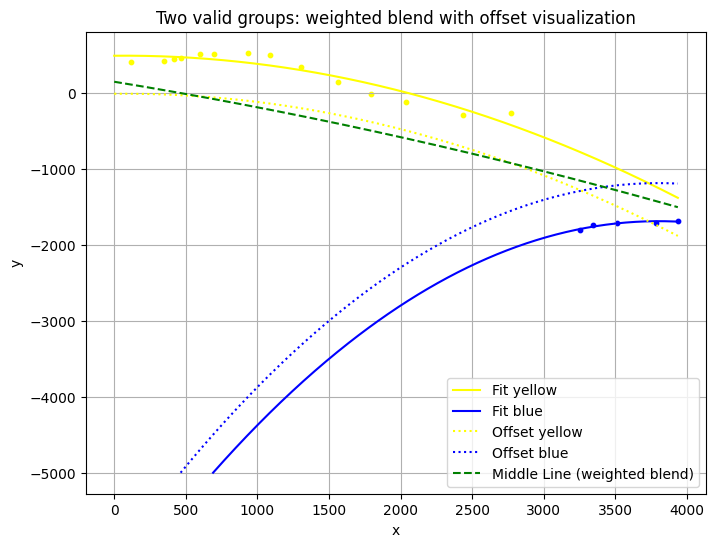

{'x_list': [14.59771728515625, 248.74371337890625, 315.0897216796875, 363.7210693359375, 497.85113525390625, 594.8154907226562, 1203.5264892578125, 3414.85546875, 1466.3363037109375, 990.452880859375, 836.1994018554688, 1697.0460205078125, 1940.7117919921875, 3150.453125, 3683.81396484375, 2333.606201171875, 3244.8271484375, 3837.3876953125, 2670.203369140625], 'y_list': [405.8848571777344, 412.7494201660156, 437.618408203125, 455.6164245605469, 505.3194885253906, 507.48858642578125, 343.0561828613281, -1709.6273193359375, 133.87876892089844, 489.2583923339844, 524.6561279296875, -12.12100887298584, -120.99718475341797, -1806.421142578125, -1709.2816162109375, -295.8803405761719, -1743.9000244140625, -1683.2496337890625, -266.87152099609375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0]}


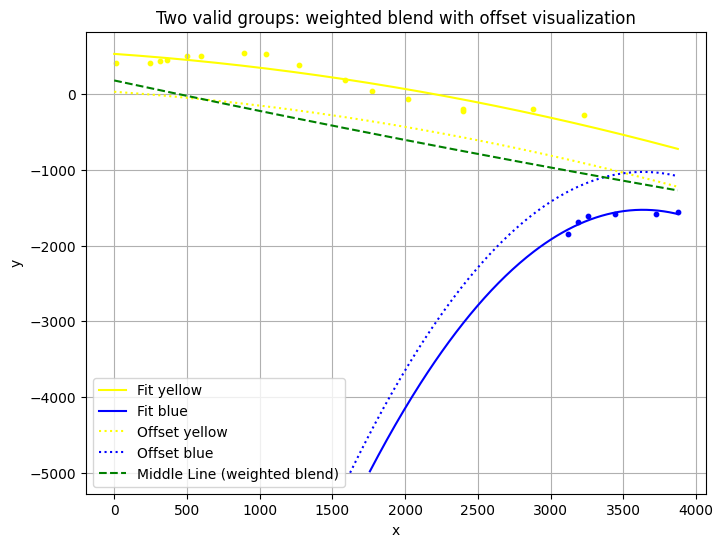

{'x_list': [-85.40228271484375, 148.74371337890625, 215.0897216796875, 263.7210693359375, 397.85113525390625, 494.81549072265625, 791.7021484375, 944.906005859375, 1168.9888916015625, 1488.2889404296875, 1675.0867919921875, 3087.606689453125, 1921.9451904296875, 2296.967041015625, 3339.4833984375, 3774.551513671875, 3018.238525390625, 3626.858154296875, 3157.358154296875, 2778.97265625, 3129.497314453125, 2299.527587890625], 'y_list': [405.8848571777344, 412.7494201660156, 437.618408203125, 455.6164245605469, 505.3194885253906, 507.48858642578125, 545.379150390625, 523.3811645507812, 382.44573974609375, 183.97959899902344, 37.68350601196289, -1684.7215576171875, -67.7495346069336, -230.1168670654297, -1580.7962646484375, -1552.13671875, -1851.4920654296875, -1586.1077880859375, -1612.8760986328125, -195.91506958007812, -276.00384521484375, -200.49786376953125], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]}


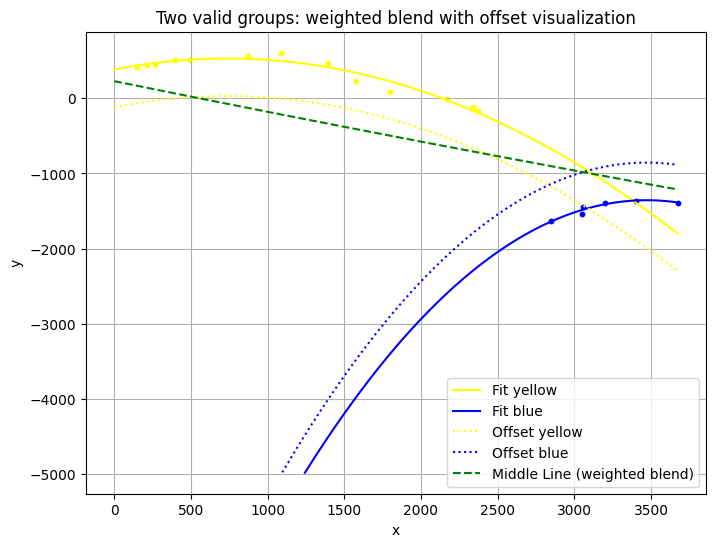

{'x_list': [48.74371337890625, 115.0897216796875, 163.7210693359375, 297.85113525390625, 394.81549072265625, 989.8153076171875, 1293.23046875, 1474.58935546875, 1697.0943603515625, 2068.151123046875, 2949.131591796875, 2956.69921875, 2750.45263671875, 3100.025634765625, 2270.865478515625, 2240.86083984375, 3299.301513671875, 774.7142333984375, 3575.430908203125], 'y_list': [412.7494201660156, 437.618408203125, 455.6164245605469, 505.3194885253906, 507.48858642578125, 604.8507080078125, 473.429931640625, 230.41087341308594, 85.1567153930664, -16.635194778442383, -1541.0997314453125, -1445.8631591796875, -1631.466064453125, -1395.3955078125, -171.51596069335938, -110.7401123046875, -1361.4344482421875, 567.7909545898438, -1387.1402587890625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1]}


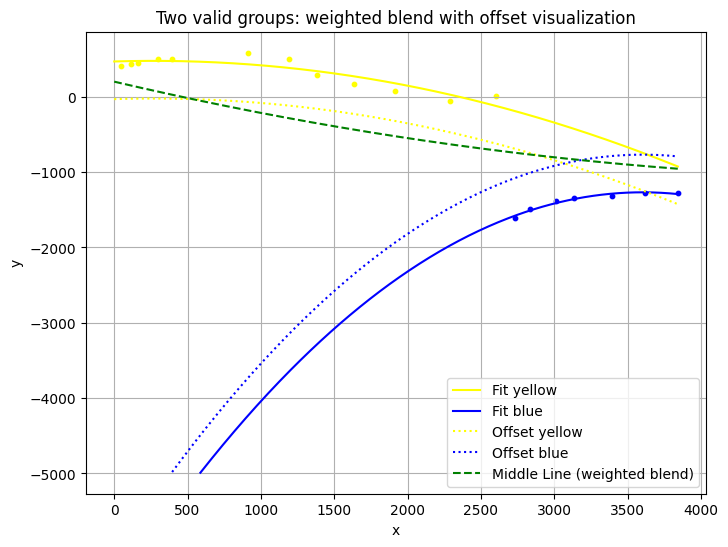

{'x_list': [-51.25628662109375, 15.0897216796875, 63.7210693359375, 197.85113525390625, 294.81549072265625, 1088.6483154296875, 1531.7447509765625, 1281.64453125, 1813.5701904296875, 2191.463623046875, 2734.348388671875, 3290.92138671875, 2912.614990234375, 2630.696533203125, 3742.49609375, 3517.828125, 3031.533935546875, 2504.922119140625, 810.6210327148438], 'y_list': [412.7494201660156, 437.618408203125, 455.6164245605469, 505.3194885253906, 507.48858642578125, 503.359130859375, 164.52816772460938, 286.7917175292969, 79.05731964111328, -54.60807418823242, -1490.4241943359375, -1323.0841064453125, -1385.7763671875, -1610.6937255859375, -1273.4273681640625, -1282.2913818359375, -1336.860107421875, 9.869067192077637, 585.638916015625], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0]}


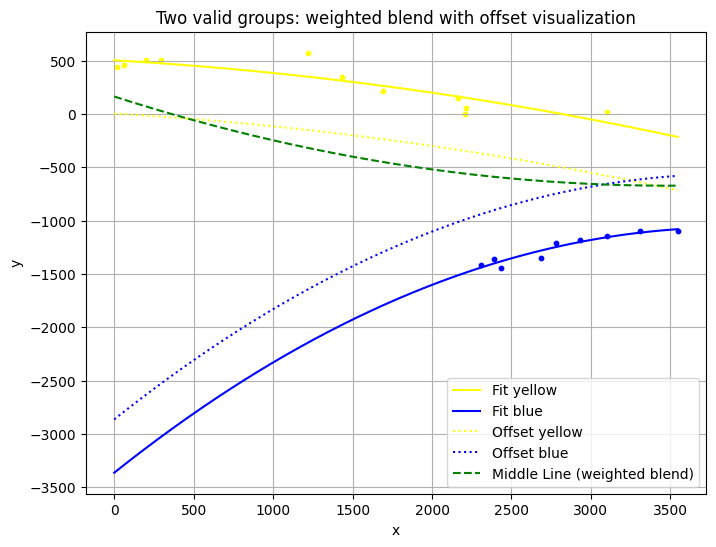

{'x_list': [-84.9102783203125, -36.2789306640625, 97.85113525390625, 194.81549072265625, 1120.56640625, 1335.7059326171875, 2061.91943359375, 1591.1781005859375, 2291.845947265625, 2109.560791015625, 2679.59521484375, 2582.779052734375, 2832.298583984375, 3000.770751953125, 3446.91943359375, 3210.43115234375, 2210.955322265625, 2113.185791015625, 3002.95947265625, 2333.05224609375], 'y_list': [437.618408203125, 455.6164245605469, 505.3194885253906, 507.48858642578125, 574.8289794921875, 346.5706787109375, 149.7167510986328, 218.38711547851562, -1355.6390380859375, 2.107002019882202, -1212.818359375, -1349.608154296875, -1184.919189453125, -1139.332275390625, -1095.5526123046875, -1101.755615234375, -1412.971435546875, 56.63844680786133, 23.37091636657715, -1444.650146484375], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]}


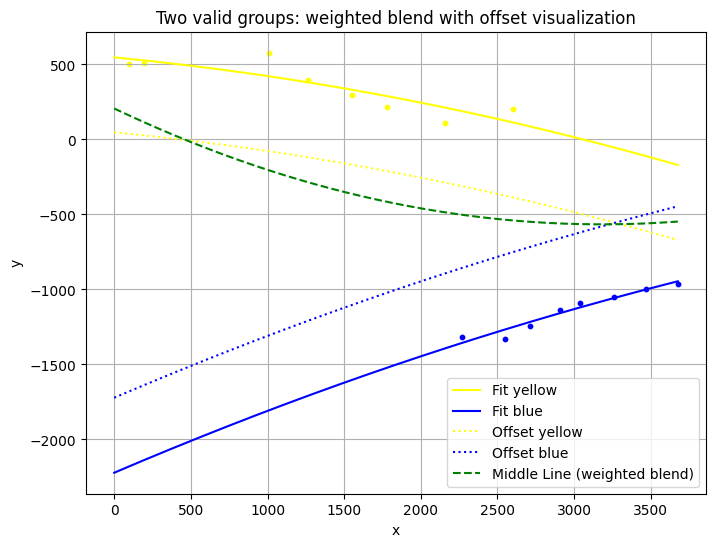

{'x_list': [-2.14886474609375, 94.81549072265625, 907.8167114257812, 1165.6669921875, 1448.6435546875, 2450.489013671875, 1679.578369140625, 2810.193359375, 2060.190185546875, 2612.74609375, 3161.961669921875, 2939.360107421875, 2169.596923828125, 3576.7236328125, 3370.3720703125, 2503.997802734375], 'y_list': [505.3194885253906, 507.48858642578125, 578.5110473632812, 396.4031982421875, 295.35369873046875, -1328.937744140625, 219.24949645996094, -1136.782470703125, 109.25399017333984, -1243.222412109375, -1047.6014404296875, -1087.1876220703125, -1317.6556396484375, -962.7167358398438, -994.7647705078125, 202.31588745117188], 'c_list': [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0]}


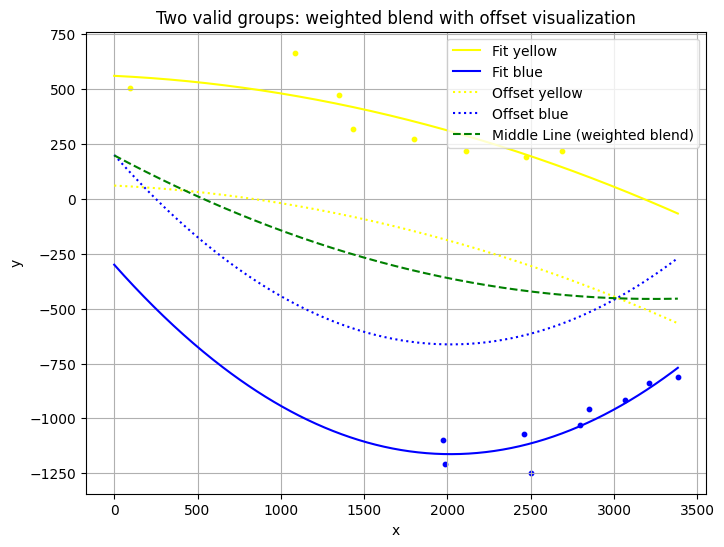

{'x_list': [-5.18450927734375, 986.482177734375, 1333.01416015625, 1247.0283203125, 1696.3973388671875, 2399.479248046875, 2368.55029296875, 2697.019287109375, 3106.799560546875, 2963.185791015625, 2360.962890625, 1871.679931640625, 3282.58544921875, 1887.6572265625, 2749.46533203125, 2010.895751953125, 2590.33203125], 'y_list': [507.48858642578125, 665.9971313476562, 316.9894714355469, 474.85235595703125, 271.8569030761719, -1247.5980224609375, 190.9444580078125, -1031.7286376953125, -840.8539428710938, -914.8475952148438, -1071.41064453125, -1099.7547607421875, -809.5101318359375, -1205.81689453125, -957.7455444335938, 216.08279418945312, 220.3610382080078], 'c_list': [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]}


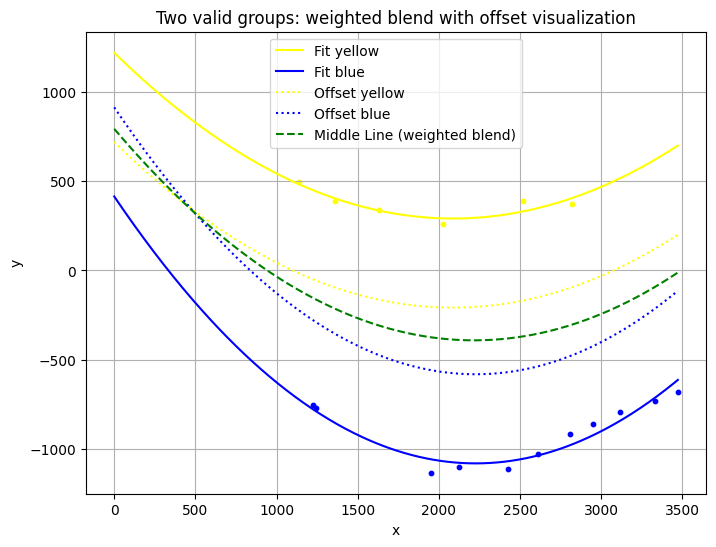

{'x_list': [1040.536376953125, 1258.488525390625, 2021.822998046875, 1530.476318359375, 1922.6702880859375, 2511.056640625, 1122.8475341796875, 2324.947021484375, 2847.3603515625, 3016.608154296875, 1851.9007568359375, 2709.655517578125, 3228.689697265625, 3371.593994140625, 2418.314208984375, 1142.9210205078125, 2721.614013671875], 'y_list': [496.5903015136719, 389.7247619628906, -1100.91748046875, 340.58087158203125, 259.3839416503906, -1029.24853515625, -756.2898559570312, -1111.8629150390625, -860.4701538085938, -796.5768432617188, -1134.9329833984375, -917.7818603515625, -733.0704345703125, -681.658447265625, 390.0389099121094, -772.1220092773438, 375.09344482421875], 'c_list': [0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]}


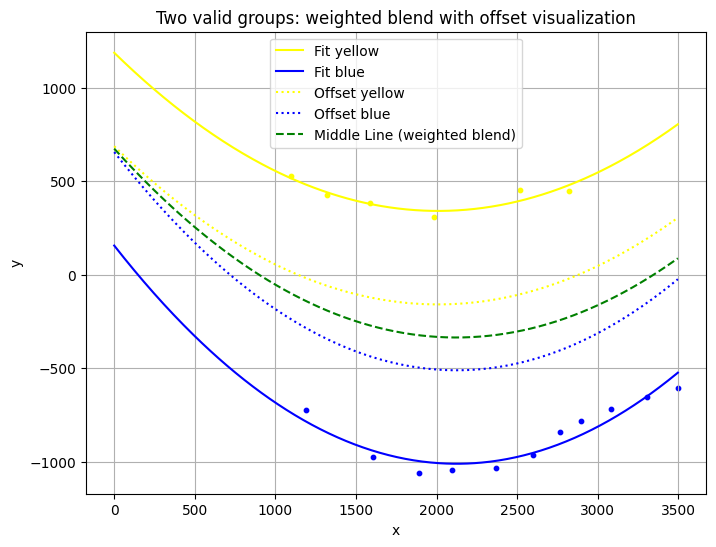

{'x_list': [1219.1494140625, 994.9996337890625, 2267.48388671875, 1994.964599609375, 1486.6732177734375, 2980.776123046875, 2663.342529296875, 1881.6673583984375, 3208.099365234375, 1792.0723876953125, 2498.452392578125, 2797.56884765625, 3396.76611328125, 1090.27392578125, 1507.4271240234375, 2419.210693359375, 2720.617431640625], 'y_list': [427.0114440917969, 528.606201171875, -1033.6092529296875, -1042.779296875, 382.4820251464844, -717.1771850585938, -839.8602905273438, 309.2340393066406, -653.5838623046875, -1060.0076904296875, -964.7012939453125, -782.690673828125, -607.5431518554688, -726.1190795898438, -975.8607788085938, 452.25372314453125, 446.9198913574219], 'c_list': [0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0]}


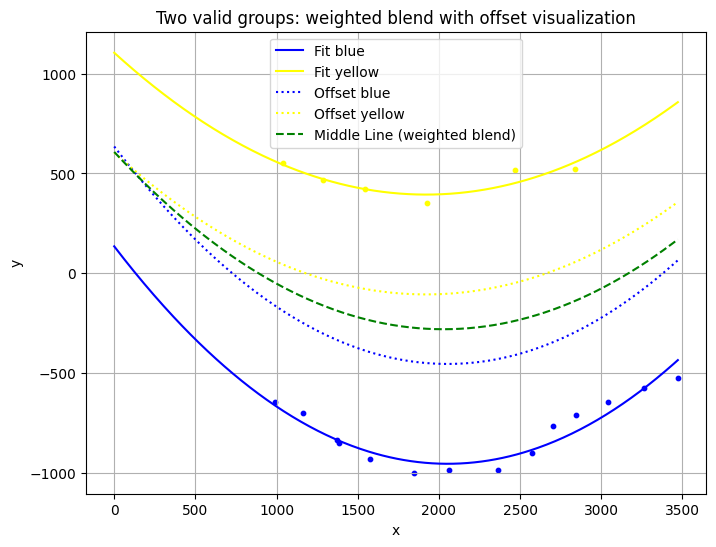

{'x_list': [941.887939453125, 1187.287109375, 1443.9522705078125, 1825.1356201171875, 2266.638427734375, 1959.453125, 2941.50927734375, 1748.8857421875, 2470.886474609375, 3164.263427734375, 2603.915771484375, 2746.442138671875, 3371.593994140625, 1060.517822265625, 2366.9345703125, 890.9483642578125, 2735.46142578125, 1282.908935546875, 1275.1396484375, 1474.58935546875], 'y_list': [554.501953125, 466.0509338378906, 422.2749938964844, 354.36834716796875, -983.9599609375, -983.9786376953125, -642.5595092773438, -998.7346801757812, -898.6417236328125, -574.4911499023438, -762.9159545898438, -707.5480346679688, -525.1053466796875, -699.2484741210938, 516.059814453125, -643.7093505859375, 524.3357543945312, -850.1336059570312, -833.3192749023438, -932.39599609375], 'c_list': [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]}


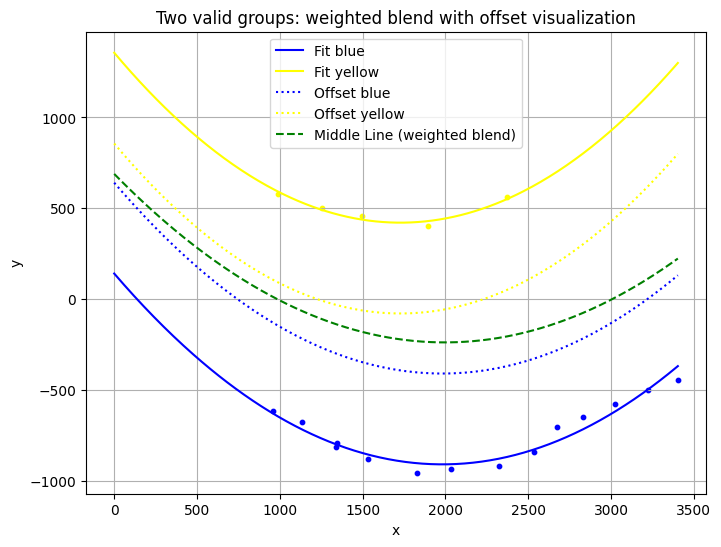

{'x_list': [891.5310668945312, 1154.4146728515625, 1398.73046875, 1934.8631591796875, 2431.933837890625, 2575.150634765625, 2924.364501953125, 2223.437744140625, 1794.382568359375, 3122.68017578125, 1728.3426513671875, 858.2572631835938, 2731.452880859375, 3302.893310546875, 2271.7109375, 1031.749267578125, 1432.7332763671875, 1236.3450927734375, 1245.406982421875], 'y_list': [579.0059204101562, 502.15606689453125, 457.2516174316406, -934.8009033203125, -839.3317260742188, -701.6093139648438, -578.8325805664062, -919.1428833007812, 401.6653747558594, -500.446533203125, -955.8922729492188, -616.5826416015625, -647.3941040039062, -444.223876953125, 559.6836547851562, -674.7799072265625, -881.98583984375, -815.3809814453125, -794.0735473632812], 'c_list': [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]}


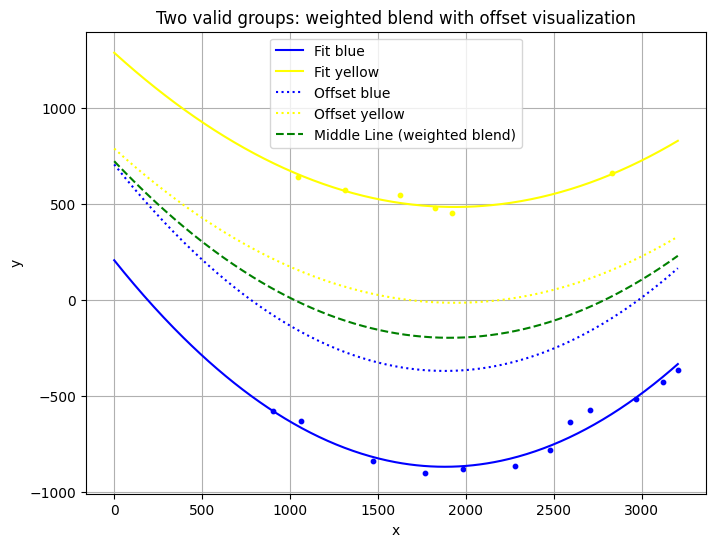

{'x_list': [1214.6607666015625, 945.4732666015625, 1524.6331787109375, 2379.147216796875, 2178.556884765625, 2489.655517578125, 1820.2957763671875, 1883.8858642578125, 1666.1669921875, 803.868408203125, 2607.751953125, 2867.845703125, 3021.0126953125, 964.86083984375, 2729.448486328125, 1724.4373779296875, 1371.32373046875, 3105.670654296875], 'y_list': [575.0618896484375, 643.3753662109375, 545.7904663085938, -780.2791748046875, -867.5653686523438, -635.7282104492188, 454.034423828125, -881.8899536132812, -901.1625366210938, -581.0725708007812, -573.4671020507812, -515.3975219726562, -429.152099609375, -630.6488037109375, 660.7699584960938, 481.3961486816406, -841.9249877929688, -364.67138671875], 'c_list': [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]}


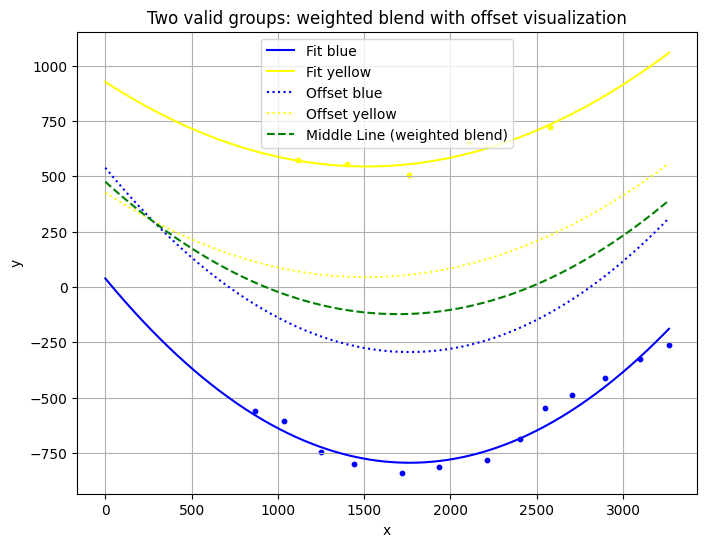

{'x_list': [1014.1142578125, 1299.575927734375, 1659.3096923828125, 1833.904541015625, 2305.060546875, 2446.59716796875, 2603.915771484375, 2114.6240234375, 2797.56884765625, 768.4816284179688, 1619.820556640625, 2999.676513671875, 2479.11962890625, 3166.56494140625, 935.001220703125, 2004.749267578125, 1340.455810546875, 1152.541259765625], 'y_list': [574.970947265625, 555.5462036132812, 503.2960510253906, -812.8583374023438, -686.8015747070312, -548.697509765625, -486.4229431152344, -780.9391479492188, -410.5021057128906, -559.739013671875, -839.1466674804688, -327.1928405761719, 720.3786010742188, -261.13232421875, -607.1845703125, 652.9928588867188, -800.2119750976562, -746.8804931640625], 'c_list': [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]}


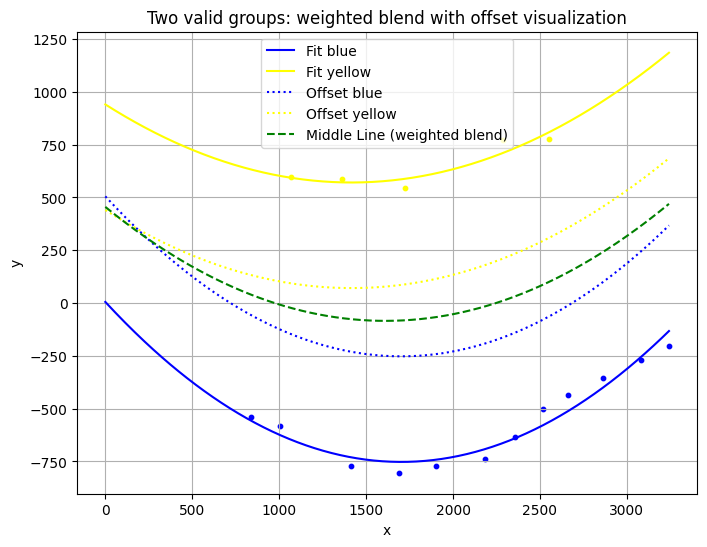

{'x_list': [967.2484130859375, 1260.7947998046875, 1802.780029296875, 2560.996337890625, 2257.999267578125, 2979.6884765625, 2420.10693359375, 2763.62841796875, 2084.701904296875, 1625.4339599609375, 738.8815307617188, 1589.0445556640625, 3142.195068359375, 903.783203125, 2451.12451171875, 1313.25732421875, 2186.553955078125], 'y_list': [595.761962890625, 586.8916015625, -772.8807983398438, -435.8706970214844, -635.6586303710938, -270.0303039550781, -500.1112365722656, -357.1368408203125, -739.3359375, 542.7814331054688, -541.4725952148438, -803.4556884765625, -204.51426696777344, -584.3598022460938, 775.9114990234375, -771.0280151367188, 771.0661010742188], 'c_list': [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0]}


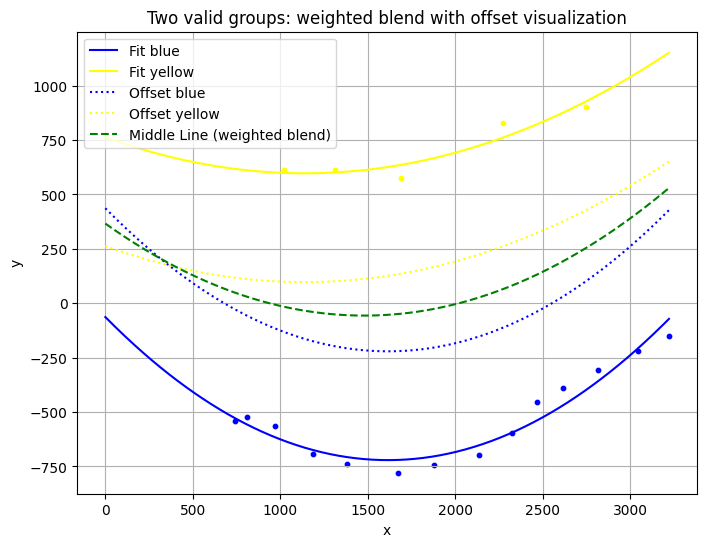

{'x_list': [638.8815307617188, 919.0370483398438, 2036.28857421875, 1569.9891357421875, 2713.6416015625, 1212.6739501953125, 2224.267333984375, 2368.692138671875, 2517.560302734375, 1587.5362548828125, 706.9392700195312, 1779.71875, 2941.50927734375, 3120.407958984375, 2644.34326171875, 2173.669677734375, 871.130126953125, 1084.5745849609375, 1279.6175537109375], 'y_list': [-541.4725952148438, 610.332763671875, -696.9021606445312, -779.0604248046875, -308.5875244140625, 610.3910522460938, -595.7817993164062, -455.0708923339844, -389.37835693359375, 574.0281982421875, -524.13720703125, -742.337646484375, -218.01123046875, -151.6504669189453, 900.3231811523438, 828.4269409179688, -563.5643920898438, -693.2656860351562, -739.9767456054688], 'c_list': [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1]}


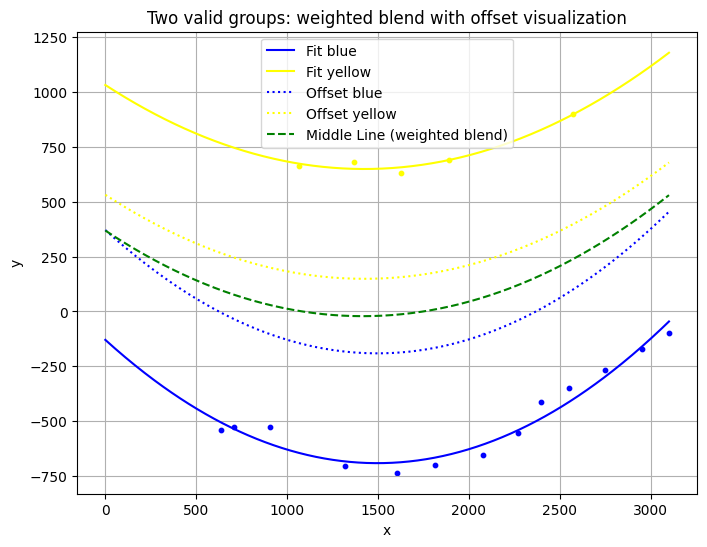

{'x_list': [538.8815307617188, 606.9392700195312, 1268.6346435546875, 1792.48876953125, 1979.672607421875, 2296.113525390625, 1715.5546875, 963.201171875, 2650.191650390625, 806.8522338867188, 2449.313720703125, 2169.0107421875, 1502.1676025390625, 2850.489990234375, 3000.770751953125, 1217.21044921875, 2472.716064453125, 1526.135986328125], 'y_list': [-541.4725952148438, -524.13720703125, 682.5731201171875, 690.4645385742188, -653.5056762695312, -412.3876647949219, -698.5176391601562, 661.06591796875, -265.4131774902344, -526.7423706054688, -348.07244873046875, -554.1032104492188, -734.5037231445312, -172.6509552001953, -99.32640075683594, -702.6279296875, 898.6417236328125, 632.3079223632812], 'c_list': [1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]}


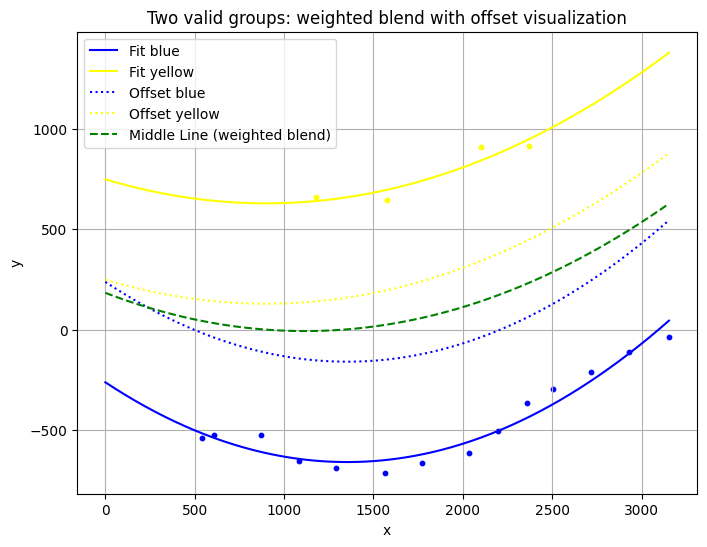

{'x_list': [438.88153076171875, 506.93927001953125, 1077.8428955078125, 1671.8785400390625, 1934.132080078125, 2257.999267578125, 2828.150390625, 2095.112060546875, 1467.3544921875, 2615.638916015625, 1474.114990234375, 3053.3359375, 2405.722412109375, 2271.7109375, 773.633544921875, 1191.3092041015625, 2004.4443359375, 982.529052734375], 'y_list': [-541.4725952148438, -524.13720703125, 659.8695678710938, -666.3129272460938, -612.7921752929688, -363.8752746582031, -110.74010467529297, -503.4528503417969, -712.7474975585938, -208.49070739746094, 646.1383056640625, -35.71368408203125, -297.614013671875, 916.2562866210938, -522.6393432617188, -691.3558959960938, 907.7862548828125, -652.4666748046875], 'c_list': [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1]}


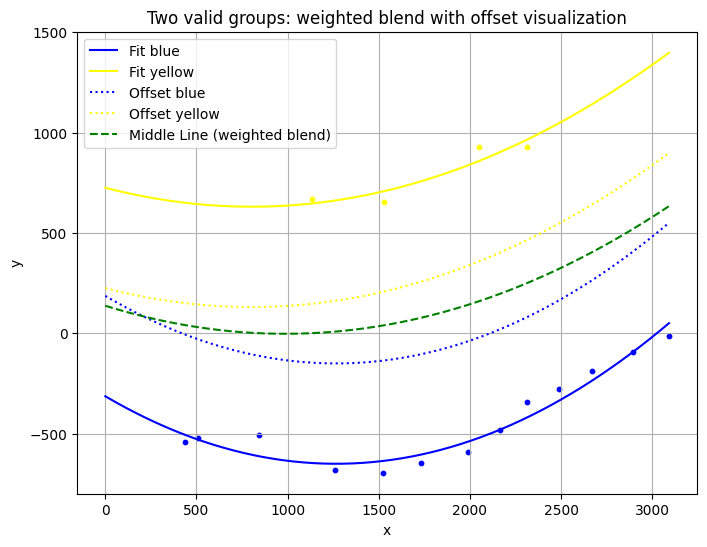

{'x_list': [338.88153076171875, 406.93927001953125, 2064.153564453125, 1034.861328125, 1631.9320068359375, 1425.3834228515625, 1890.4205322265625, 2570.406494140625, 1427.0557861328125, 2212.680908203125, 2390.593994140625, 2792.44287109375, 2212.680908203125, 2992.015869140625, 1160.9974365234375, 742.4494018554688, 1951.6826171875], 'y_list': [-541.4725952148438, -524.13720703125, -484.46392822265625, 667.3341064453125, -647.2057495117188, -694.9288330078125, -592.8375854492188, -189.96641540527344, 653.2627563476562, -343.9095153808594, -279.5498962402344, -93.0471420288086, 928.1148681640625, -14.60682201385498, -683.1099243164062, -507.125732421875, 928.5558471679688], 'c_list': [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]}


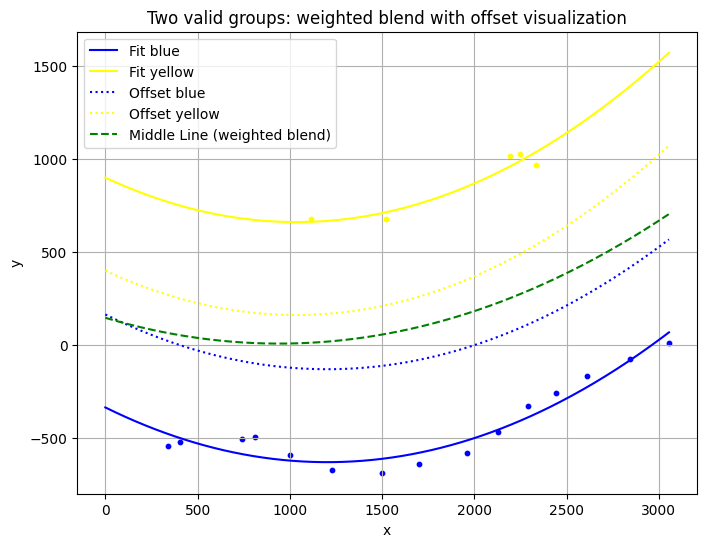

{'x_list': [238.88153076171875, 306.93927001953125, 642.4494018554688, 1016.9351806640625, 1600.7333984375, 1418.96435546875, 2512.914794921875, 1857.541259765625, 2341.126708984375, 1400.2694091796875, 2025.634765625, 2954.537109375, 2742.410888671875, 2189.0087890625, 1127.0087890625, 710.208740234375, 2231.794189453125, 2148.25048828125, 2095.5966796875, 901.6566162109375], 'y_list': [-541.4725952148438, -524.13720703125, -507.125732421875, 677.3863525390625, -637.6561279296875, 679.4129638671875, -168.64794921875, -581.58251953125, -260.1582336425781, -687.1679077148438, -468.0425720214844, 8.657862663269043, -72.63800811767578, -329.8327941894531, -671.75732421875, -497.1043395996094, 967.9410400390625, 1025.623779296875, 1015.8558959960938, -591.192626953125], 'c_list': [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1]}


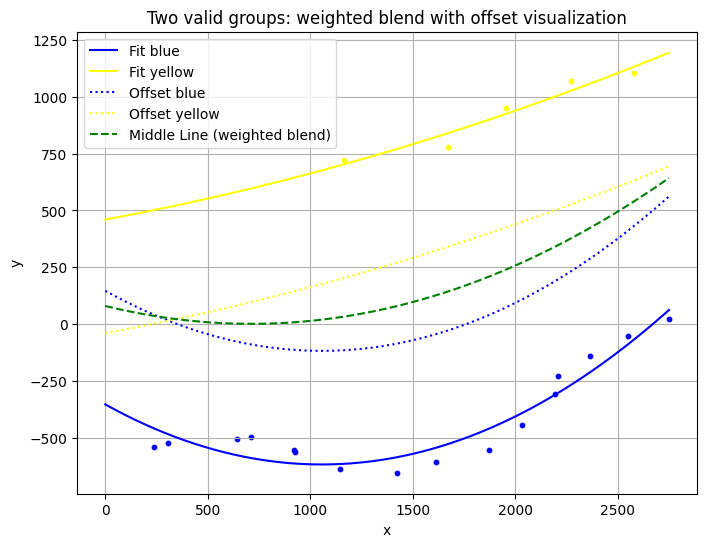

{'x_list': [138.88153076171875, 206.93927001953125, 542.4494018554688, 610.208740234375, 1571.2677001953125, 1512.7081298828125, 2263.047607421875, 1934.8631591796875, 2450.218994140625, 2095.112060546875, 1772.5986328125, 1322.0435791015625, 2111.139404296875, 1062.9412841796875, 2650.191650390625, 1046.846923828125, 2480.891357421875, 827.5127563476562, 1853.2401123046875, 822.3655395507812, 2172.6435546875], 'y_list': [-541.4725952148438, -524.13720703125, -507.125732421875, -497.1043395996094, 777.2738647460938, -606.1928100585938, -141.50704956054688, -444.9573669433594, -50.76056671142578, -308.3648376464844, -555.5462036132812, -654.4027709960938, -227.5562286376953, 720.7086181640625, 20.81671905517578, -639.0869140625, 1105.3355712890625, -561.4828491210938, 952.3648681640625, -554.2914428710938, 1070.3182373046875], 'c_list': [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0]}


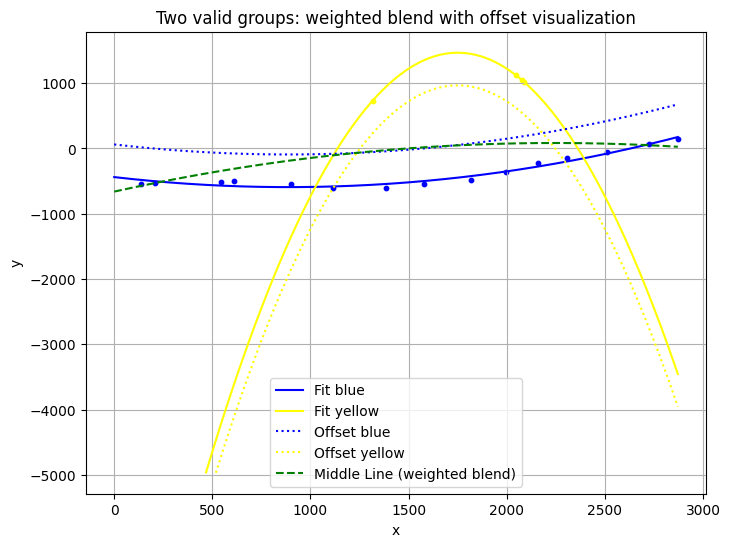

{'x_list': [38.88153076171875, 106.93927001953125, 442.44940185546875, 510.208740234375, 1015.57275390625, 1476.315673828125, 2412.93603515625, 1897.0078125, 2061.05126953125, 1718.963134765625, 1283.933349609375, 2208.5517578125, 1216.4251708984375, 2625.55029296875, 798.9182739257812, 2771.83740234375, 1978.92626953125, 1987.882568359375, 1945.389892578125], 'y_list': [-541.4725952148438, -524.13720703125, -507.125732421875, -497.1043395996094, -607.7738647460938, -548.3778686523438, -50.25041580200195, -366.7373046875, -221.5283660888672, -477.9396057128906, -606.79248046875, -145.50018310546875, 731.7899780273438, 62.110755920410156, -542.242431640625, 146.93630981445312, 1042.0228271484375, 1022.0987548828125, 1126.2406005859375], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0]}


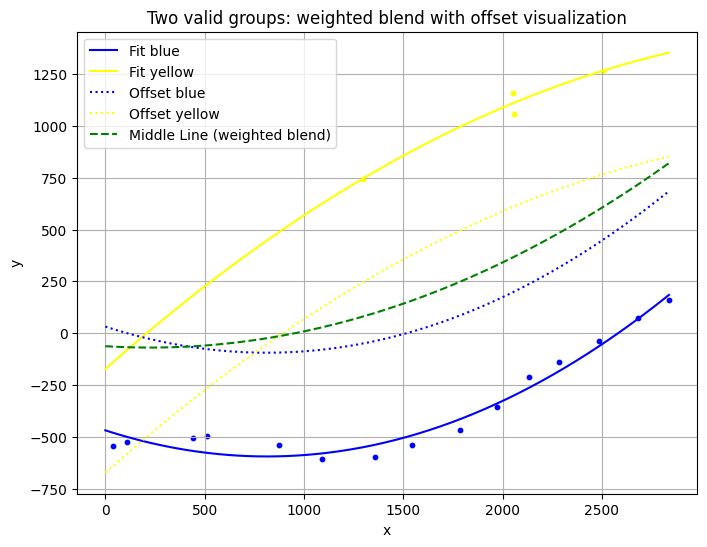

{'x_list': [-61.11846923828125, 6.93927001953125, 342.44940185546875, 410.208740234375, 1872.428466796875, 1445.256591796875, 1685.364501953125, 2386.156494140625, 2580.87109375, 2032.460693359375, 772.9642333984375, 1255.2984619140625, 2185.73583984375, 1195.8541259765625, 990.9083251953125, 2737.371826171875, 1955.75244140625, 2403.97216796875, 1950.1962890625], 'y_list': [-541.4725952148438, -524.13720703125, -507.125732421875, -497.1043395996094, -356.6625671386719, -537.9656372070312, -467.55596923828125, -35.536006927490234, 71.300048828125, -212.54495239257812, -537.8270874023438, -597.5623779296875, -139.7966766357422, 744.9951782226562, -605.0575561523438, 158.7274932861328, 1059.0614013671875, 1265.831787109375, 1158.710693359375], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0]}


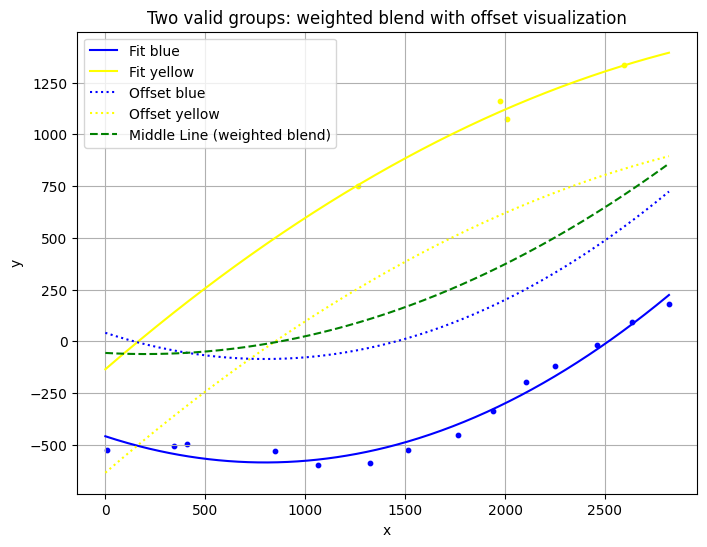

{'x_list': [-93.06072998046875, 242.44940185546875, 310.208740234375, 2535.724853515625, 1839.389892578125, 2003.085693359375, 750.469970703125, 966.0390625, 2359.90478515625, 1226.7847900390625, 2720.42919921875, 1663.609619140625, 1413.6929931640625, 2152.286376953125, 1161.966064453125, 1911.0682373046875, 1876.1488037109375, 2493.404541015625], 'y_list': [-524.13720703125, -507.125732421875, -497.1043395996094, 95.23648834228516, -337.9961853027344, -195.71905517578125, -528.6062622070312, -597.1007690429688, -18.765811920166016, -586.0707397460938, 181.9123992919922, -453.9947204589844, -523.5049438476562, -118.50695037841797, 752.3932495117188, 1072.37841796875, 1161.6549072265625, 1334.302978515625], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]}


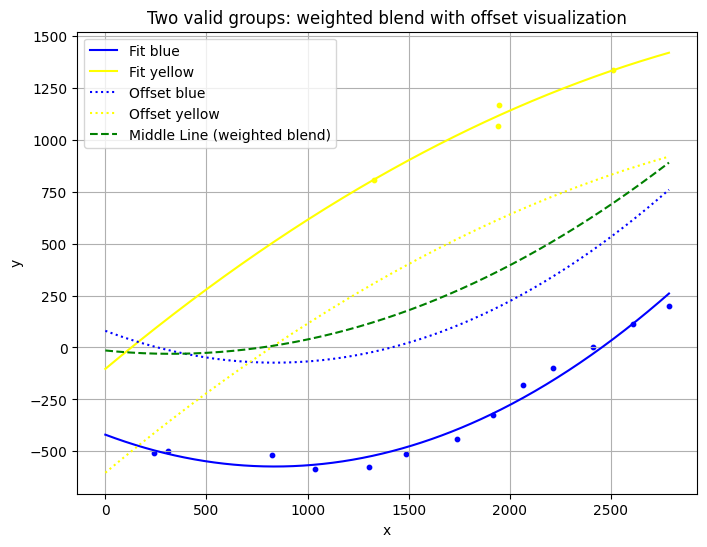

{'x_list': [142.44940185546875, 210.208740234375, 1636.7913818359375, 1388.911376953125, 2310.64697265625, 1815.4560546875, 1967.291015625, 1227.9281005859375, 2111.452880859375, 724.3834838867188, 2507.340576171875, 1203.3409423828125, 935.314453125, 2687.109130859375, 1840.08935546875, 2411.212890625, 1847.6126708984375], 'y_list': [-507.125732421875, -497.1043395996094, -440.8473815917969, -512.5878295898438, 2.300398349761963, -324.837646484375, -178.5684356689453, 808.5868530273438, -99.46922302246094, -518.7748413085938, 114.08538055419922, -576.56689453125, -585.5897827148438, 201.05479431152344, 1066.2752685546875, 1334.75390625, 1165.8912353515625], 'c_list': [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]}


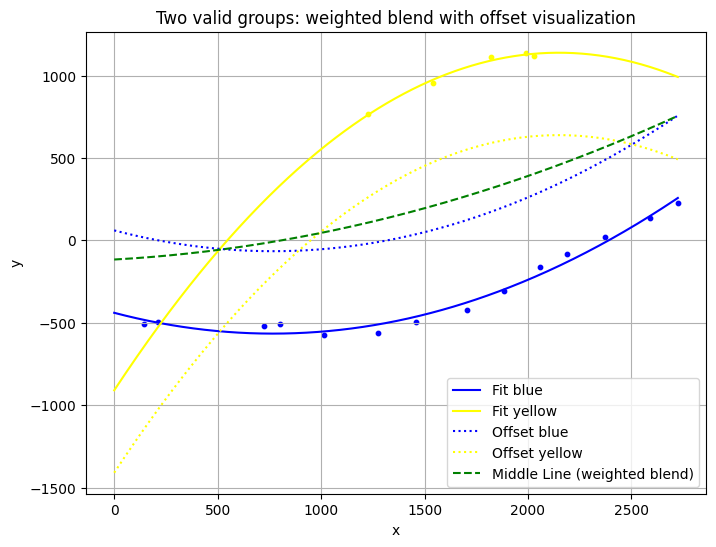

{'x_list': [42.44940185546875, 110.208740234375, 624.3834838867188, 913.405029296875, 700.1944580078125, 1604.780517578125, 2089.611328125, 2491.058349609375, 1784.169921875, 2274.51025390625, 1176.775146484375, 1956.492431640625, 1359.94140625, 2624.580810546875, 1129.03369140625, 1890.534423828125, 1928.013671875, 1722.6844482421875, 1439.1923828125], 'y_list': [-507.125732421875, -497.1043395996094, -518.7748413085938, -576.3237915039062, -507.76171875, -421.619873046875, -83.90880584716797, 135.69967651367188, -307.1558837890625, 20.407819747924805, -563.335205078125, -160.0447235107422, -494.7721862792969, 225.1514892578125, 769.0285034179688, 1134.7735595703125, 1115.62744140625, 1114.0537109375, 953.8814697265625], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]}


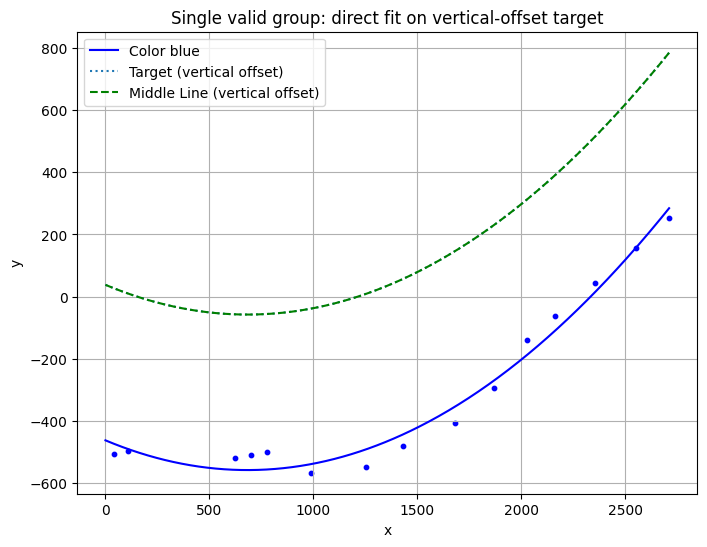

{'x_list': [-57.55059814453125, 10.208740234375, 524.3834838867188, 600.1944580078125, 889.8665771484375, 1581.4273681640625, 678.1810302734375, 1930.476806640625, 1769.22021484375, 1152.10693359375, 2453.21923828125, 2252.95068359375, 1329.3592529296875, 2611.781982421875, 2061.82666015625], 'y_list': [-507.125732421875, -497.1043395996094, -518.7748413085938, -507.76171875, -566.2169799804688, -407.6904602050781, -498.9352111816406, -140.5128631591797, -292.202880859375, -549.3458862304688, 157.9176483154297, 42.676727294921875, -478.9835510253906, 252.2480010986328, -62.11075973510742], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


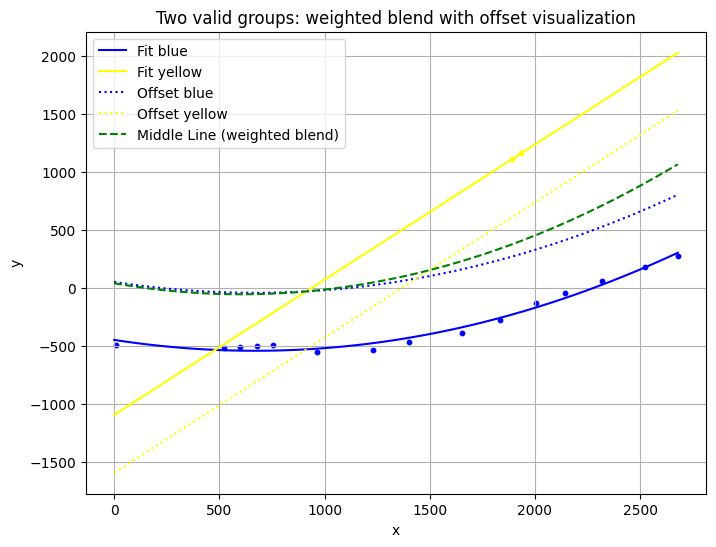

{'x_list': [-89.791259765625, 424.38348388671875, 500.1944580078125, 578.1810302734375, 865.310546875, 2218.45947265625, 1733.150146484375, 1302.5103759765625, 2041.652587890625, 2425.62744140625, 1905.0928955078125, 1551.3187255859375, 1128.3221435546875, 656.527587890625, 2579.917236328125, 1835.8922119140625, 1793.7017822265625], 'y_list': [-497.1043395996094, -518.7748413085938, -507.76171875, -498.9352111816406, -557.3388061523438, 57.58485794067383, -276.1504211425781, -467.9249572753906, -47.20774459838867, 175.56222534179688, -129.1669158935547, -394.4137878417969, -540.7289428710938, -491.2867736816406, 269.921630859375, 1159.6444091796875, 1110.4866943359375], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]}


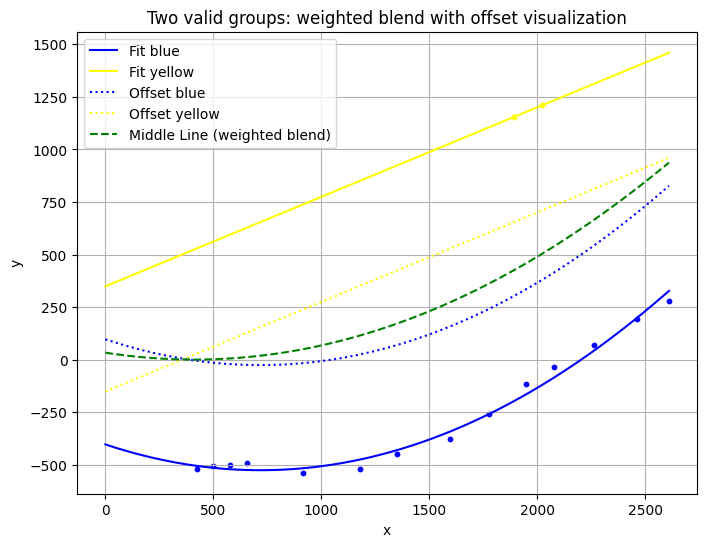

{'x_list': [324.38348388671875, 400.1944580078125, 478.1810302734375, 556.527587890625, 817.5294189453125, 1848.4298095703125, 1678.9190673828125, 1496.3677978515625, 2164.95654296875, 1077.8428955078125, 1977.43359375, 1250.2325439453125, 2361.662353515625, 2510.127685546875, 1924.373291015625, 1790.4305419921875], 'y_list': [-518.7748413085938, -507.76171875, -498.9352111816406, -491.2867736816406, -537.6854858398438, -114.35877990722656, -259.57958984375, -376.91314697265625, 71.4273681640625, -520.6417846679688, -33.87071990966797, -450.9806213378906, 192.3495635986328, 280.25323486328125, 1210.8638916015625, 1153.8267822265625], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]}


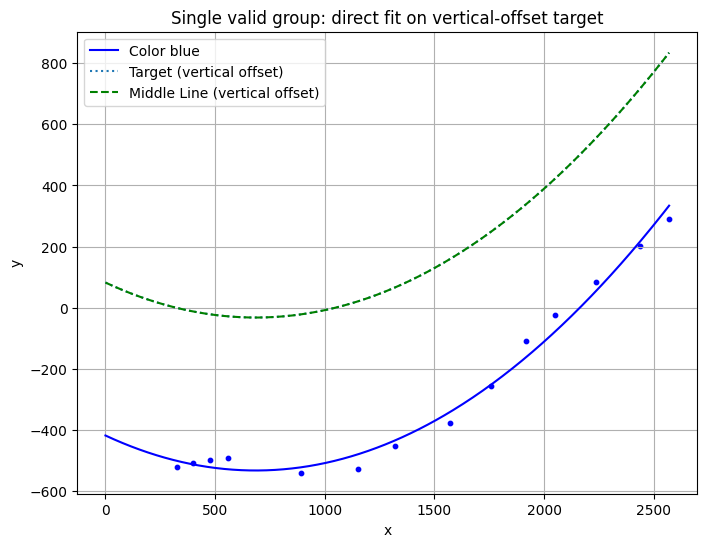

{'x_list': [224.38348388671875, 300.1944580078125, 378.1810302734375, 456.527587890625, 1049.3590087890625, 1659.2222900390625, 1951.68017578125, 1469.0697021484375, 792.38427734375, 1221.971435546875, 1817.5302734375, 2338.516357421875, 2134.486328125, 2469.971923828125], 'y_list': [-518.7748413085938, -507.76171875, -498.9352111816406, -491.2867736816406, -525.4032592773438, -256.79840087890625, -23.612354278564453, -375.4515686035156, -539.0057983398438, -451.4626159667969, -107.04876708984375, 202.08718872070312, 83.27854919433594, 290.5933837890625], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


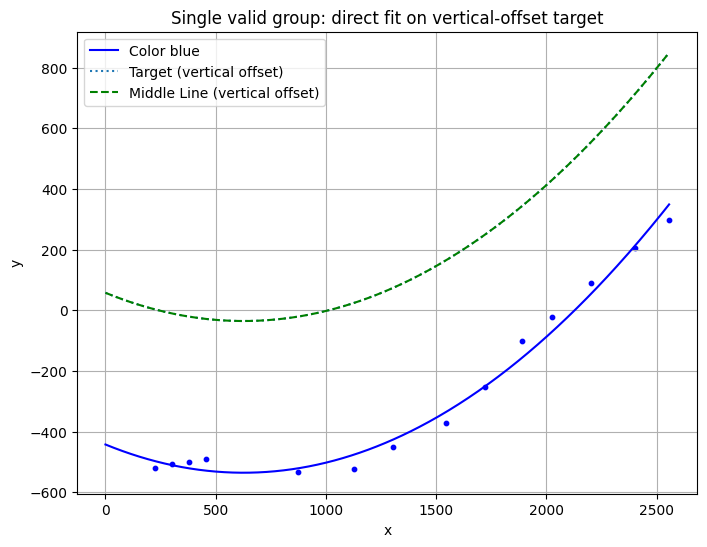

{'x_list': [124.38348388671875, 200.1944580078125, 278.1810302734375, 356.527587890625, 2104.03564453125, 771.3294067382812, 1621.0679931640625, 1787.5740966796875, 1025.9901123046875, 2302.48779296875, 1202.712646484375, 2455.949462890625, 1443.195556640625, 1925.8294677734375], 'y_list': [-518.7748413085938, -507.76171875, -498.9352111816406, -491.2867736816406, 88.49409484863281, -533.2529907226562, -251.4110107421875, -101.77946472167969, -522.2283935546875, 206.0404815673828, -451.7957458496094, 298.82879638671875, -371.03173828125, -21.379621505737305], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


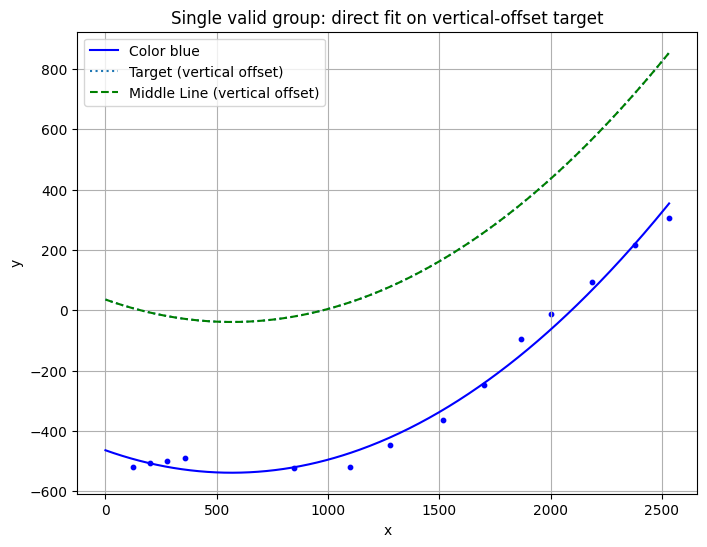

{'x_list': [24.38348388671875, 100.1944580078125, 178.1810302734375, 256.527587890625, 2084.701904296875, 1000.9383544921875, 1901.3236083984375, 745.5730590820312, 1602.5850830078125, 1765.5322265625, 2432.834716796875, 1178.116455078125, 1418.6788330078125, 2280.456298828125], 'y_list': [-518.7748413085938, -507.76171875, -498.9352111816406, -491.2867736816406, 93.98339080810547, -519.0718994140625, -11.520544052124023, -523.8873901367188, -247.1535186767578, -95.23649597167969, 305.4301452636719, -445.9486999511719, -365.2703552246094, 215.41587829589844], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


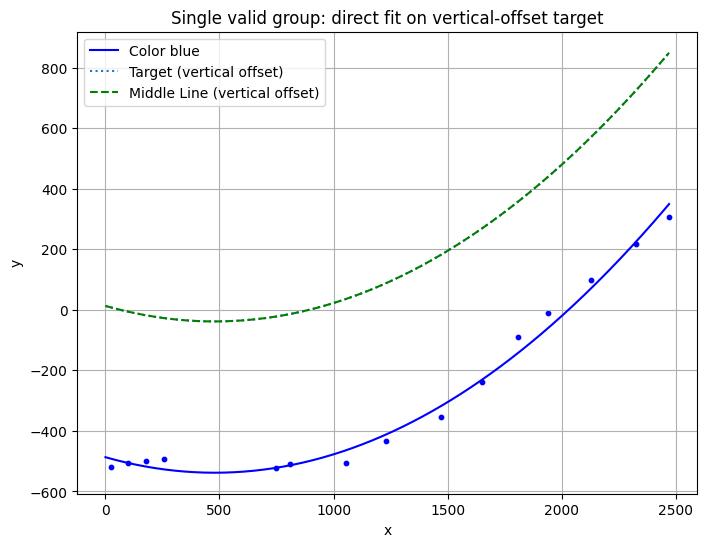

{'x_list': [-75.61651611328125, 0.1944580078125, 78.1810302734375, 156.527587890625, 645.5730590820312, 953.47607421875, 707.8305053710938, 2029.4462890625, 1551.1646728515625, 1710.8646240234375, 1131.104248046875, 1838.7821044921875, 2225.9267578125, 2371.328369140625, 1372.3983154296875], 'y_list': [-518.7748413085938, -507.76171875, -498.9352111816406, -491.2867736816406, -523.8873901367188, -504.62701416015625, -507.81695556640625, 97.67845916748047, -239.6891326904297, -90.70143127441406, -434.88092041015625, -9.300437927246094, 217.0506134033203, 307.2901306152344, -355.70257568359375], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


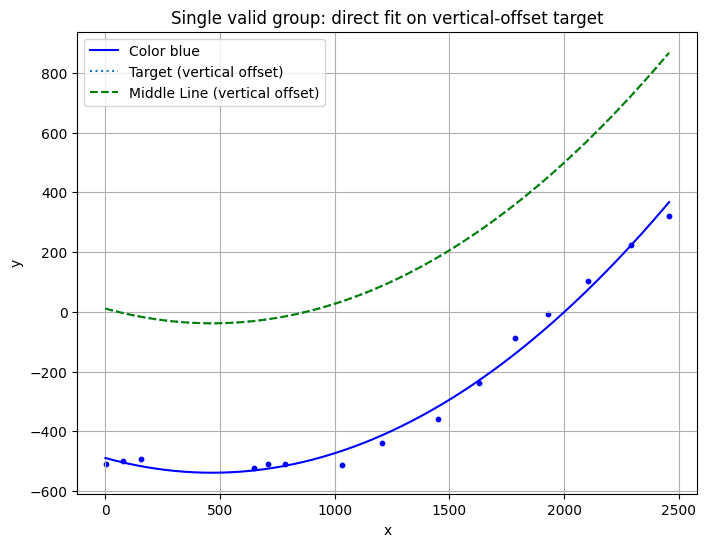

{'x_list': [-99.8055419921875, -21.8189697265625, 56.527587890625, 545.5730590820312, 607.8305053710938, 1348.9647216796875, 929.4267578125, 2001.738525390625, 1528.1136474609375, 2193.10009765625, 1107.2706298828125, 682.9164428710938, 1684.0709228515625, 1830.544189453125, 2357.46533203125], 'y_list': [-507.76171875, -498.9352111816406, -491.2867736816406, -523.8873901367188, -507.81695556640625, -357.4900817871094, -512.3351440429688, 104.4788589477539, -238.0912322998047, 222.8009796142578, -437.9924011230469, -510.546142578125, -87.6725845336914, -5.5585503578186035, 319.7892150878906], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


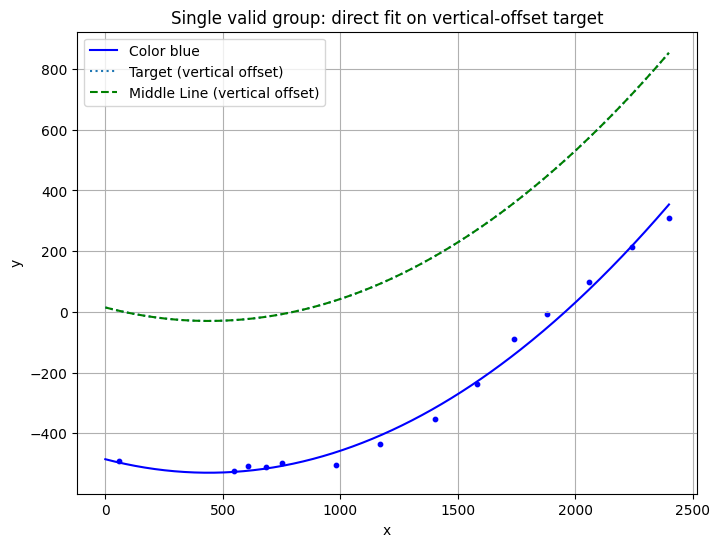

{'x_list': [-43.472412109375, 445.57305908203125, 507.83050537109375, 582.9164428710938, 882.7257690429688, 1957.5771484375, 1479.8507080078125, 1067.4451904296875, 1638.8411865234375, 1301.626220703125, 1778.6798095703125, 2140.885498046875, 2298.674072265625, 650.030029296875], 'y_list': [-491.2867736816406, -523.8873901367188, -507.81695556640625, -510.546142578125, -502.8565368652344, 98.38481140136719, -238.85679626464844, -435.73004150390625, -88.86504364013672, -354.4001770019531, -7.214885711669922, 213.5347442626953, 309.8603210449219, -499.0834045410156], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


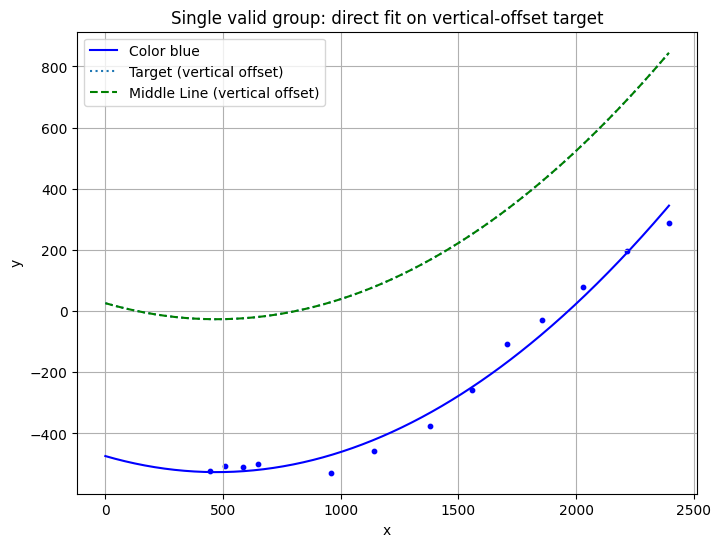

{'x_list': [345.57305908203125, 407.83050537109375, 482.91644287109375, 550.030029296875, 857.313232421875, 1928.7418212890625, 1040.536376953125, 2116.209716796875, 1277.73046875, 1455.8250732421875, 1604.436767578125, 2294.406494140625, 1752.894287109375], 'y_list': [-523.8873901367188, -507.81695556640625, -510.546142578125, -499.0834045410156, -528.4464111328125, 77.74407196044922, -456.9084167480469, 196.8220672607422, -375.0105285644531, -258.4990539550781, -108.74755859375, 289.3548889160156, -28.5352783203125], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


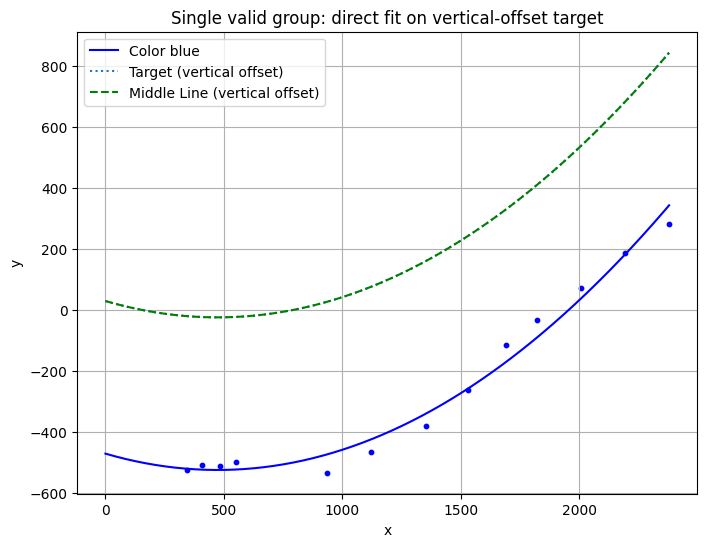

{'x_list': [245.57305908203125, 307.83050537109375, 382.91644287109375, 450.030029296875, 837.6235961914062, 1021.9600830078125, 2280.456298828125, 2094.326171875, 1252.7169189453125, 1908.703857421875, 1590.883544921875, 1429.2855224609375, 1723.5706787109375], 'y_list': [-523.8873901367188, -507.81695556640625, -510.546142578125, -499.0834045410156, -534.1607666015625, -466.1222839355469, 281.1744079589844, 186.6970977783203, -382.0071105957031, 71.33097839355469, -114.54560852050781, -263.388427734375, -33.3854866027832], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


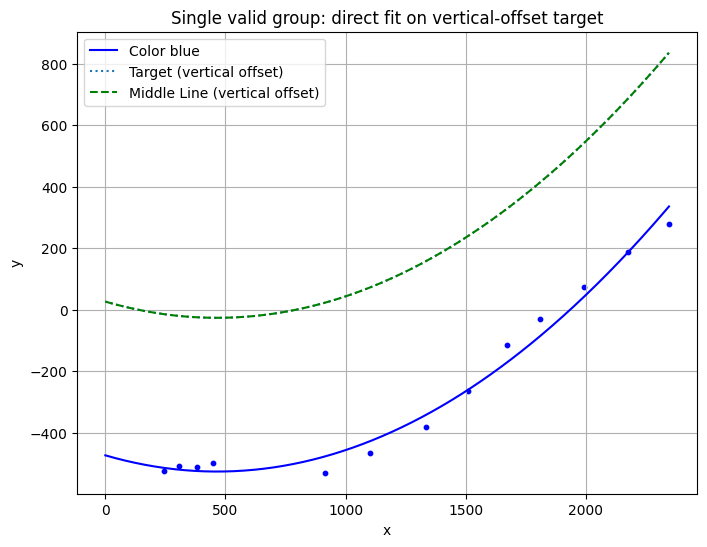

{'x_list': [145.57305908203125, 207.83050537109375, 282.91644287109375, 350.030029296875, 814.3438110351562, 1001.350341796875, 2246.09130859375, 1571.809326171875, 1235.84521484375, 1408.7537841796875, 2074.3828125, 1891.853271484375, 1708.9044189453125], 'y_list': [-523.8873901367188, -507.81695556640625, -510.546142578125, -499.0834045410156, -530.125, -465.1851501464844, 279.4497985839844, -114.99645233154297, -380.4212341308594, -263.0761413574219, 187.14593505859375, 72.67041778564453, -31.39664649963379], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


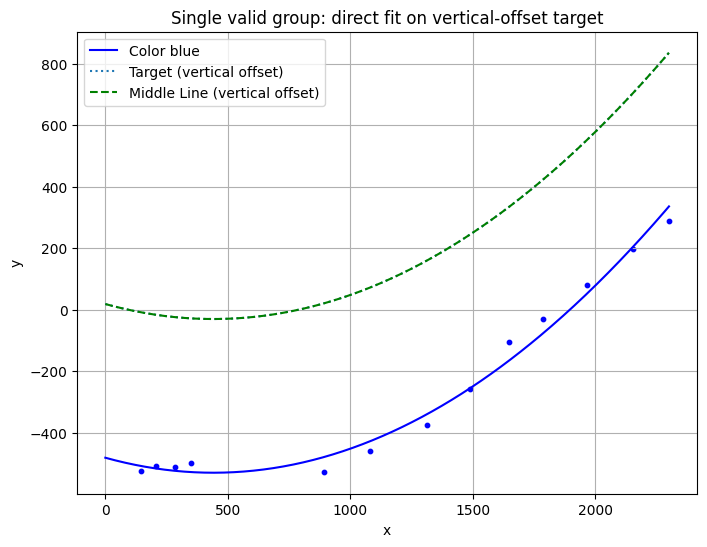

{'x_list': [45.57305908203125, 107.83050537109375, 182.91644287109375, 250.030029296875, 794.435546875, 981.3963623046875, 1388.178955078125, 1548.1717529296875, 1866.01708984375, 2054.78466796875, 1212.1905517578125, 2201.201416015625, 1687.303466796875], 'y_list': [-523.8873901367188, -507.81695556640625, -510.546142578125, -499.0834045410156, -528.1793823242188, -461.0312194824219, -256.9643249511719, -107.0611572265625, 79.3637466430664, 197.89401245117188, -375.5260314941406, 287.4649963378906, -29.330078125], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


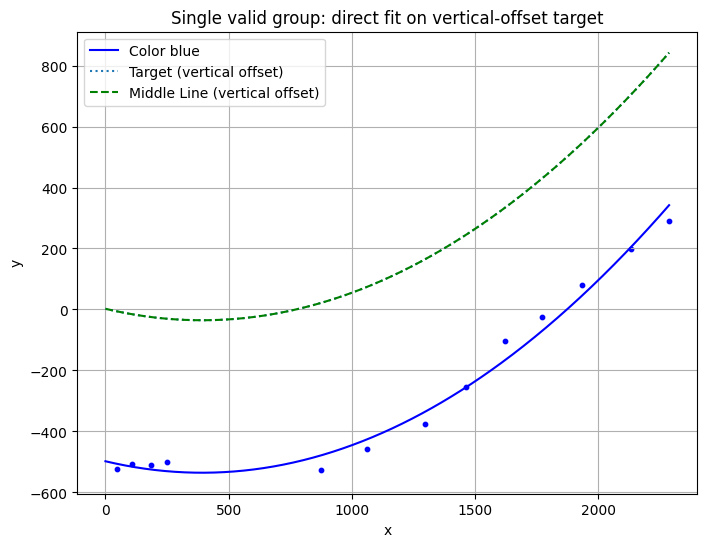

{'x_list': [-54.42694091796875, 7.83050537109375, 82.91644287109375, 150.030029296875, 962.0673828125, 776.588134765625, 1523.3883056640625, 1195.2493896484375, 1832.5108642578125, 1363.155517578125, 1671.8785400390625, 2033.226318359375, 2187.372314453125], 'y_list': [-523.8873901367188, -507.81695556640625, -510.546142578125, -499.0834045410156, -459.1379089355469, -525.5045776367188, -104.06636810302734, -374.05218505859375, 79.98377227783203, -254.5359649658203, -25.69329833984375, 198.23904418945312, 290.5149841308594], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


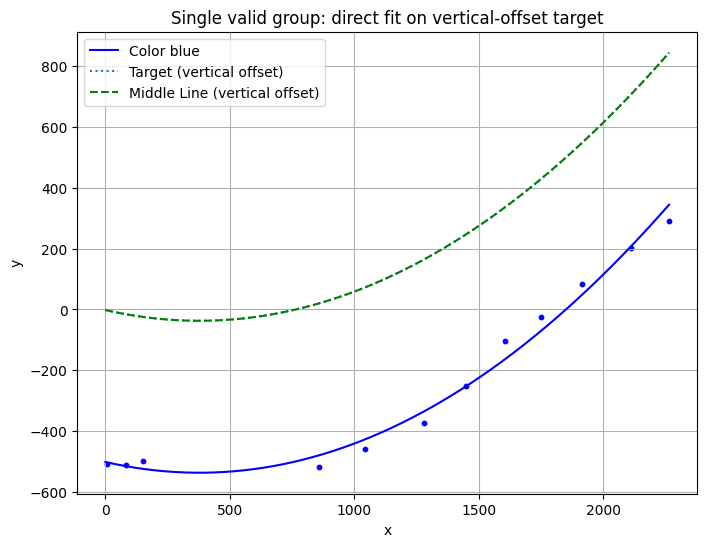

{'x_list': [-92.16949462890625, -17.08355712890625, 50.030029296875, 1816.1474609375, 943.727294921875, 1505.666015625, 1348.4990234375, 1179.614013671875, 1651.05712890625, 757.41748046875, 2012.794189453125, 2164.145751953125], 'y_list': [-507.81695556640625, -510.546142578125, -499.0834045410156, 83.0550765991211, -458.35186767578125, -103.04276275634766, -253.6805419921875, -372.609619140625, -23.724393844604492, -520.1919555664062, 202.63084411621094, 292.202880859375], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


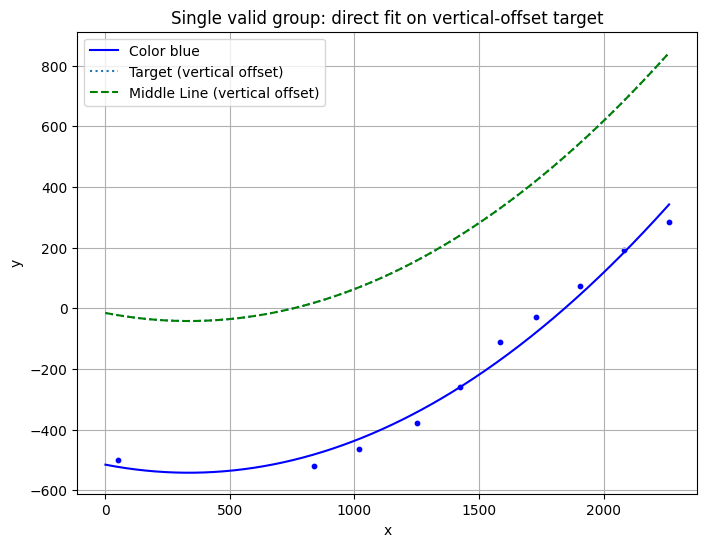

{'x_list': [-49.969970703125, 1806.6829833984375, 738.0692138671875, 918.5421142578125, 1150.7080078125, 1983.91357421875, 2163.3349609375, 1325.16748046875, 1482.571533203125, 1630.67578125], 'y_list': [-499.0834045410156, 71.7031478881836, -518.4523315429688, -462.8411560058594, -378.4722900390625, 192.07359313964844, 283.5450134277344, -261.1322937011719, -112.49617767333984, -30.18057632446289], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


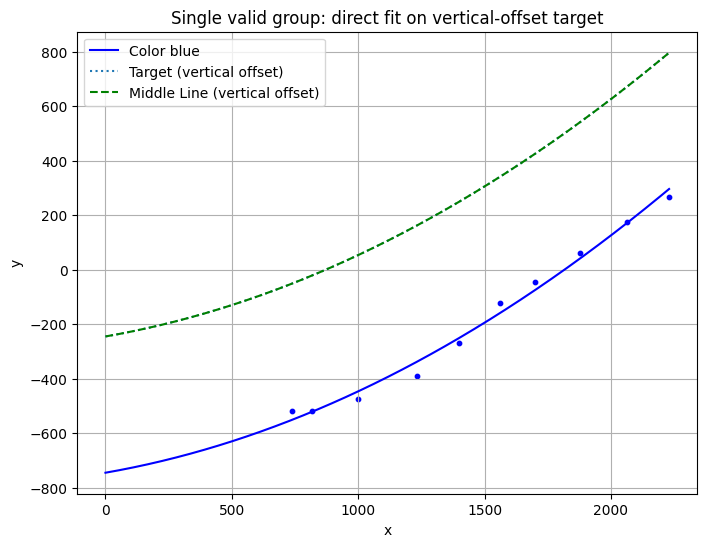

{'x_list': [638.0692138671875, 716.30859375, 1298.982666015625, 1776.3275146484375, 900.75341796875, 1132.3863525390625, 2130.486572265625, 1460.63720703125, 1965.061279296875, 1598.8817138671875], 'y_list': [-518.4523315429688, -517.6264038085938, -270.33990478515625, 61.5597038269043, -474.160400390625, -390.71380615234375, 266.9184265136719, -123.22932434082031, 176.58433532714844, -44.48763656616211], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


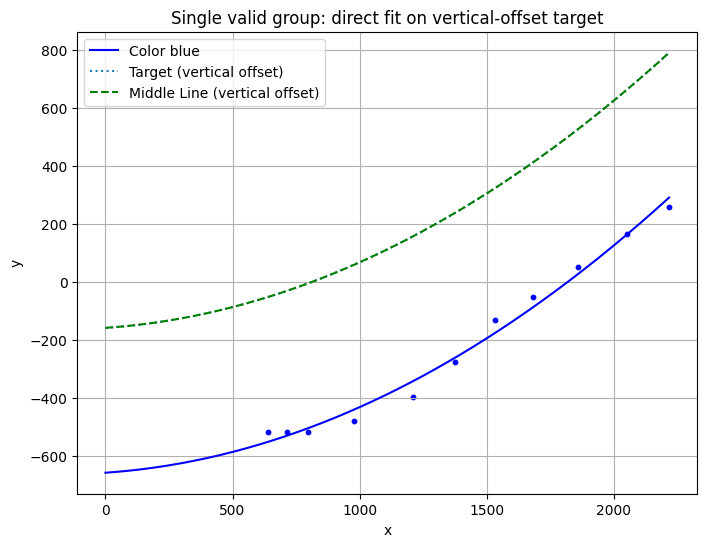

{'x_list': [538.0692138671875, 616.30859375, 876.9808959960938, 1275.5633544921875, 1111.4615478515625, 1758.8009033203125, 1953.53173828125, 1584.140625, 695.8120727539062, 1433.2943115234375, 2118.139892578125], 'y_list': [-518.4523315429688, -517.6264038085938, -480.14239501953125, -277.3221740722656, -396.8187255859375, 50.313621520996094, 165.97232055664062, -52.36370849609375, -518.7136840820312, -131.77377319335938, 257.22357177734375], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


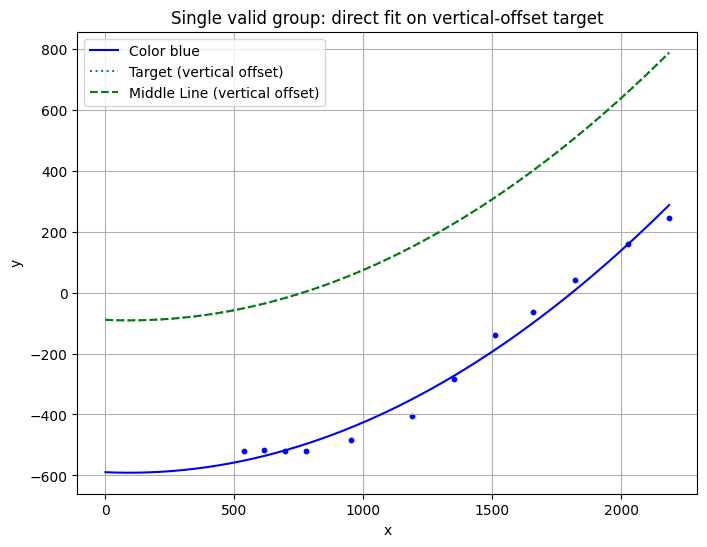

{'x_list': [438.0692138671875, 516.30859375, 595.8120727539062, 852.2373657226562, 1090.7176513671875, 1250.5162353515625, 1926.09033203125, 2086.468017578125, 1723.057373046875, 1412.0311279296875, 1558.885986328125, 676.697021484375], 'y_list': [-518.4523315429688, -517.6264038085938, -518.7136840820312, -484.89312744140625, -405.1104431152344, -283.3152770996094, 160.02854919433594, 245.43325805664062, 42.32733154296875, -139.00978088378906, -62.95293045043945, -518.8746948242188], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


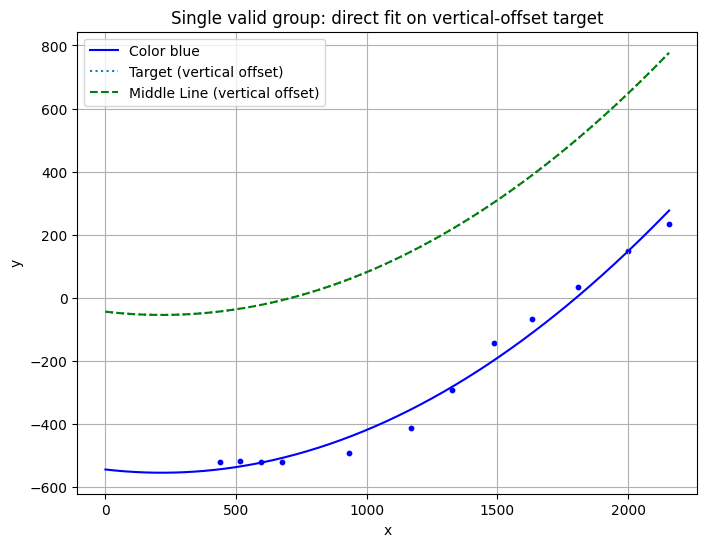

{'x_list': [338.0692138671875, 416.30859375, 495.81207275390625, 576.697021484375, 830.4257202148438, 1387.8203125, 1900.759765625, 1067.7218017578125, 1707.6849365234375, 1226.7847900390625, 2057.17333984375, 1530.6431884765625], 'y_list': [-518.4523315429688, -517.6264038085938, -518.7136840820312, -518.8746948242188, -491.3595886230469, -144.1653289794922, 148.44554138183594, -410.98388671875, 35.01341247558594, -290.41900634765625, 233.95054626464844, -68.25282287597656], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


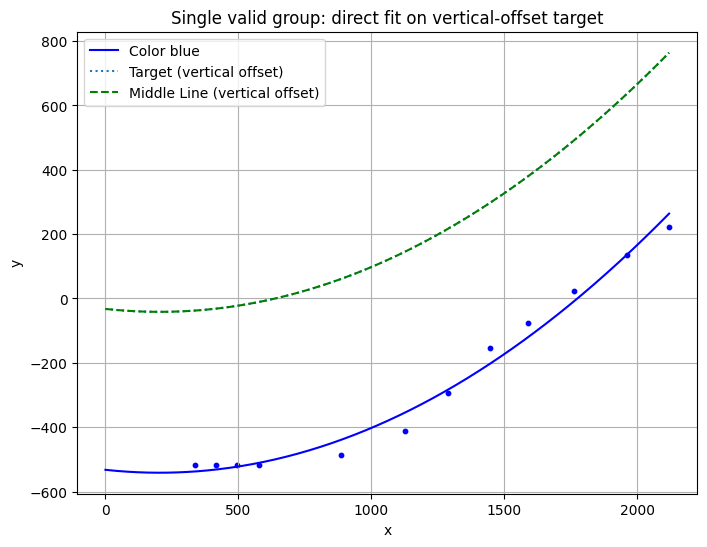

{'x_list': [238.0692138671875, 316.30859375, 395.81207275390625, 476.697021484375, 783.580078125, 1027.386962890625, 1661.0521240234375, 2018.77392578125, 1185.9630126953125, 1859.6463623046875, 1346.3753662109375, 1487.130615234375], 'y_list': [-518.4523315429688, -517.6264038085938, -518.7136840820312, -518.8746948242188, -485.2181701660156, -410.8902893066406, 22.187713623046875, 221.81150817871094, -293.3283996582031, 134.1625213623047, -153.05865478515625, -75.75630187988281], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


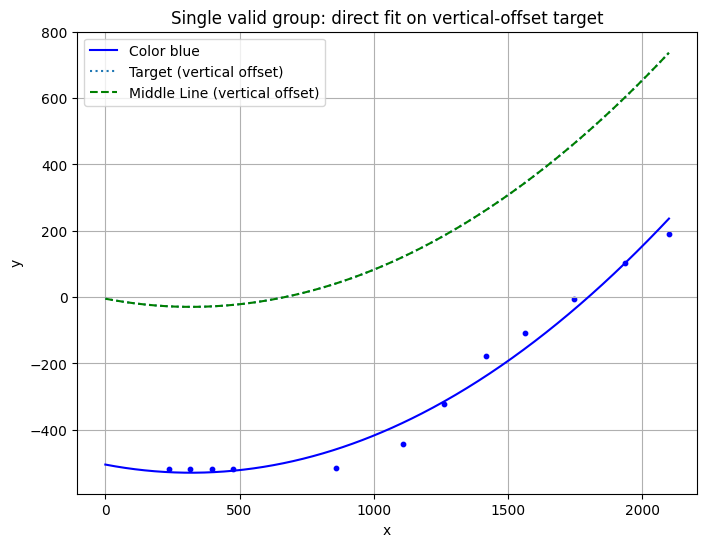

{'x_list': [138.0692138671875, 216.30859375, 295.81207275390625, 376.697021484375, 761.2039794921875, 1008.708740234375, 1318.9140625, 1647.248291015625, 1160.0634765625, 1835.192626953125, 1464.495849609375, 2000.062255859375], 'y_list': [-518.4523315429688, -517.6264038085938, -518.7136840820312, -518.8746948242188, -516.0119018554688, -441.77301025390625, -178.2203369140625, -6.778397560119629, -321.61016845703125, 102.70601654052734, -106.83580780029297, 189.6658935546875], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


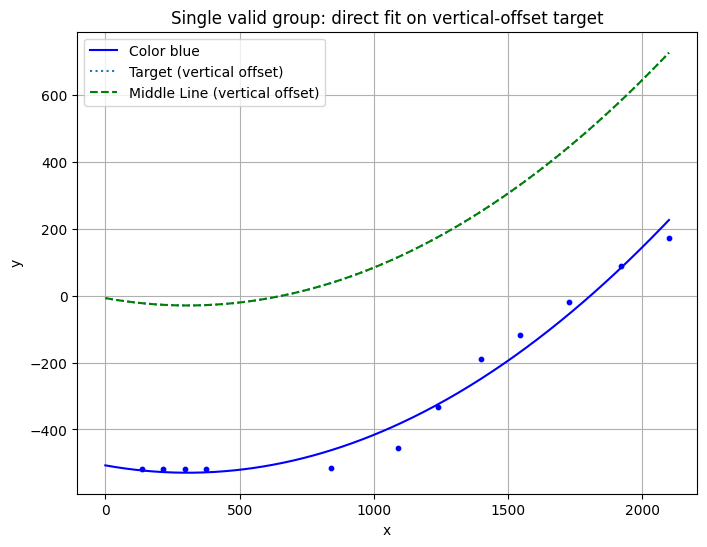

{'x_list': [38.0692138671875, 116.30859375, 195.81207275390625, 276.697021484375, 1628.1634521484375, 1139.658447265625, 991.77587890625, 1819.438720703125, 1444.127685546875, 741.674072265625, 1297.4404296875, 1999.306396484375], 'y_list': [-518.4523315429688, -517.6264038085938, -518.7136840820312, -518.8746948242188, -20.120386123657227, -332.59136962890625, -456.4783630371094, 88.93680572509766, -117.53871154785156, -514.346435546875, -189.3751678466797, 173.5241241455078], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


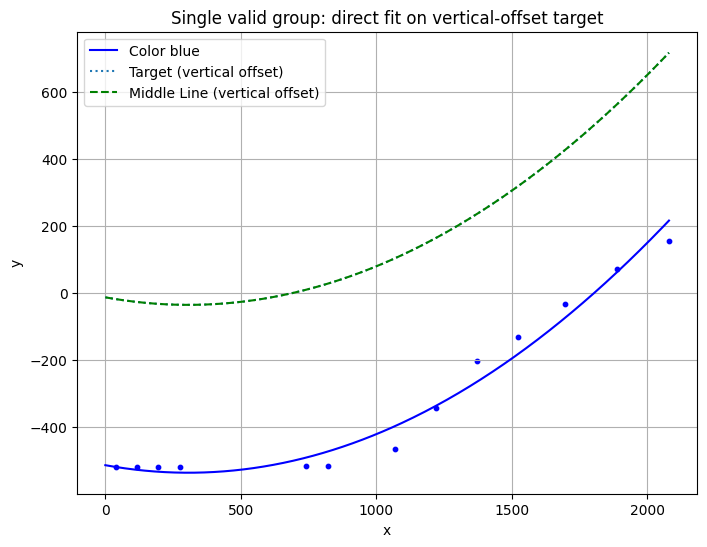

{'x_list': [-61.9307861328125, 16.30859375, 95.81207275390625, 176.697021484375, 641.674072265625, 722.9114379882812, 970.04638671875, 1271.66650390625, 1980.166259765625, 1118.5166015625, 1597.030029296875, 1788.6551513671875, 1423.1536865234375], 'y_list': [-518.4523315429688, -517.6264038085938, -518.7136840820312, -518.8746948242188, -514.346435546875, -514.4471435546875, -465.43341064453125, -200.99485778808594, 156.05979919433594, -343.23809814453125, -32.95380401611328, 71.15370178222656, -129.4621124267578], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


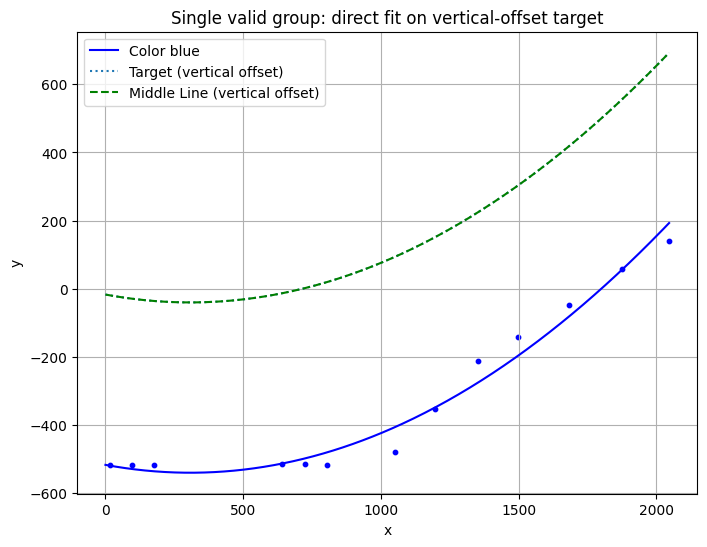

{'x_list': [-83.69140625, -4.18792724609375, 76.697021484375, 541.674072265625, 622.9114379882812, 949.4835205078125, 703.4698486328125, 1945.7833251953125, 1096.3560791015625, 1584.140625, 1251.5126953125, 1773.6143798828125, 1399.1717529296875], 'y_list': [-517.6264038085938, -518.7136840820312, -518.8746948242188, -514.346435546875, -514.4471435546875, -478.2940979003906, -518.0999145507812, 139.7064208984375, -352.6838073730469, -49.09097671508789, -212.8189697265625, 57.93854904174805, -142.12216186523438], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


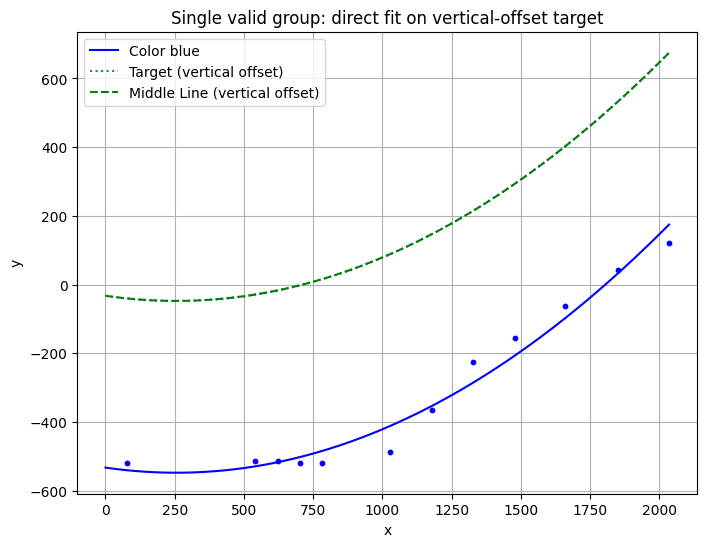

{'x_list': [-23.302978515625, 441.674072265625, 522.9114379882812, 603.4698486328125, 927.01123046875, 1080.3045654296875, 1559.4906005859375, 1379.318115234375, 1750.4715576171875, 1935.162109375, 1228.2550048828125, 680.195068359375], 'y_list': [-518.8746948242188, -514.346435546875, -514.4471435546875, -518.0999145507812, -487.5694885253906, -365.9333190917969, -62.95293045043945, -154.86785888671875, 41.17367172241211, 121.49510955810547, -223.7011260986328, -518.1259765625], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


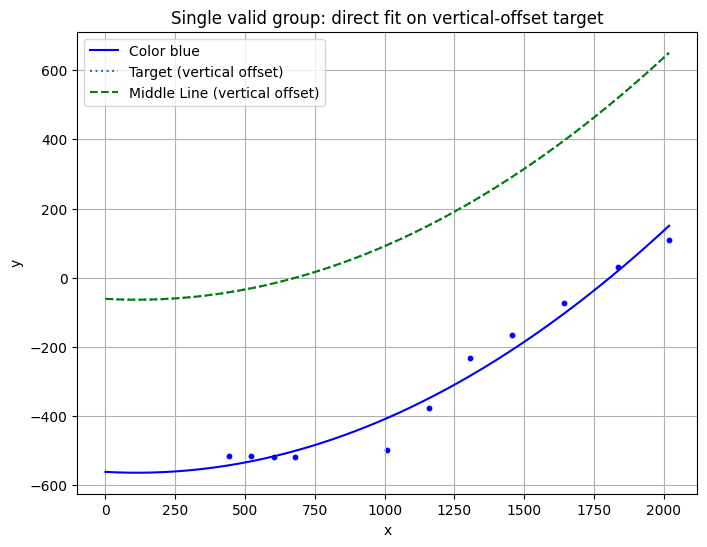

{'x_list': [341.674072265625, 422.91143798828125, 503.4698486328125, 580.195068359375, 1058.139892578125, 1542.185791015625, 907.1685180664062, 1735.99658203125, 1205.269287109375, 1918.548583984375, 1355.5703125], 'y_list': [-514.346435546875, -514.4471435546875, -518.0999145507812, -518.1259765625, -375.87286376953125, -73.50467681884766, -497.54962158203125, 30.205602645874023, -231.6563262939453, 108.8416976928711, -165.3807373046875], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


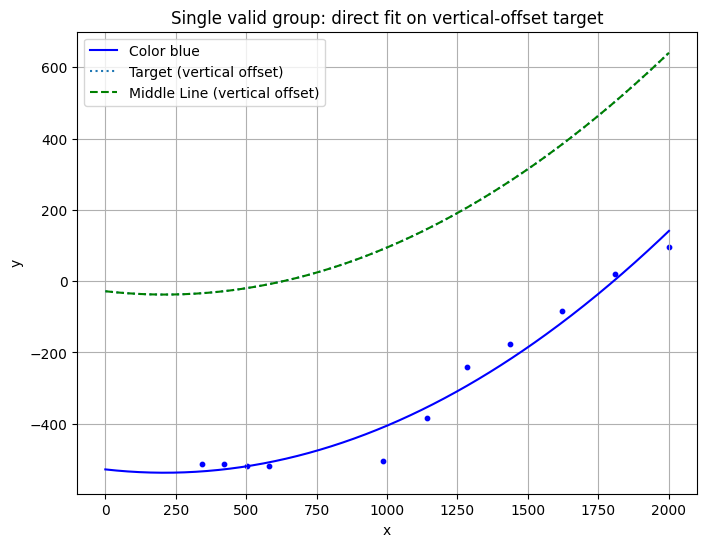

{'x_list': [241.674072265625, 322.91143798828125, 403.4698486328125, 480.195068359375, 887.04345703125, 1041.1297607421875, 1520.43505859375, 1708.3406982421875, 1901.48193359375, 1183.49169921875, 1338.3447265625], 'y_list': [-514.346435546875, -514.4471435546875, -518.0999145507812, -518.1259765625, -504.1344909667969, -382.99163818359375, -85.14521789550781, 19.25737953186035, 94.46534729003906, -240.62413024902344, -176.10299682617188], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


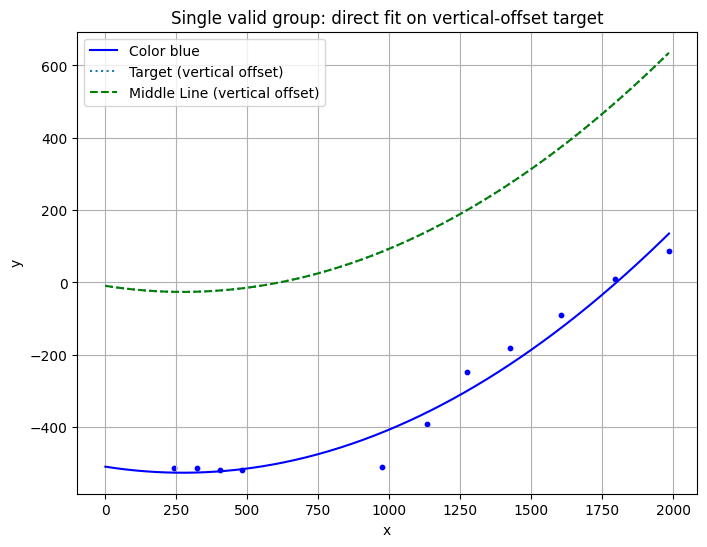

{'x_list': [141.674072265625, 222.91143798828125, 303.4698486328125, 380.195068359375, 874.04345703125, 1695.792236328125, 1032.1719970703125, 1172.8614501953125, 1503.9114990234375, 1885.40576171875, 1325.16748046875], 'y_list': [-514.346435546875, -514.4471435546875, -518.0999145507812, -518.1259765625, -509.7025451660156, 10.427352905273438, -390.42449951171875, -247.5143585205078, -90.552734375, 87.96945190429688, -181.53582763671875], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


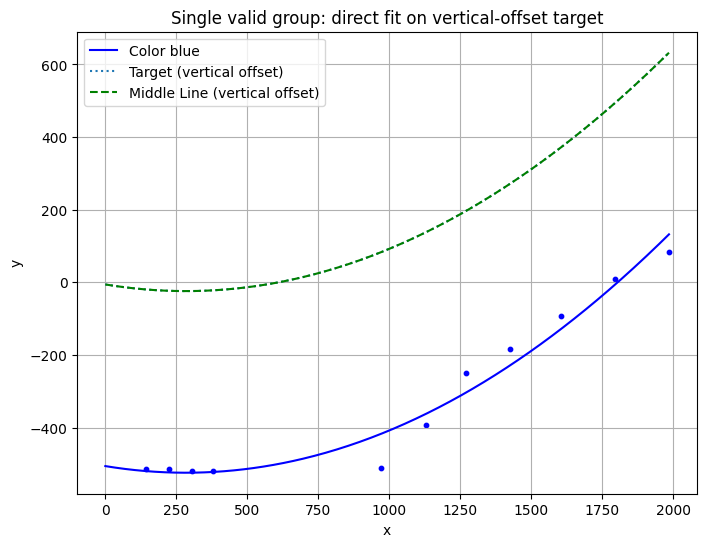

{'x_list': [41.674072265625, 122.91143798828125, 203.4698486328125, 280.195068359375, 871.2938232421875, 1695.792236328125, 1884.689453125, 1503.9114990234375, 1029.07373046875, 1169.5118408203125, 1324.6444091796875], 'y_list': [-514.346435546875, -514.4471435546875, -518.0999145507812, -518.1259765625, -510.6171569824219, 8.689460754394531, 84.14469909667969, -93.67524719238281, -391.7529296875, -249.36924743652344, -184.3286895751953], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


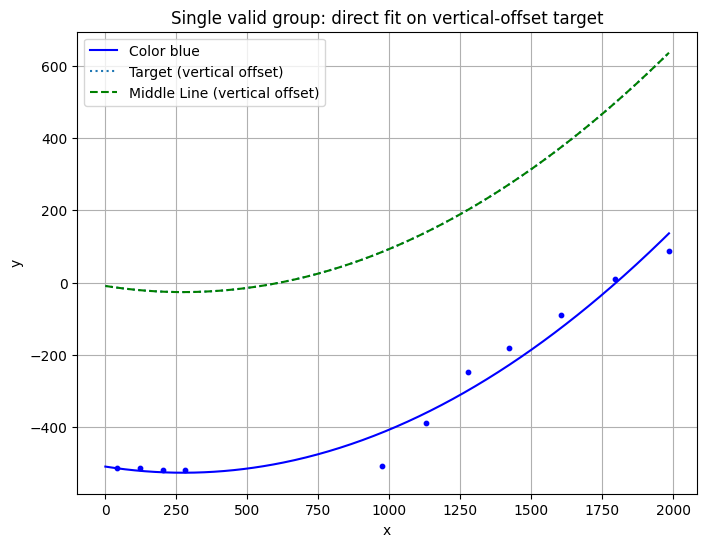

{'x_list': [-58.325927734375, 22.91143798828125, 103.4698486328125, 180.195068359375, 873.6741333007812, 1695.1412353515625, 1029.4954833984375, 1176.2288818359375, 1884.689453125, 1503.32666015625, 1320.4788818359375], 'y_list': [-514.346435546875, -514.4471435546875, -518.0999145507812, -518.1259765625, -508.7166442871094, 10.427352905273438, -388.375732421875, -248.16917419433594, 87.96945190429688, -90.552734375, -181.00503540039062], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


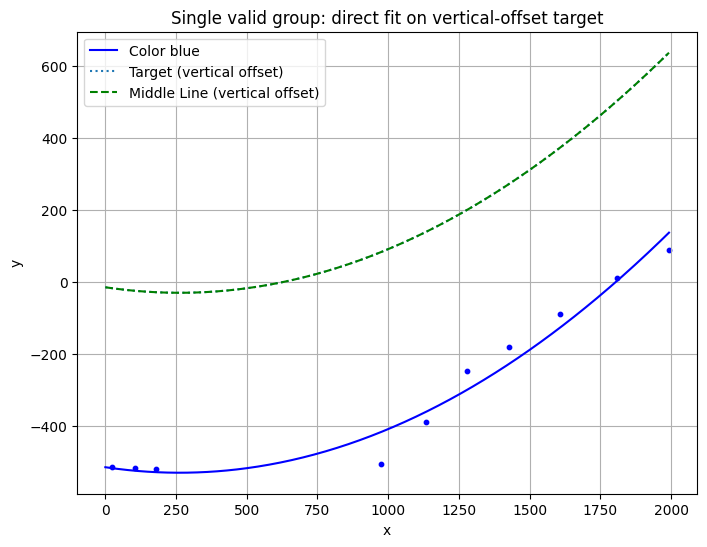

{'x_list': [-77.08856201171875, 3.4698486328125, 80.195068359375, 876.0642700195312, 1034.861328125, 1179.140869140625, 1892.6922607421875, 1708.3406982421875, 1509.1875, 1328.8345947265625], 'y_list': [-514.4471435546875, -518.0999145507812, -518.1259765625, -505.82037353515625, -387.9586181640625, -247.56436157226562, 90.24425506591797, 12.254694938659668, -89.28421783447266, -179.26869201660156], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


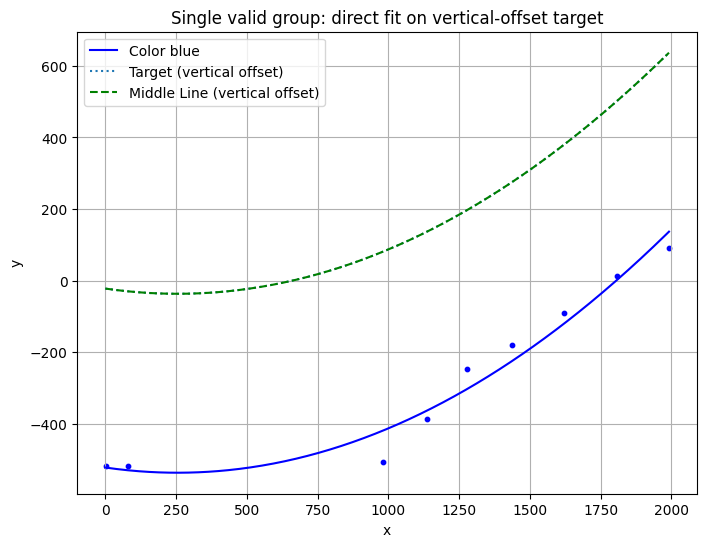

{'x_list': [-96.5301513671875, -19.804931640625, 880.1312255859375, 1707.6849365234375, 1037.5633544921875, 1179.140869140625, 1891.972900390625, 1519.253662109375, 1337.2891845703125], 'y_list': [-518.0999145507812, -518.1259765625, -506.9359436035156, 12.254694938659668, -387.74859619140625, -246.30126953125, 90.24425506591797, -89.87550354003906, -180.32945251464844], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1]}


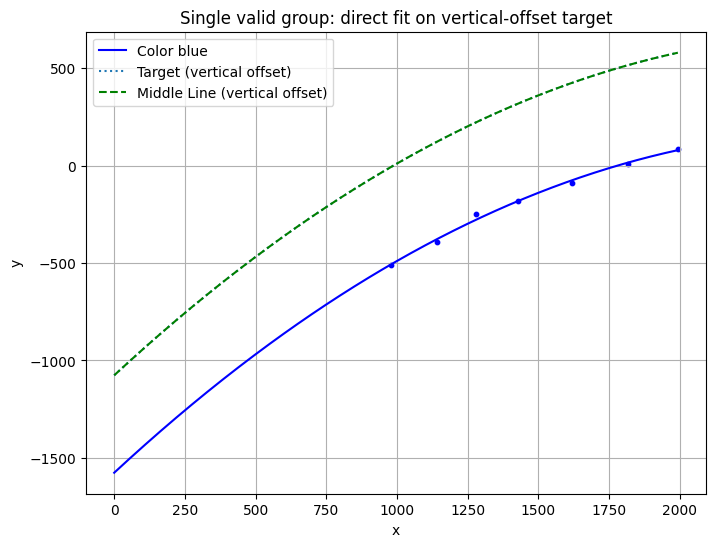

{'x_list': [880.1312255859375, 1715.013671875, 1040.2783203125, 1179.614013671875, 1892.6922607421875, 1519.253662109375, 1328.8345947265625], 'y_list': [-508.9200134277344, 10.54278564453125, -390.94696044921875, -248.8274383544922, 86.4040756225586, -91.45226287841797, -180.6692352294922], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


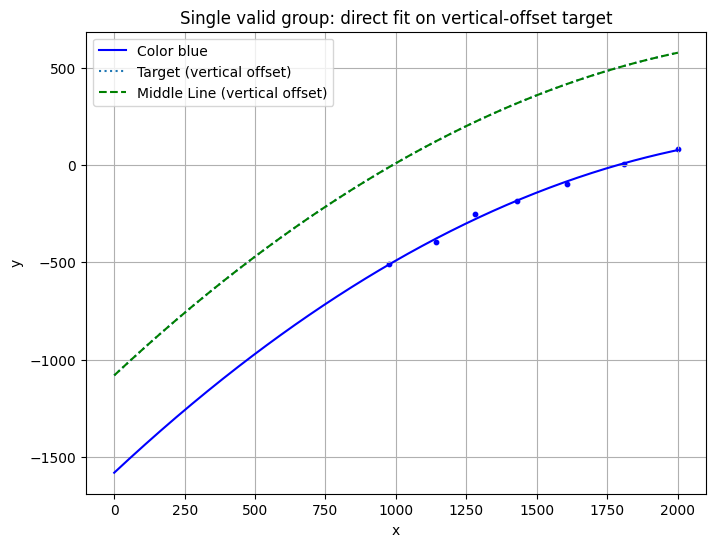

{'x_list': [876.434326171875, 1900.759765625, 1508.6007080078125, 1708.3406982421875, 1179.614013671875, 1040.7039794921875, 1328.8345947265625], 'y_list': [-510.760009765625, 80.97029876708984, -95.54977416992188, 5.252012252807617, -252.61668395996094, -395.49285888671875, -184.87083435058594], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


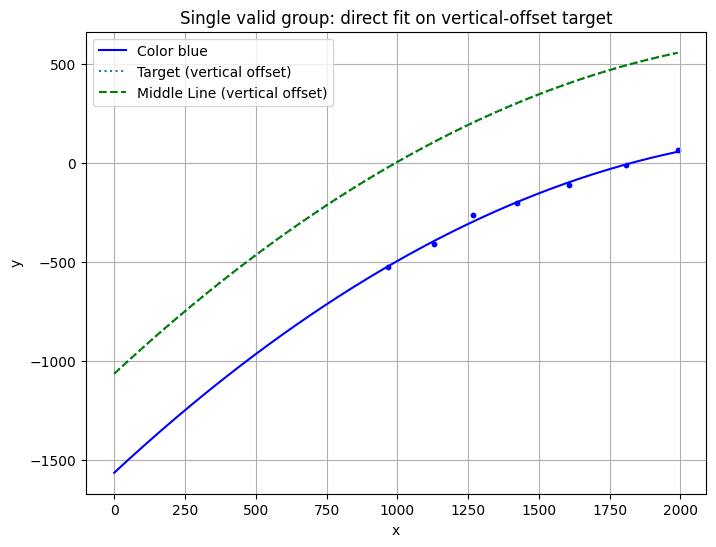

{'x_list': [868.92333984375, 1707.0291748046875, 1031.32666015625, 1507.4271240234375, 1168.572998046875, 1323.59814453125, 1891.253662109375], 'y_list': [-525.2734375, -14.005366325378418, -408.4787902832031, -112.7800521850586, -265.6596984863281, -202.48226928710938, 61.442901611328125], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


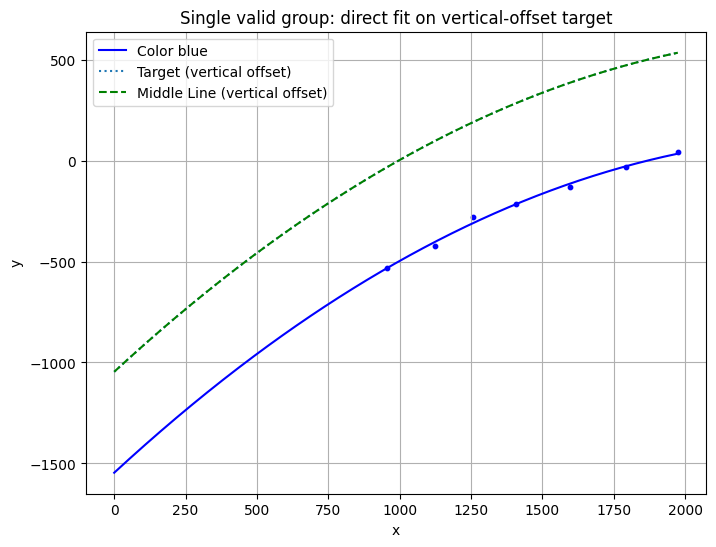

{'x_list': [854.4127197265625, 1496.921142578125, 1693.1881103515625, 1022.5013427734375, 1158.170654296875, 1874.6099853515625, 1307.0927734375], 'y_list': [-534.2534790039062, -129.16061401367188, -31.282058715820312, -421.2814025878906, -279.7416687011719, 39.999324798583984, -215.31729125976562], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


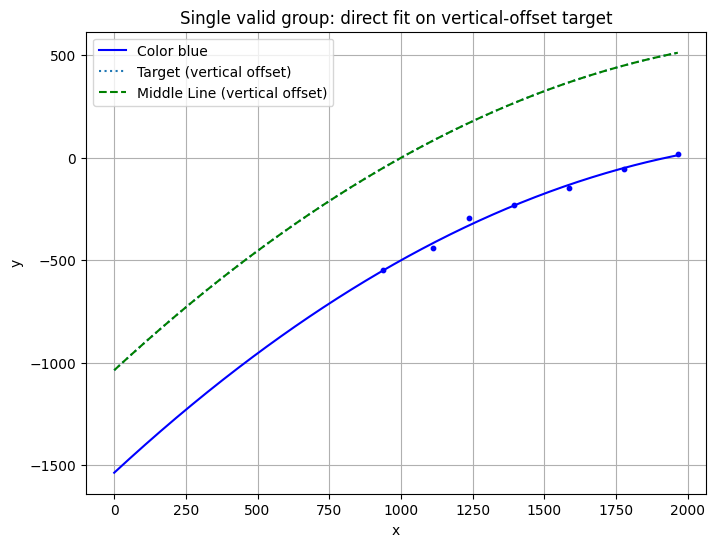

{'x_list': [839.23681640625, 1013.383056640625, 1137.388671875, 1485.3931884765625, 1866.0323486328125, 1679.5477294921875, 1293.9373779296875], 'y_list': [-548.707275390625, -439.4674987792969, -293.7886657714844, -149.966552734375, 18.971410751342773, -53.48426055908203, -231.24954223632812], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


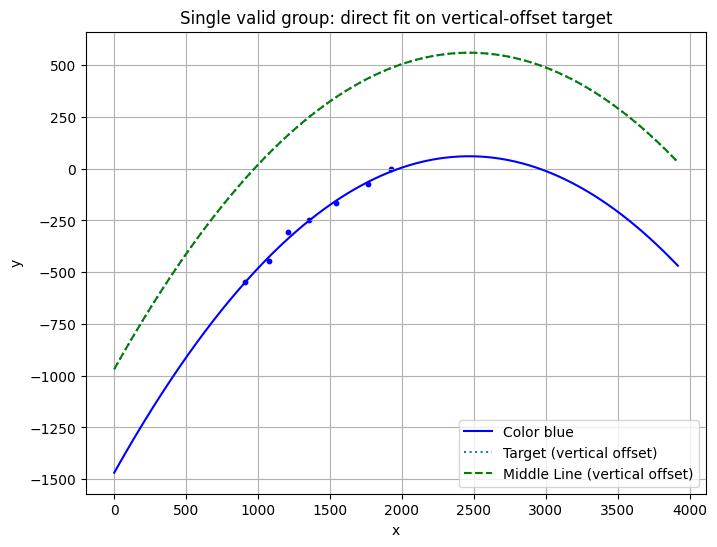

{'x_list': [1665.4619140625, 978.13525390625, 1442.9986572265625, 809.0508422851562, 1825.54296875, 1107.1666259765625, 1256.2978515625], 'y_list': [-75.36701202392578, -448.10821533203125, -165.75973510742188, -548.443603515625, -3.7201755046844482, -306.2882385253906, -246.76123046875], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


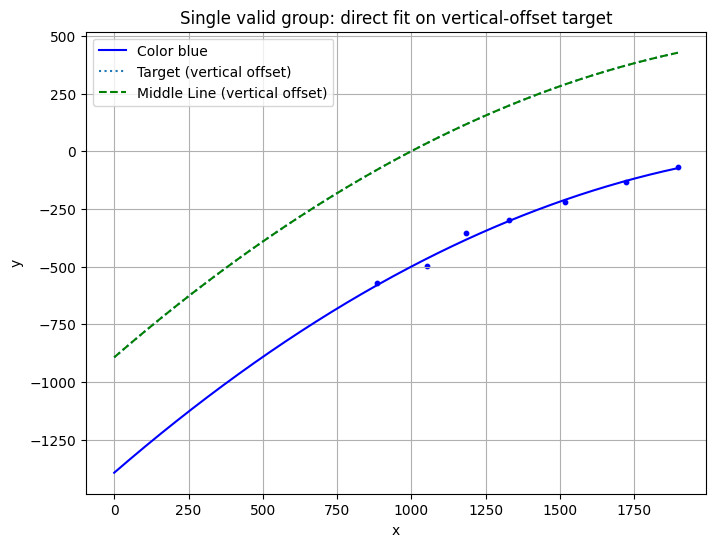

{'x_list': [1418.4085693359375, 1621.4737548828125, 953.4012451171875, 1228.7449951171875, 1796.605224609375, 1084.5401611328125, 783.1417846679688], 'y_list': [-219.5482940673828, -131.9944305419922, -498.404296875, -295.6517639160156, -69.59590148925781, -353.9035339355469, -572.150146484375], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


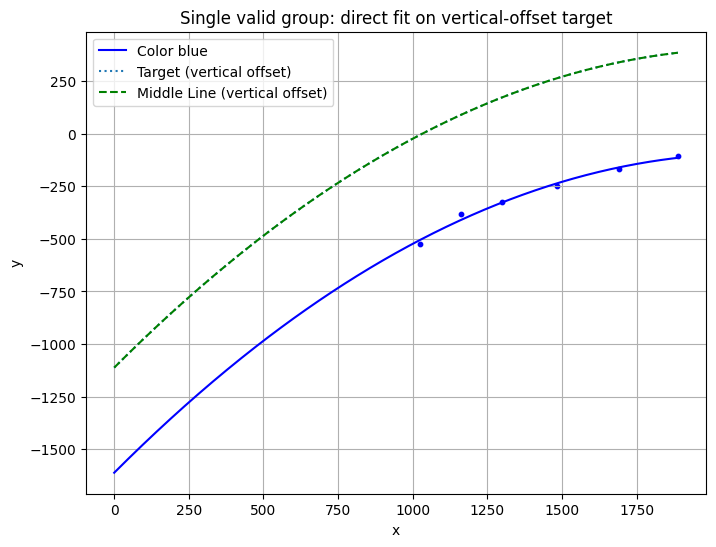

{'x_list': [925.5572509765625, 1590.56298828125, 1061.816650390625, 1384.3720703125, 1787.9716796875, 1198.7313232421875], 'y_list': [-522.6644287109375, -165.8428497314453, -381.4082946777344, -249.7054443359375, -107.64277648925781, -322.5752258300781], 'c_list': [1, 1, 1, 1, 1, 1]}


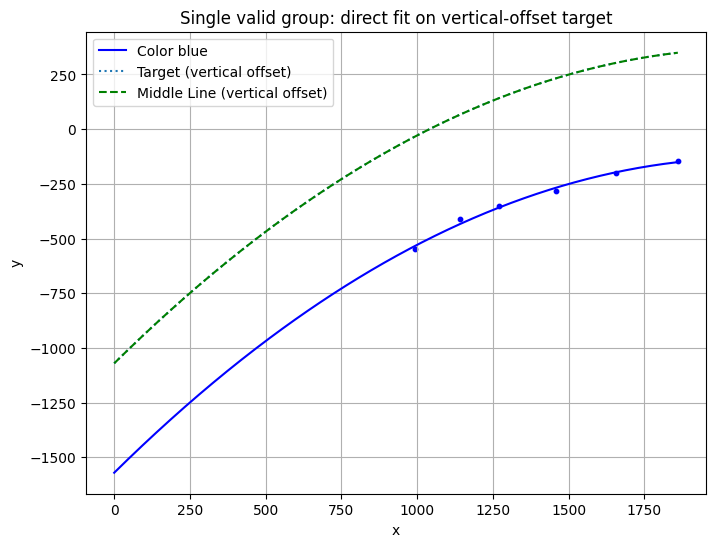

{'x_list': [1357.172607421875, 1041.555419921875, 893.0771484375, 1556.2947998046875, 1170.45068359375, 1760.1470947265625], 'y_list': [-282.2878112792969, -412.5399475097656, -547.3592529296875, -201.09056091308594, -352.1243896484375, -145.55010986328125], 'c_list': [1, 1, 1, 1, 1, 1]}


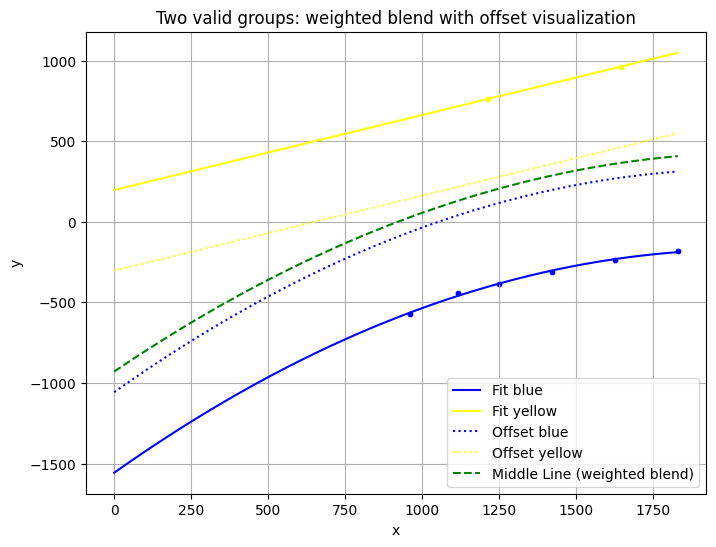

{'x_list': [1545.1129150390625, 1527.5963134765625, 861.7271728515625, 1015.4669189453125, 1148.854248046875, 1322.0435791015625, 1731.1607666015625, 1116.0042724609375], 'y_list': [962.0830078125, -235.7182159423828, -574.5350952148438, -440.5800476074219, -383.65997314453125, -311.8855895996094, -184.1002960205078, 762.3790893554688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


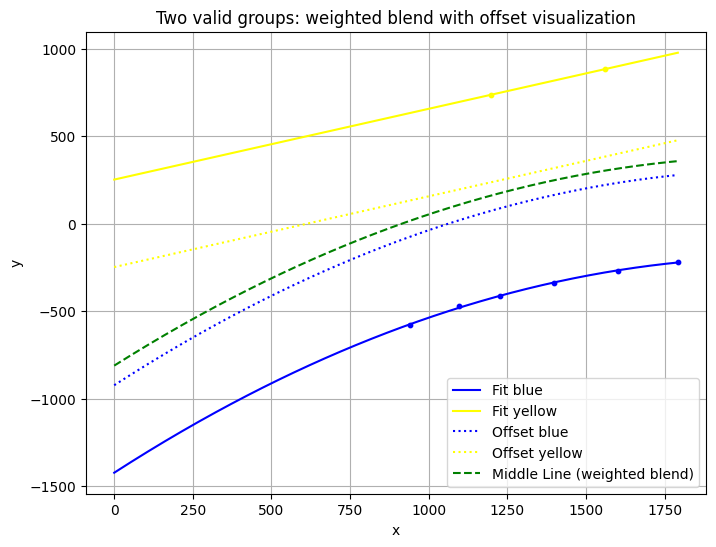

{'x_list': [1461.3546142578125, 839.9517822265625, 995.8765869140625, 1501.001708984375, 1125.7022705078125, 1691.856689453125, 1297.5255126953125, 1097.4351806640625], 'y_list': [884.7777709960938, -580.1982421875, -468.519775390625, -267.65814208984375, -410.7528381347656, -218.1781463623047, -340.7167663574219, 737.5458374023438], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


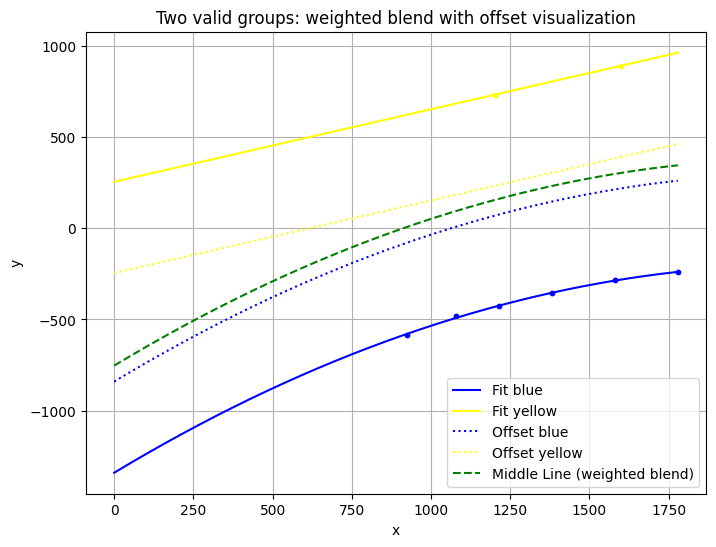

{'x_list': [823.13232421875, 1498.01416015625, 979.753173828125, 1480.3436279296875, 1678.9190673828125, 1280.6309814453125, 1115.5157470703125, 1101.788330078125], 'y_list': [-582.7341918945312, 891.0741577148438, -482.6611022949219, -284.1734313964844, -238.9507598876953, -357.1368408203125, -426.8807067871094, 733.416748046875], 'c_list': [1, 0, 1, 1, 1, 1, 1, 0]}


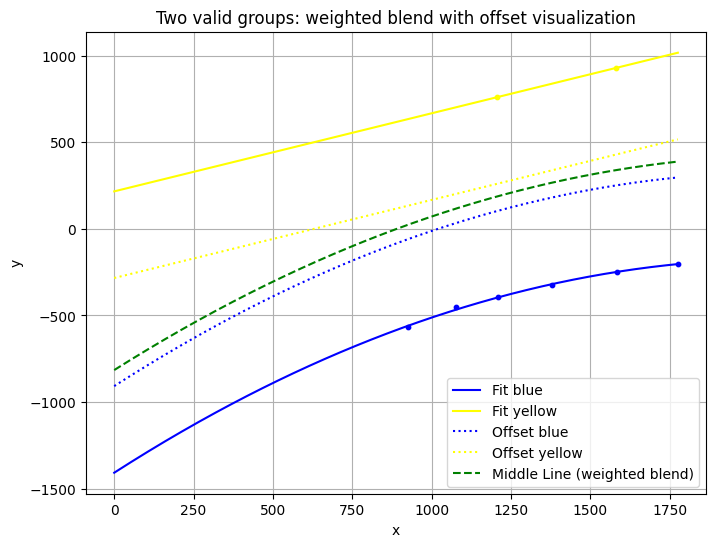

{'x_list': [1482.645263671875, 824.064697265625, 1481.260498046875, 975.6837158203125, 1675.0867919921875, 1278.7412109375, 1107.7177734375, 1105.044921875], 'y_list': [-251.9158935546875, -568.2256469726562, 929.0986328125, -453.60943603515625, -200.40773010253906, -325.09906005859375, -396.2220153808594, 759.4808959960938], 'c_list': [1, 1, 0, 1, 1, 1, 1, 0]}


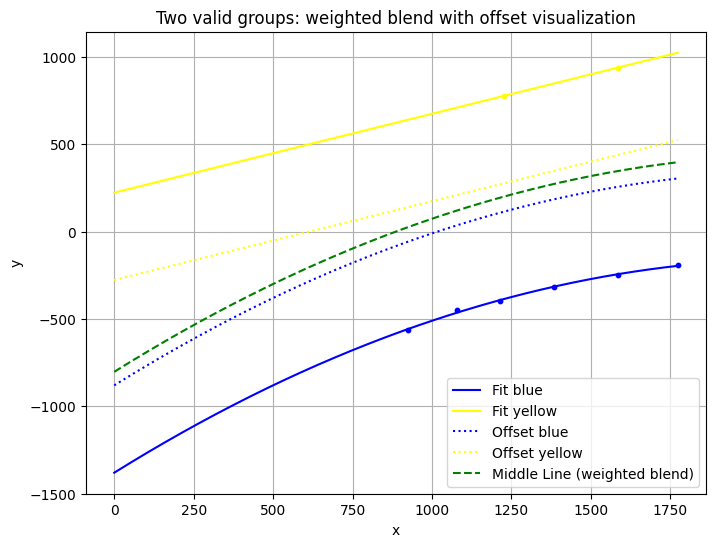

{'x_list': [1485.84521484375, 825.185791015625, 980.15771484375, 1485.4580078125, 1285.0726318359375, 1112.9033203125, 1673.803466796875, 1125.40625], 'y_list': [938.3595581054688, -565.5843505859375, -448.10821533203125, -246.5669708251953, -320.16827392578125, -395.8191833496094, -193.55618286132812, 775.6373901367188], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


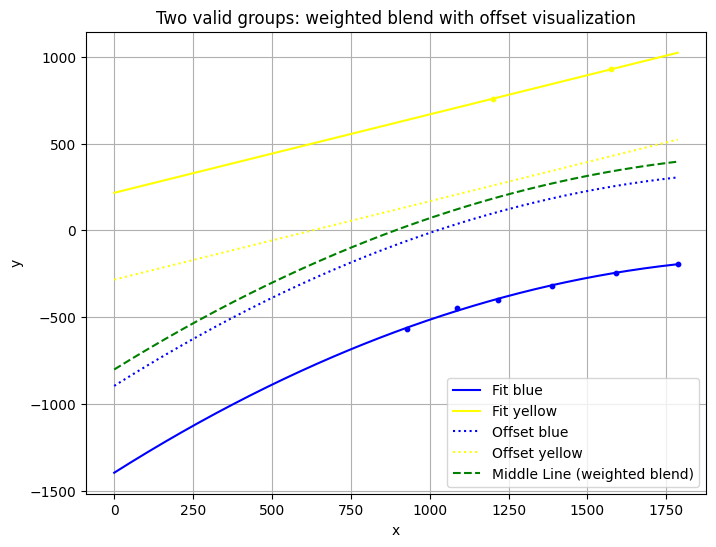

{'x_list': [1475.5474853515625, 829.2110595703125, 985.4849853515625, 1491.763916015625, 1289.030029296875, 1116.4166259765625, 1686.6571044921875, 1101.551513671875], 'y_list': [927.6281127929688, -566.8838500976562, -447.9803161621094, -244.27542114257812, -319.7225036621094, -399.22369384765625, -193.2334747314453, 758.7655029296875], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


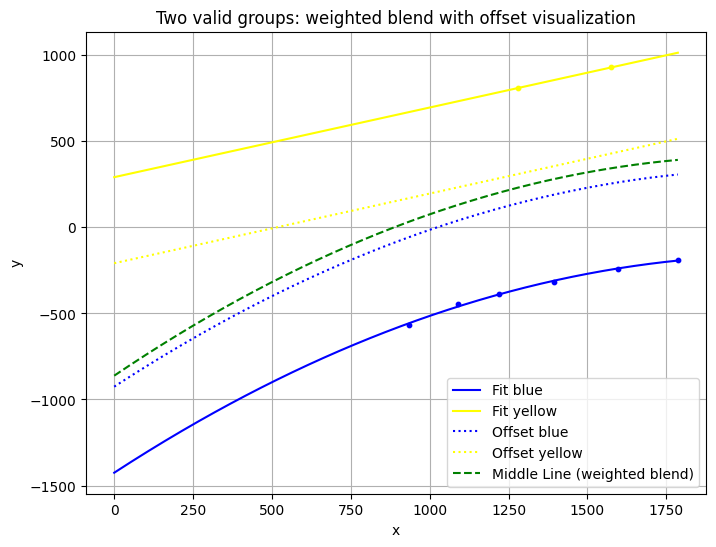

{'x_list': [1475.5474853515625, 833.2684326171875, 990.452880859375, 1496.3677978515625, 1293.5211181640625, 1119.0445556640625, 1686.6571044921875, 1178.5914306640625], 'y_list': [929.1742553710938, -565.3480834960938, -446.7615661621094, -241.9689178466797, -316.5453796386719, -389.3846130371094, -189.7828826904297, 808.9981689453125], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


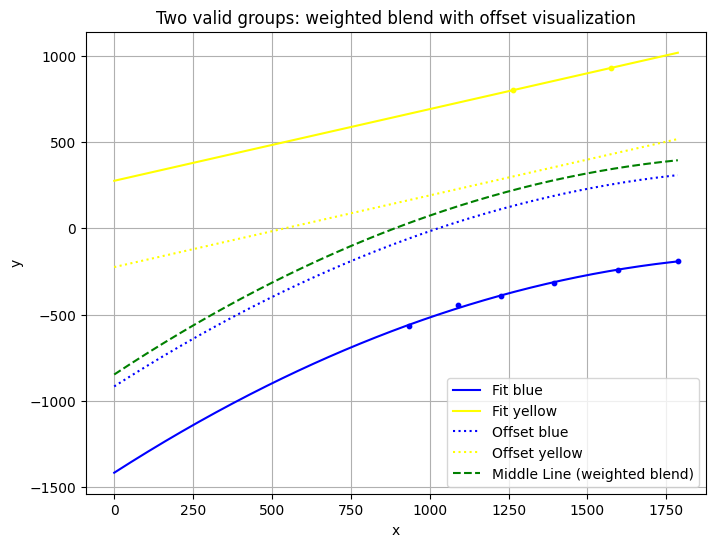

{'x_list': [1475.5474853515625, 835.4873046875, 990.452880859375, 1496.94873046875, 1293.5211181640625, 1125.7022705078125, 1686.6571044921875, 1165.4638671875], 'y_list': [929.1742553710938, -566.4765014648438, -446.7615661621094, -241.9689178466797, -316.5453796386719, -393.7895812988281, -189.7828826904297, 800.3917846679688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


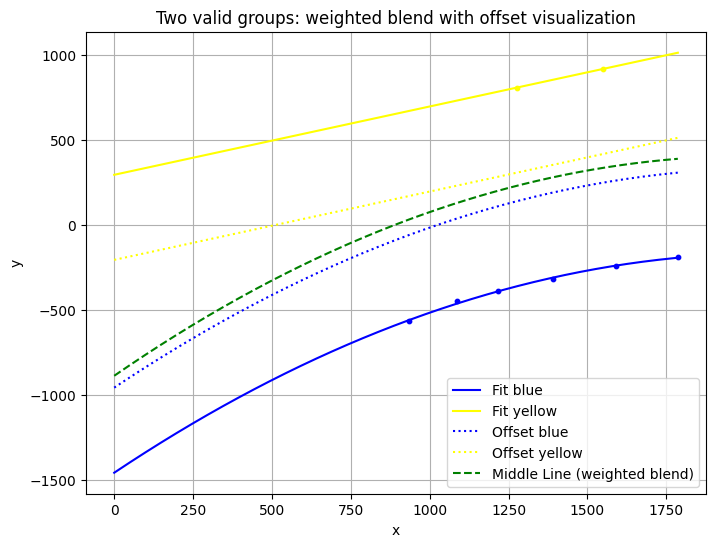

{'x_list': [1450.94873046875, 835.1312866210938, 987.9632568359375, 1491.763916015625, 1289.5396728515625, 1116.4166259765625, 1686.6571044921875, 1175.641845703125], 'y_list': [917.3738403320312, -567.427001953125, -445.7415466308594, -241.18333435058594, -317.0014343261719, -390.8063049316406, -189.7828826904297, 806.8292846679688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


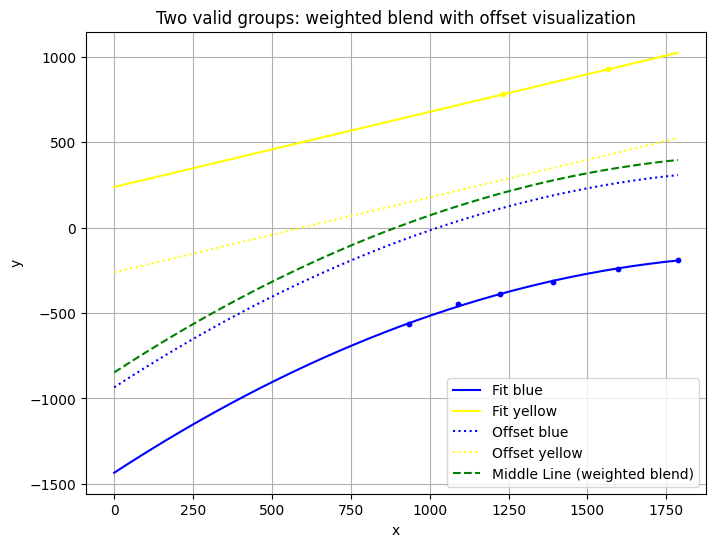

{'x_list': [1465.9580078125, 835.4873046875, 990.452880859375, 1496.94873046875, 1289.5396728515625, 1122.59130859375, 1686.6571044921875, 1132.6798095703125], 'y_list': [926.2516479492188, -566.4765014648438, -446.7615661621094, -241.9689178466797, -317.0014343261719, -391.5815124511719, -189.7828826904297, 779.65625], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


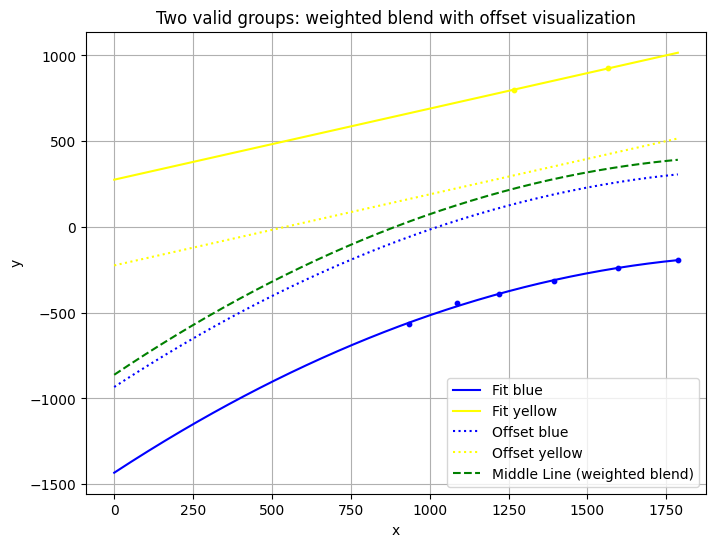

{'x_list': [1465.9580078125, 835.4873046875, 987.9632568359375, 1496.94873046875, 1293.5211181640625, 1119.49609375, 1686.6571044921875, 1165.938232421875], 'y_list': [924.7156372070312, -566.4765014648438, -445.7415466308594, -241.9689178466797, -317.9097595214844, -389.3846130371094, -189.7828826904297, 800.3917846679688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


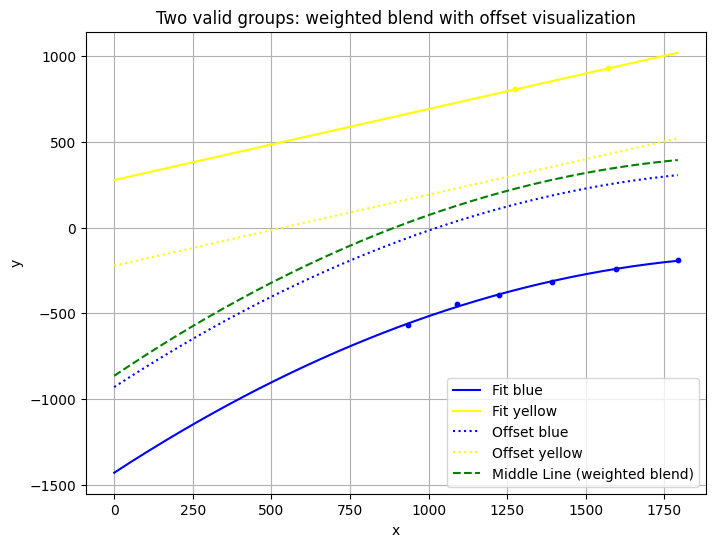

{'x_list': [1471.02587890625, 835.4873046875, 990.452880859375, 1496.94873046875, 1293.5211181640625, 1122.59130859375, 1693.154052734375, 1175.641845703125], 'y_list': [929.2493286132812, -566.4765014648438, -446.7615661621094, -241.9689178466797, -317.9097595214844, -391.5815124511719, -190.47299194335938, 806.8292846679688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


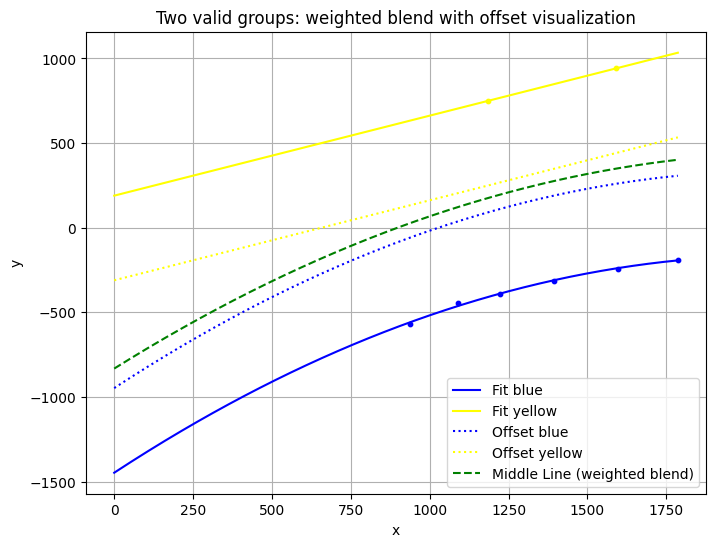

{'x_list': [1491.6295166015625, 837.0015258789062, 990.452880859375, 1496.94873046875, 1293.5211181640625, 1122.59130859375, 1686.6571044921875, 1083.617919921875], 'y_list': [941.4361572265625, -567.6094970703125, -446.7615661621094, -241.9689178466797, -316.5453796386719, -390.3728942871094, -189.7828826904297, 748.6251831054688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


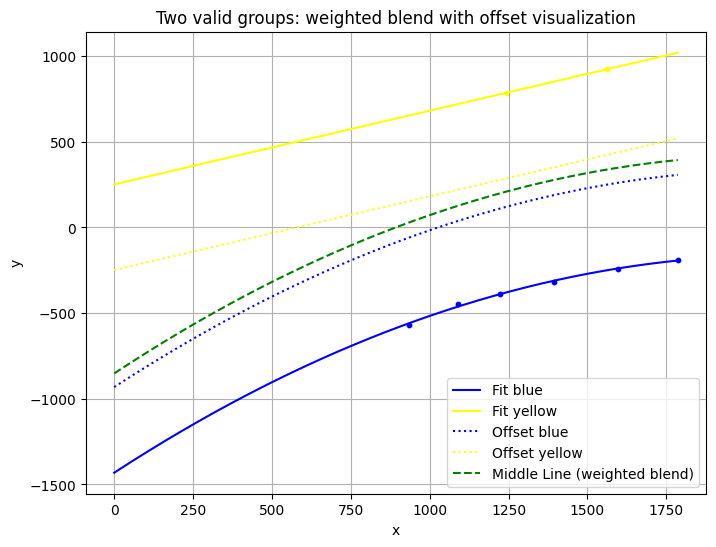

{'x_list': [1460.9228515625, 835.1312866210938, 990.452880859375, 1496.94873046875, 1293.5211181640625, 1122.59130859375, 1686.6571044921875, 1146.054443359375], 'y_list': [923.2734375, -566.4765014648438, -446.7615661621094, -241.9689178466797, -316.5453796386719, -390.3728942871094, -189.7828826904297, 787.8202514648438], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


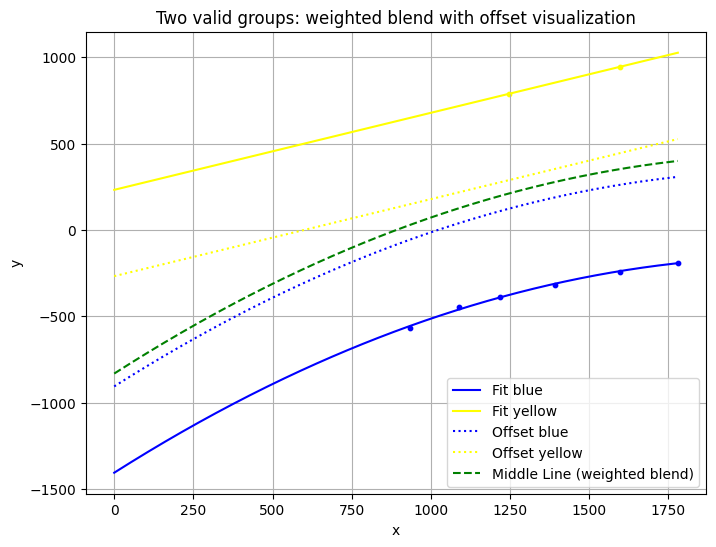

{'x_list': [1496.8651123046875, 833.623779296875, 987.9632568359375, 1293.5211181640625, 1496.94873046875, 1119.49609375, 1680.20703125, 1145.5875244140625], 'y_list': [944.5330200195312, -565.3480834960938, -445.7415466308594, -317.9097595214844, -241.9689178466797, -390.5901794433594, -189.0977325439453, 787.8202514648438], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


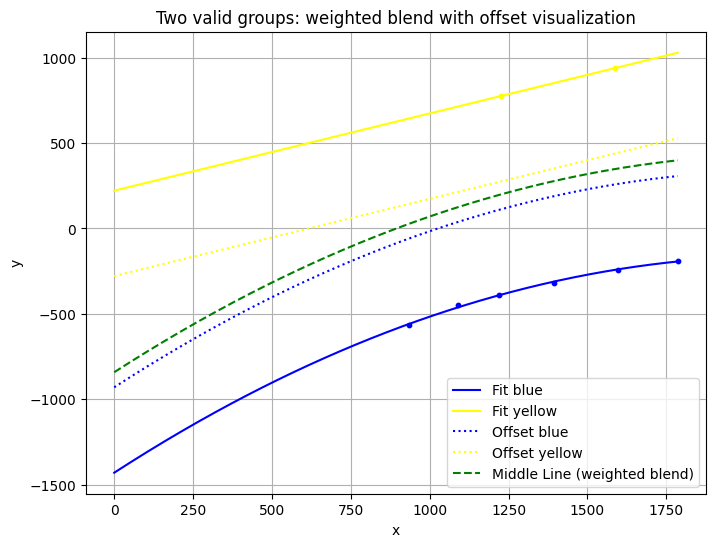

{'x_list': [1486.4281005859375, 835.1312866210938, 990.452880859375, 1496.94873046875, 1293.5211181640625, 1119.49609375, 1686.6571044921875, 1126.3258056640625], 'y_list': [938.3595581054688, -566.4765014648438, -446.7615661621094, -241.9689178466797, -317.9097595214844, -390.5901794433594, -189.7828826904297, 775.6373901367188], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


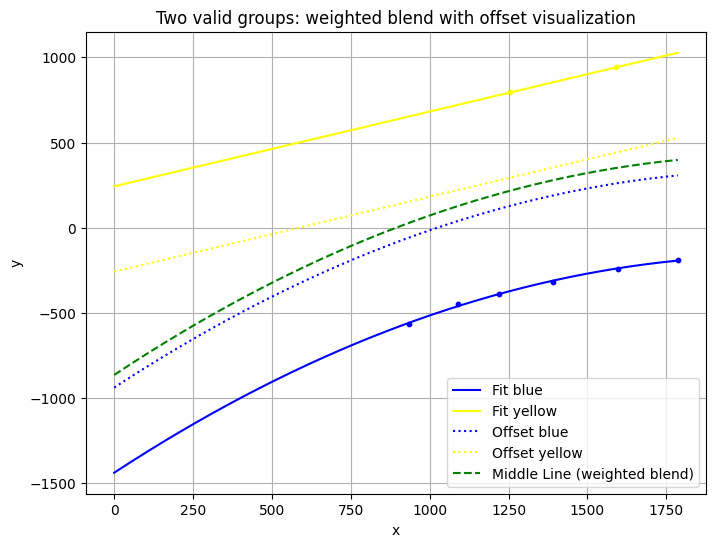

{'x_list': [1491.6295166015625, 833.623779296875, 990.452880859375, 1496.94873046875, 1289.5396728515625, 1119.49609375, 1686.6571044921875, 1155.9176025390625], 'y_list': [941.4361572265625, -566.2966918945312, -446.7615661621094, -241.9689178466797, -317.0014343261719, -389.3846130371094, -189.7828826904297, 794.05615234375], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


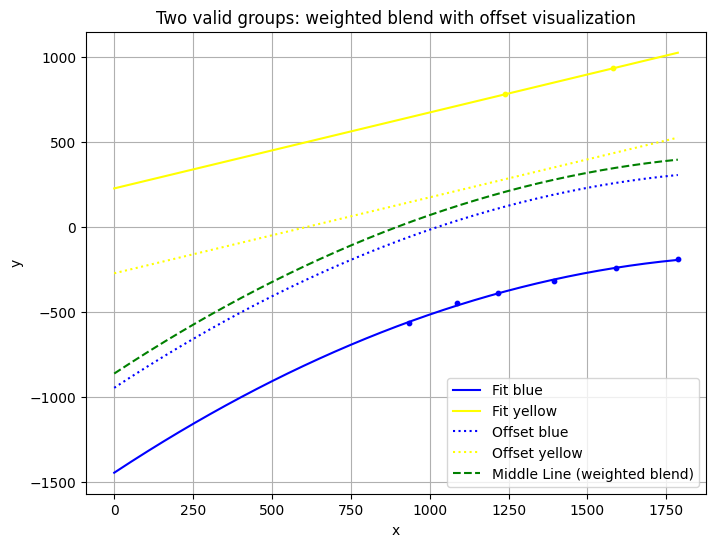

{'x_list': [1481.260498046875, 835.4873046875, 987.9632568359375, 1491.763916015625, 1293.5211181640625, 1116.4166259765625, 1686.6571044921875, 1139.5645751953125], 'y_list': [935.3030395507812, -566.4765014648438, -445.7415466308594, -241.18333435058594, -317.9097595214844, -388.4013366699219, -189.7828826904297, 782.4769287109375], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


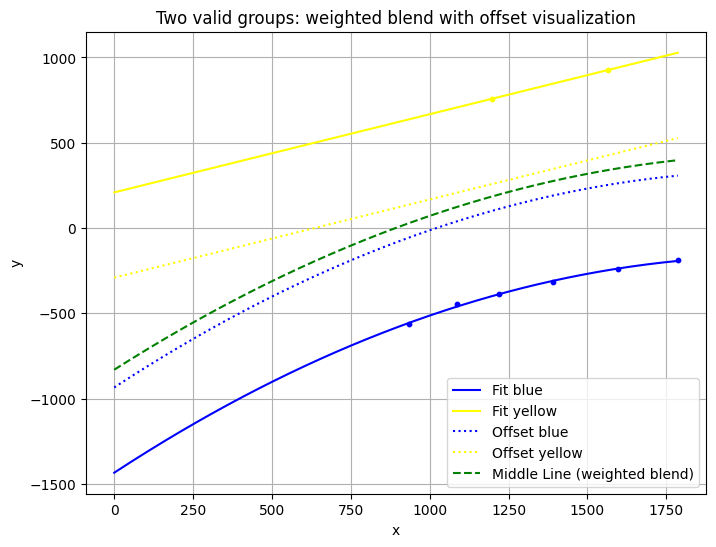

{'x_list': [1465.9580078125, 833.2684326171875, 987.9632568359375, 1496.94873046875, 1289.5396728515625, 1119.49609375, 1686.6571044921875, 1098.9742431640625], 'y_list': [926.2516479492188, -565.3480834960938, -445.7415466308594, -241.9689178466797, -315.6409606933594, -389.3846130371094, -189.7828826904297, 758.0536499023438], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


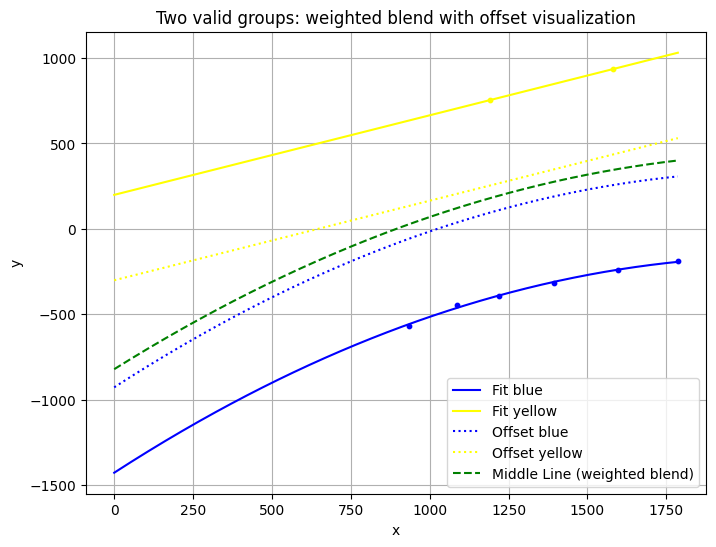

{'x_list': [1481.260498046875, 835.1312866210938, 987.9632568359375, 1496.94873046875, 1293.5211181640625, 1119.49609375, 1686.6571044921875, 1092.517333984375], 'y_list': [935.3030395507812, -566.4765014648438, -445.7415466308594, -241.9689178466797, -317.9097595214844, -390.5901794433594, -189.7828826904297, 754.25390625], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


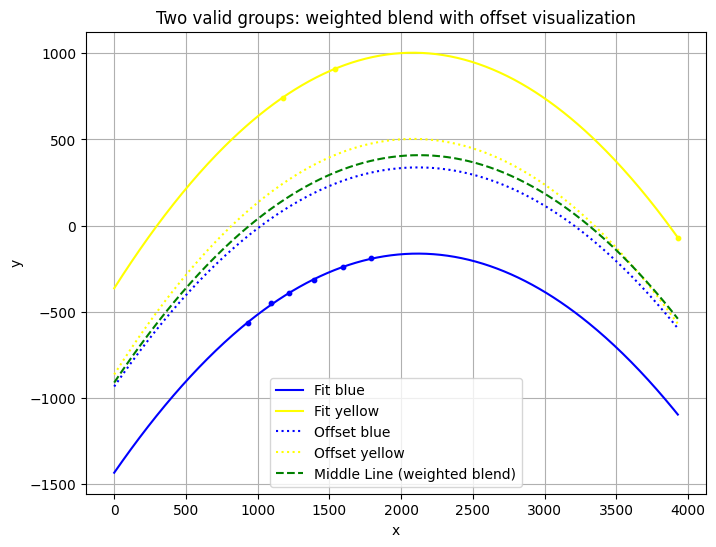

{'x_list': [1436.2247314453125, 835.1312866210938, 990.452880859375, 1496.94873046875, 1293.5211181640625, 1119.49609375, 1686.6571044921875, 3829.054443359375, 1074.850341796875], 'y_list': [908.6646728515625, -566.4765014648438, -446.7615661621094, -241.9689178466797, -317.9097595214844, -389.3846130371094, -189.7828826904297, -69.59590148925781, 743.0797729492188], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


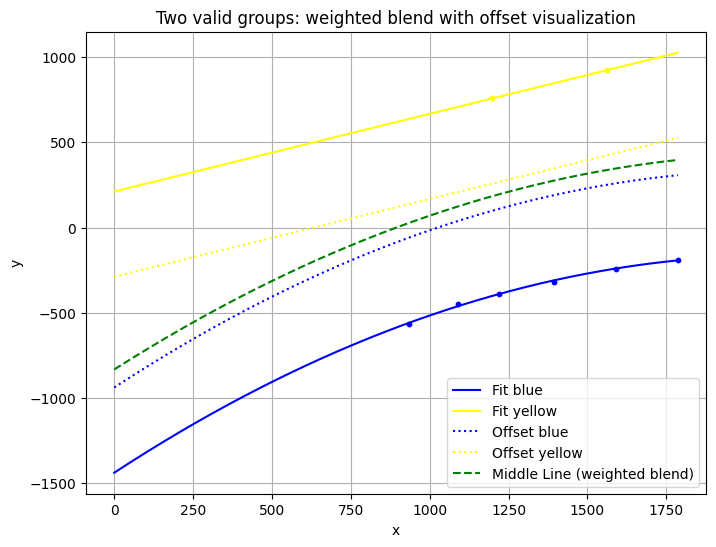

{'x_list': [1460.9228515625, 835.1312866210938, 990.452880859375, 1491.763916015625, 1293.5211181640625, 1119.49609375, 1686.6571044921875, 1098.52490234375], 'y_list': [923.2734375, -566.4765014648438, -446.7615661621094, -241.18333435058594, -317.9097595214844, -389.3846130371094, -189.7828826904297, 758.0536499023438], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


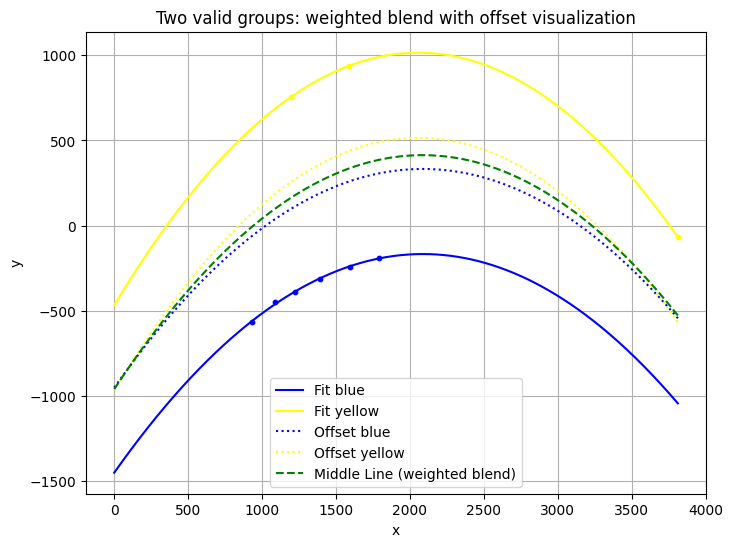

{'x_list': [1486.4281005859375, 835.1312866210938, 990.452880859375, 1491.763916015625, 1293.5211181640625, 1119.49609375, 1693.154052734375, 3711.769287109375, 1095.9617919921875], 'y_list': [938.3595581054688, -566.4765014648438, -446.7615661621094, -241.18333435058594, -316.5453796386719, -389.3846130371094, -190.47299194335938, -67.51840209960938, 756.1490478515625], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


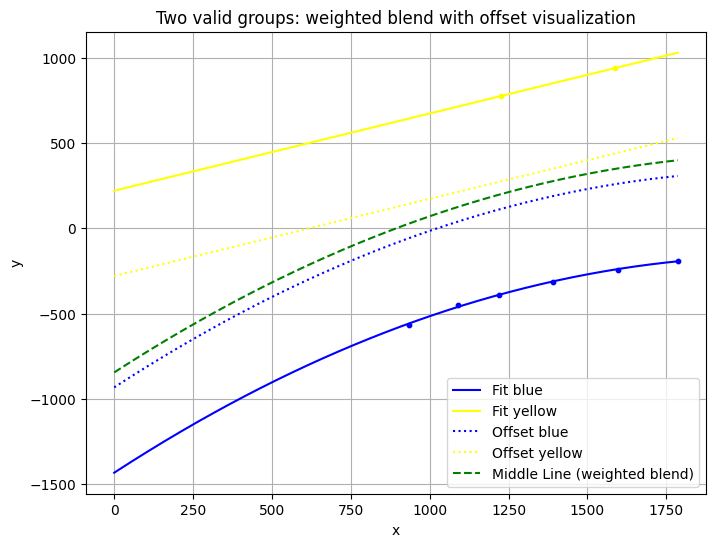

{'x_list': [1486.4281005859375, 833.623779296875, 990.452880859375, 1289.5396728515625, 1496.94873046875, 1119.49609375, 1686.6571044921875, 1126.7855224609375], 'y_list': [938.3595581054688, -565.3480834960938, -446.7615661621094, -317.0014343261719, -241.9689178466797, -389.3846130371094, -189.7828826904297, 775.6373901367188], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


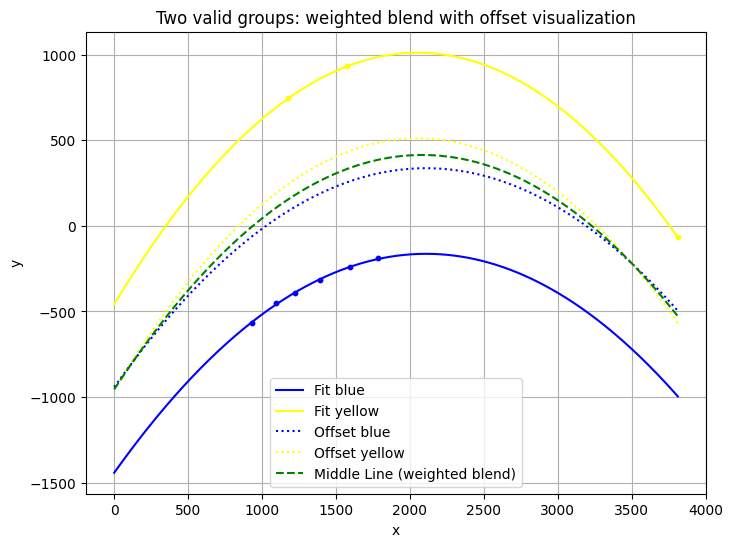

{'x_list': [1476.1265869140625, 835.1312866210938, 992.9539794921875, 1496.94873046875, 1293.5211181640625, 1119.49609375, 1686.6571044921875, 3711.769287109375, 1078.199951171875], 'y_list': [932.2662963867188, -566.4765014648438, -447.7862243652344, -241.9689178466797, -316.5453796386719, -389.3846130371094, -189.7828826904297, -67.51840209960938, 744.9190673828125], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


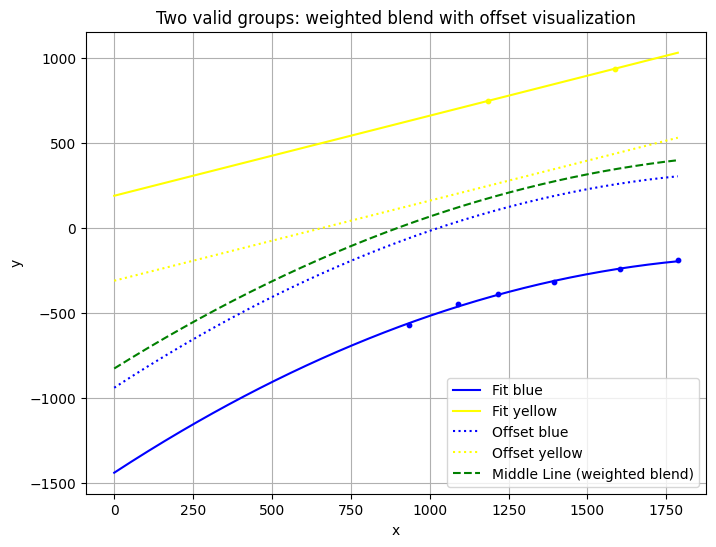

{'x_list': [1486.4281005859375, 835.4873046875, 990.452880859375, 1293.5211181640625, 1502.1676025390625, 1116.4166259765625, 1686.6571044921875, 1083.617919921875], 'y_list': [938.3595581054688, -566.4765014648438, -446.7615661621094, -317.9097595214844, -242.7596893310547, -388.4013366699219, -189.7828826904297, 748.6251831054688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


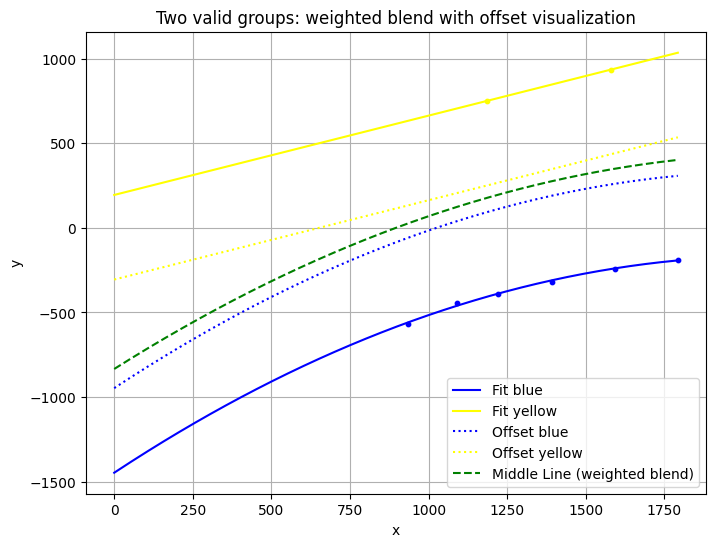

{'x_list': [1481.260498046875, 835.4873046875, 990.452880859375, 1491.763916015625, 1293.5211181640625, 1119.49609375, 1693.154052734375, 1087.014404296875], 'y_list': [935.3030395507812, -566.4765014648438, -446.7615661621094, -241.18333435058594, -317.9097595214844, -389.3846130371094, -190.47299194335938, 750.4920654296875], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


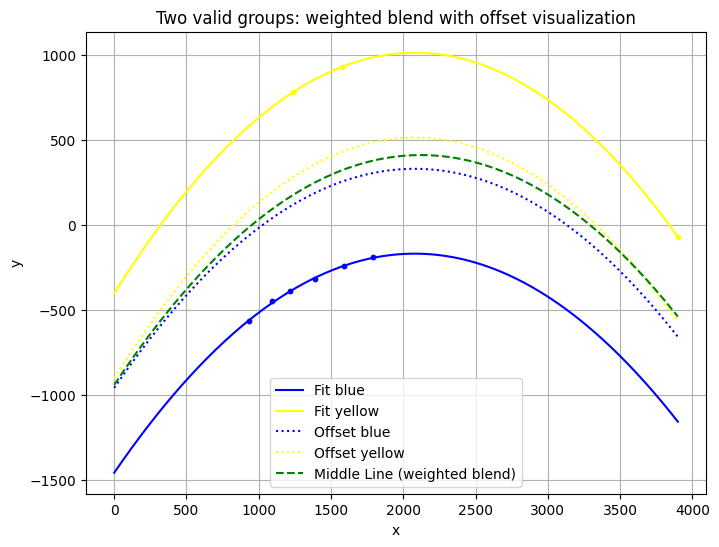

{'x_list': [1476.1265869140625, 835.4873046875, 990.452880859375, 1491.763916015625, 1289.5396728515625, 1119.49609375, 1693.154052734375, 3799.061767578125, 1139.0999755859375], 'y_list': [932.2662963867188, -566.4765014648438, -446.7615661621094, -241.18333435058594, -317.0014343261719, -389.3846130371094, -190.47299194335938, -69.06462860107422, 783.7169799804688], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


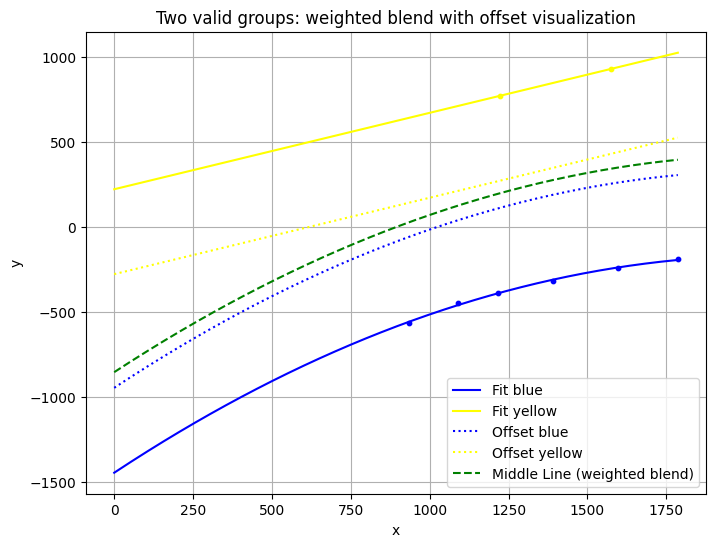

{'x_list': [1576.1265869140625, 933.623779296875, 1090.452880859375, 1596.94873046875, 1389.5396728515625, 1216.4166259765625, 1786.6571044921875, 1223.6318359375], 'y_list': [932.2662963867188, -565.3480834960938, -446.7615661621094, -241.9689178466797, -315.6409606933594, -388.4013366699219, -189.7828826904297, 773.6434326171875], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


In [116]:
'''
filename = os.path.join(os.getcwd(), "detection_results.json")
with open(filename, 'r', encoding='utf-8') as f:
    frames = json.load(f)

frame = frames[60]
'''
#frame = {"x_list": [1591.6295166015625, 937.0015258789062, 1090.452880859375, 1596.94873046875, 1393.5211181640625, 1222.59130859375, 1786.6571044921875, 1183.617919921875], "y_list": [941.4361572265625, -567.6094970703125, -446.7615661621094, -241.9689178466797, -316.5453796386719, -390.3728942871094, -189.7828826904297, 748.6251831054688], "c_list": [0, 1, 1, 1, 1, 1, 1, 0], "n": 8}
#poly_middle = generate_middle_line(frame)

filename = os.path.join(os.getcwd(), "detection_results.json")
Global_Map = {"x_list":[], "y_list":[], "c_list":[]}
for i, frame in enumerate(iter_frames(filename), 1):
    if is_empty_detection(frame):
      continue

    if is_empty_detection(Global_Map):
      Global_Map = frame_to_map(frame)


    else:
        heading = frame.get("heading_angle_in_radians", 0.0)
        wheel_speed = frame.get("wheel_speed", 1000)
        predicted_map = update_Cones_Map(heading, wheel_speed, Global_Map)
        print(predicted_map)

        predicted_filtered = filter_x_range(predicted_map, x_min=0.0, x_max=750.0)

        current_map = frame_to_map(frame)

        fused_map = merge_maps(current_map, predicted_filtered)

        poly_middle = generate_middle_line(fused_map)

        Global_Map = fused_map

print(Global_Map)

